In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Dataset DateTime Setting**

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib
import seaborn as sns
from sklearn import metrics
import tensorflow as tf
from tensorflow import keras

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
from keras.callbacks import ModelCheckpoint
from matplotlib.pyplot import figure
figure(figsize=(15, 8), dpi=100)


<Figure size 1500x800 with 0 Axes>

<Figure size 1500x800 with 0 Axes>

In [ ]:
matplotlib.rc('xtick', labelsize=25) 
matplotlib.rc('ytick', labelsize=25)
plt.rc('axes', labelsize=30)
plt.rc('axes', titlesize=30)
plt.rc('legend', fontsize=25)

In [ ]:
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 20)

In [ ]:
sns.set(rc = {'figure.figsize':(15,8)})

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/FYP complete files/Hawaii 15224_19.65_-155.54_1998 dataset.csv')
df.head()

,Year,Month,Day,Hour,Minute,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature
0,1998,1,1,0,0,0,0,0,14.0,173.14,2.4,1.839,105.4,88.72,13.0
1,1998,1,1,0,30,0,0,0,14.0,176.50,2.3,1.818,105.4,88.71,13.0
2,1998,1,1,1,0,0,0,0,14.0,171.33,2.3,1.798,106.9,88.10,13.0
3,1998,1,1,1,30,0,0,0,14.0,164.66,2.1,1.780,106.9,93.90,13.0
4,1998,1,1,2,0,0,0,0,13.0,157.81,2.0,1.762,106.7,93.39,13.0


In [ ]:
df.dtypes

Year                    int64
Month                   int64
Day                     int64
Hour                    int64
Minute                  int64
GHI                     int64
Clearsky GHI            int64
Cloud Type              int64
Dew Point             float64
Solar Zenith Angle    float64
Wind Speed            float64
Precipitable Water    float64
Wind Direction        float64
Relative Humidity     float64
Temperature           float64
dtype: object

In [ ]:
df['Date']=df['Year'].astype(str) + df['Month'].astype(str).str.zfill(2) + df['Day'].astype(str).str.zfill(2) + df['Hour'].astype(str).str.zfill(2)+ df['Minute'].astype(str).str.zfill(2)
df.Date

0         199801010000
1         199801010030
2         199801010100
3         199801010130
4         199801010200
              ...     
402955    202012312130
402956    202012312200
402957    202012312230
402958    202012312300
402959    202012312330
Name: Date, Length: 402960, dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y%m%d%H%M')
df.head()

,Year,Month,Day,Hour,Minute,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Date
0,1998,1,1,0,0,0,0,0,14.0,173.14,2.4,1.839,105.4,88.72,13.0,1998-01-01 00:00:00
1,1998,1,1,0,30,0,0,0,14.0,176.50,2.3,1.818,105.4,88.71,13.0,1998-01-01 00:30:00
2,1998,1,1,1,0,0,0,0,14.0,171.33,2.3,1.798,106.9,88.10,13.0,1998-01-01 01:00:00
3,1998,1,1,1,30,0,0,0,14.0,164.66,2.1,1.780,106.9,93.90,13.0,1998-01-01 01:30:00
4,1998,1,1,2,0,0,0,0,13.0,157.81,2.0,1.762,106.7,93.39,13.0,1998-01-01 02:00:00


In [ ]:
df = df.drop(labels = ['Year', 'Month',	'Day',	'Hour',	'Minute'], axis=1)

In [ ]:
df.set_index('Date', inplace = True)
df.head()

,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature
Date,,,,,,,,,,
1998-01-01 00:00:00,0,0,0,14.0,173.14,2.4,1.839,105.4,88.72,13.0
1998-01-01 00:30:00,0,0,0,14.0,176.50,2.3,1.818,105.4,88.71,13.0
1998-01-01 01:00:00,0,0,0,14.0,171.33,2.3,1.798,106.9,88.10,13.0
1998-01-01 01:30:00,0,0,0,14.0,164.66,2.1,1.780,106.9,93.90,13.0
1998-01-01 02:00:00,0,0,0,13.0,157.81,2.0,1.762,106.7,93.39,13.0


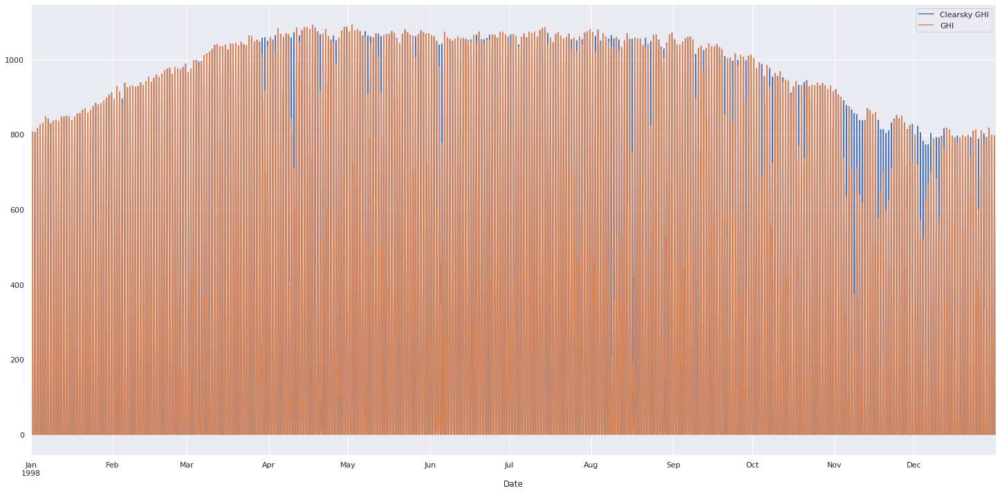

In [ ]:
df['Clearsky GHI'][:17520].plot(figsize=(25,12), label='Clearsky GHI')
df['GHI'][:17520].plot(figsize=(25,12), label='GHI')
plt.legend()
#plt.savefig('/content/drive/MyDrive/FYP complete files/Images Hawaii/Hawaii Data plot 1998.png', dpi = 120)

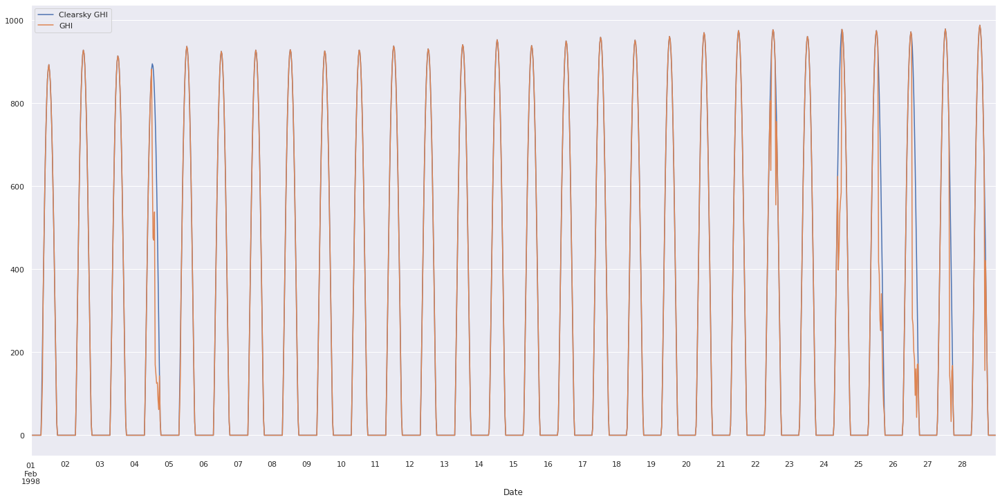

In [ ]:
df['Clearsky GHI'][1488:2832].plot(figsize=(25,12), label='Clearsky GHI')
df['GHI'][1488:2832].plot(figsize=(25,12), label='GHI')
plt.legend()

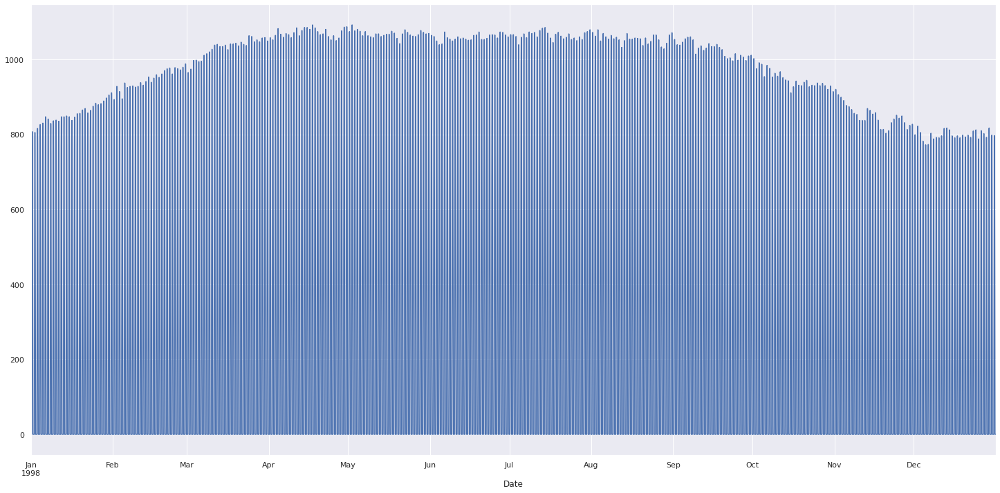

In [ ]:
df['Clearsky GHI'][:17520].plot(figsize=(25,12), label='Clearsky GHI')

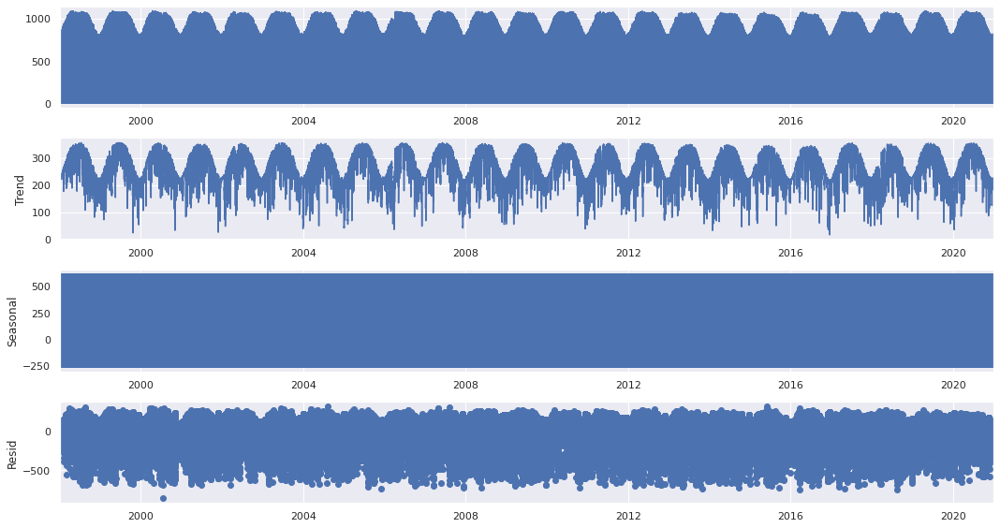

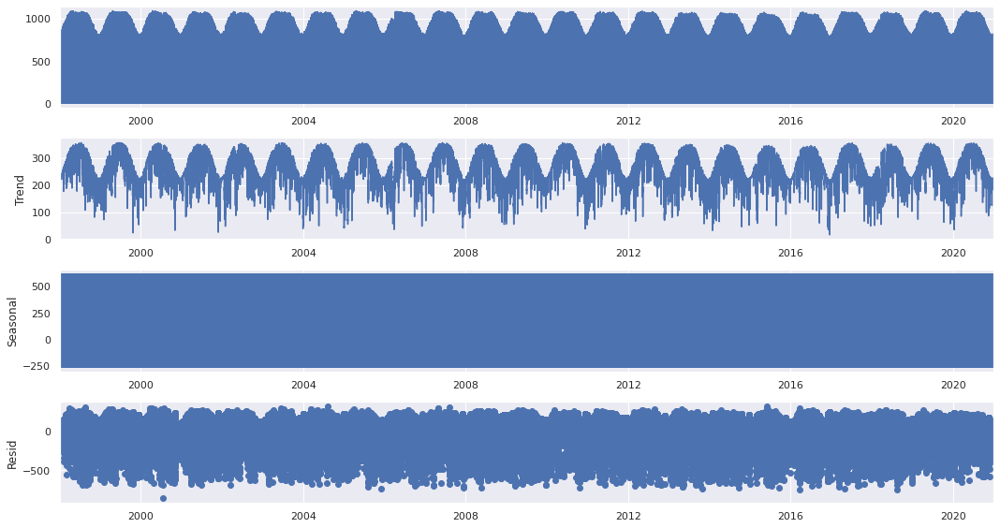

In [ ]:
from pandas.core.internals.construction import treat_as_nested
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

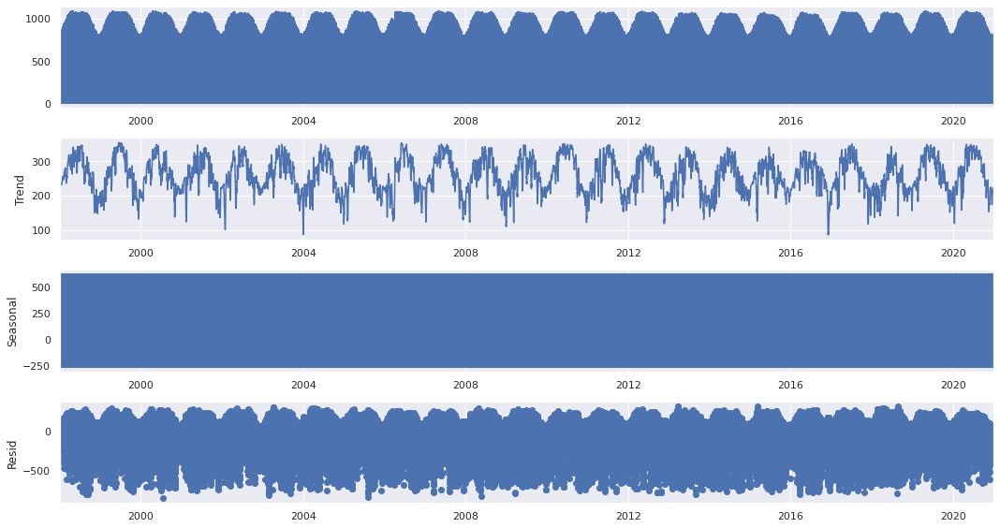

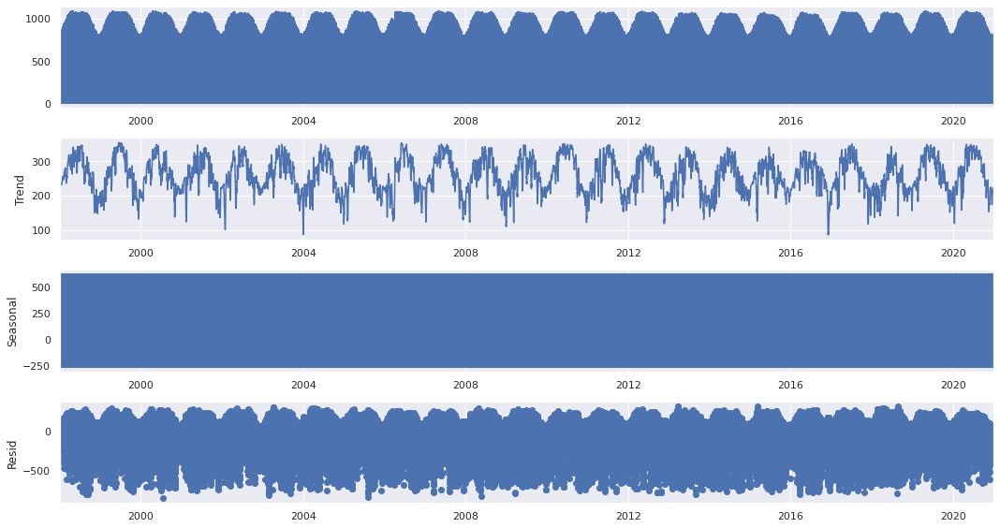

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*7)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

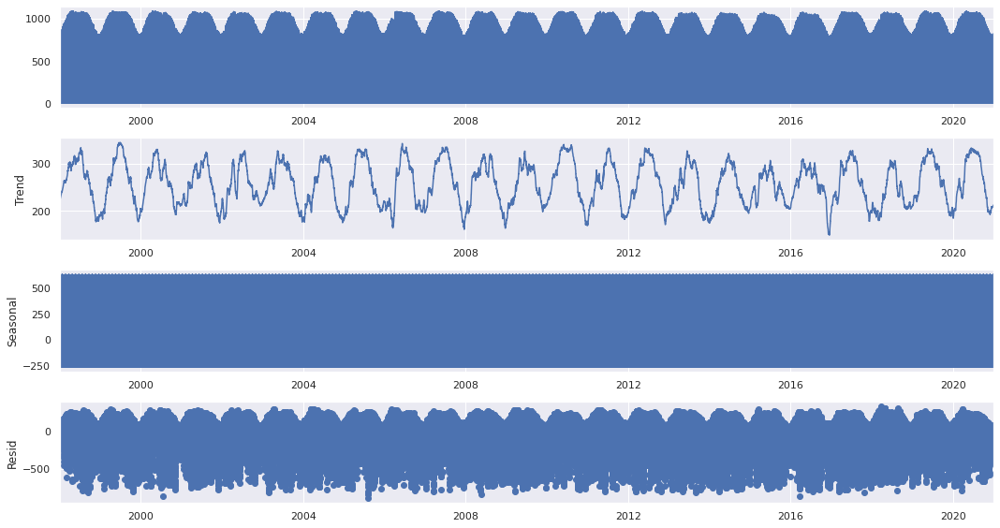

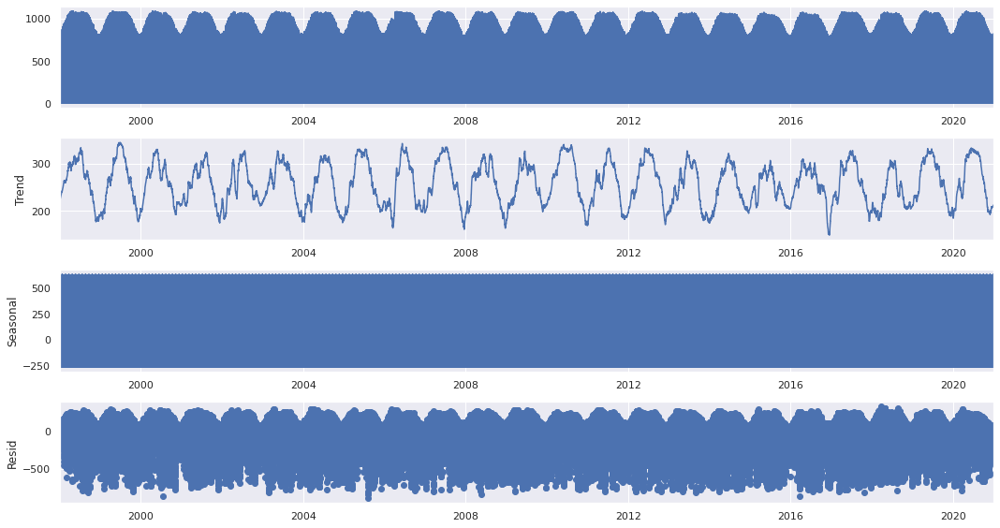

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*30)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

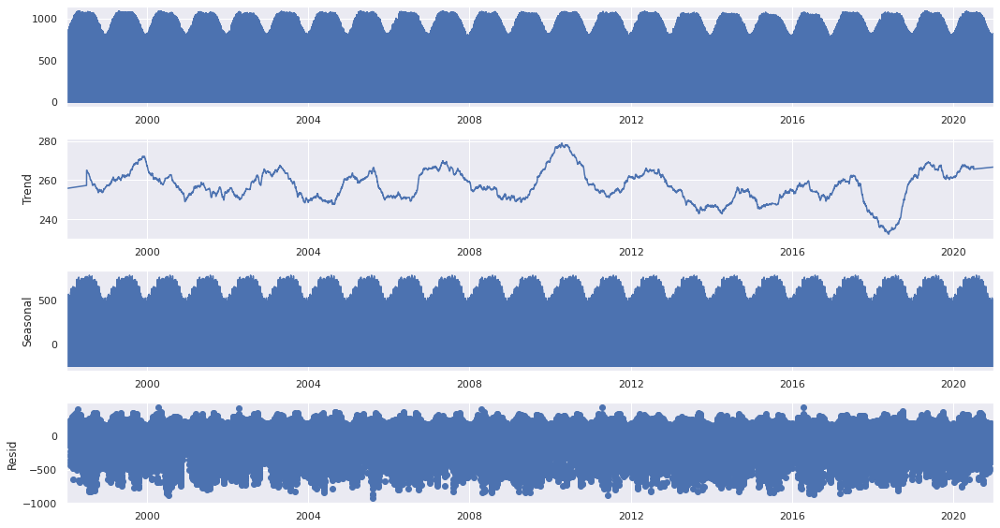

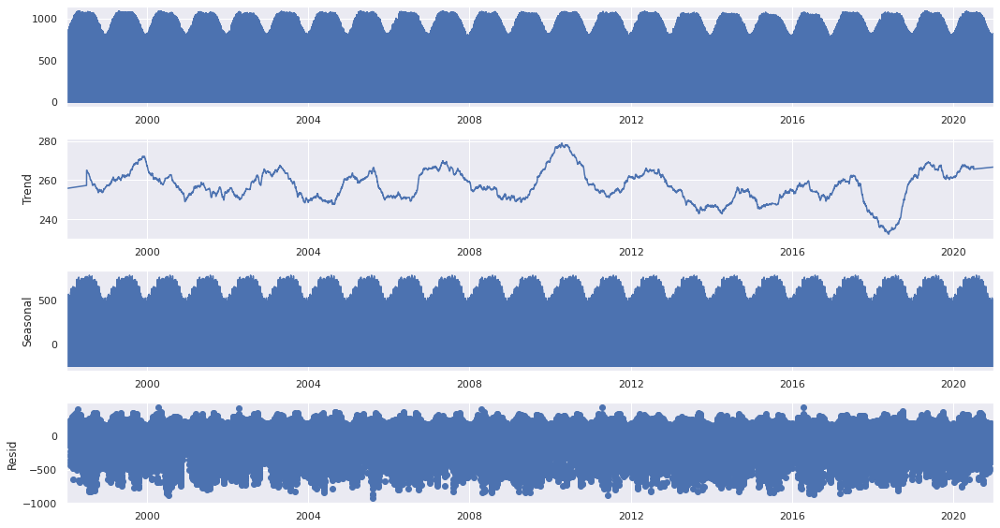

In [ ]:
analysis = df[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*365)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

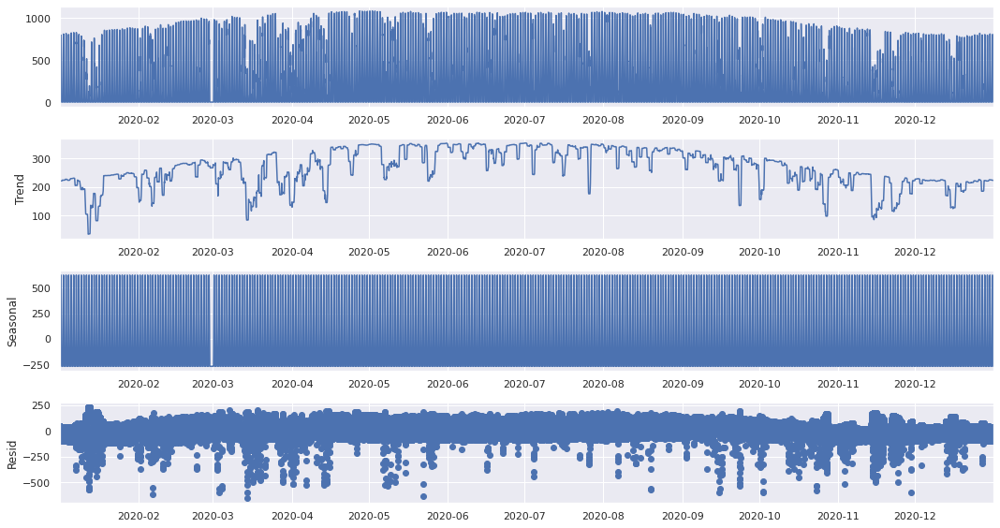

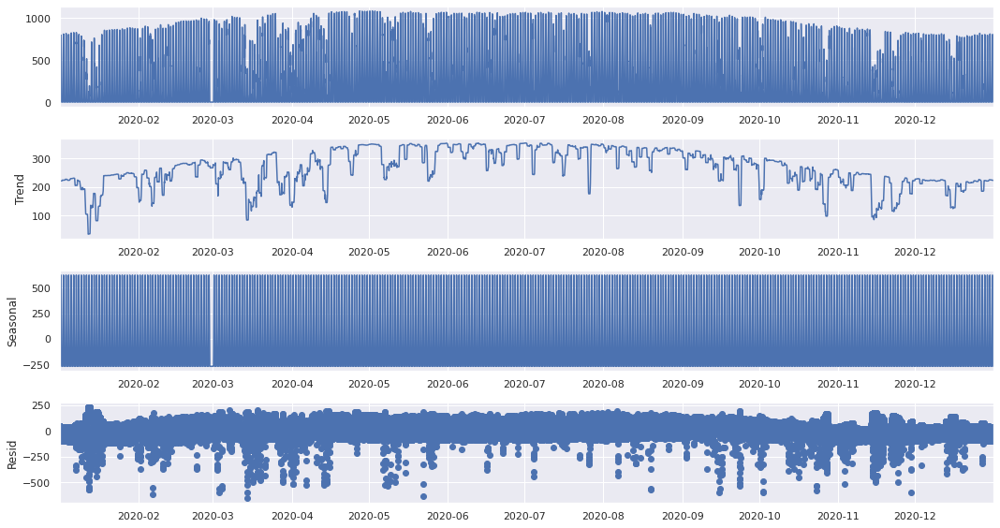

In [ ]:
maskd = (df.index > '2020-01-01') & (df.index <= '2021-01-01')
seasonality = df.loc[maskd]
seasonality = seasonality.dropna()
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

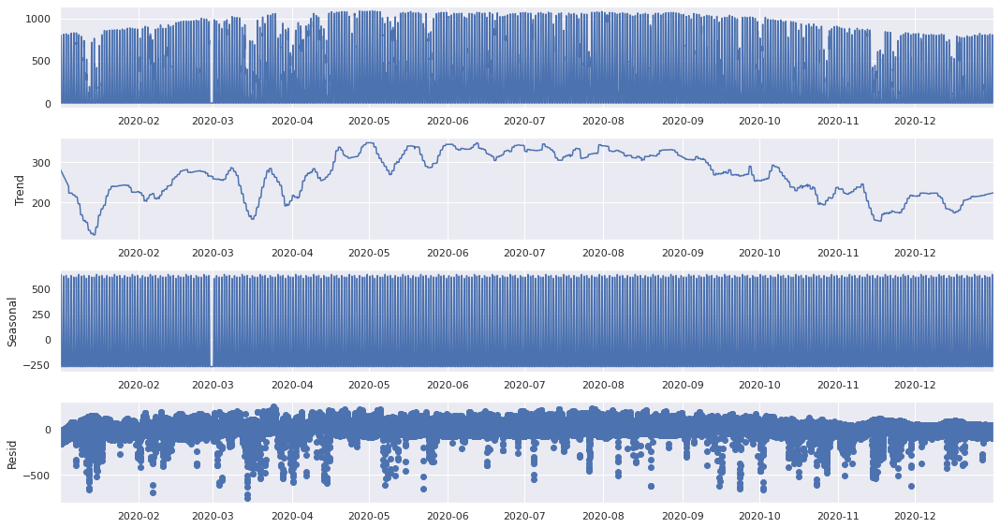

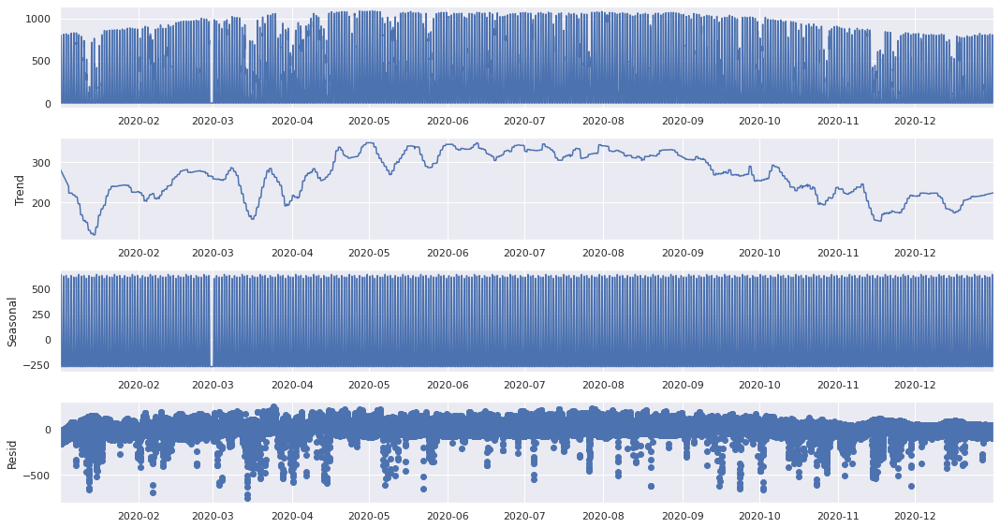

In [ ]:
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*7)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

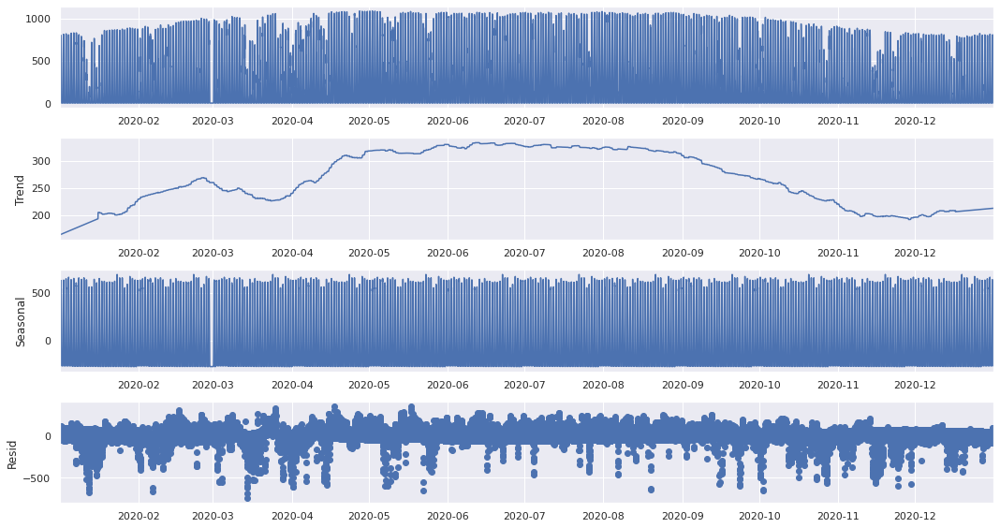

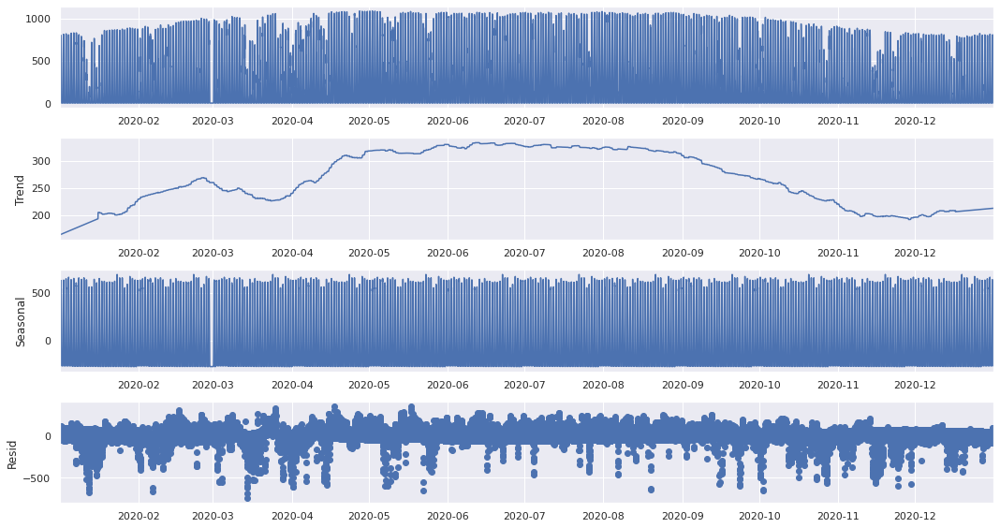

In [ ]:
analysis = seasonality[['GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='additive', extrapolate_trend='freq', period=48*30)

trend = decompose_result_mult.trend
seasonal = decompose_result_mult.seasonal
residual = decompose_result_mult.resid

decompose_result_mult.plot()

# **Box Plot and Histogram**

In [ ]:
Dailybox = df
Dailybox = Dailybox.reset_index()
Dailybox=Dailybox.resample('H',on='Date').mean()
Dailybox = Dailybox.reset_index()
Dailybox = Dailybox.resample('D', on='Date').sum()
Dailybox['Month'] = Dailybox.index.month_name()
Dailybox.head()

,GHI,Clearsky GHI,Cloud Type,Dew Point,Solar Zenith Angle,Wind Speed,Precipitable Water,Wind Direction,Relative Humidity,Temperature,Month
Date,,,,,,,,,,,
1998-01-01,5358.5,5358.5,12.0,336.0,2424.745,34.00,42.9520,2773.9,2122.050,336.0,January
1998-01-02,5301.5,5301.5,18.5,325.0,2423.995,25.45,41.2075,2919.9,2046.745,336.0,January
1998-01-03,5358.5,5403.5,22.0,323.0,2423.270,13.90,35.3105,5237.6,1971.675,353.0,January
1998-01-04,5491.0,5491.0,8.5,308.0,2422.400,25.35,32.3785,5986.2,1876.245,354.5,January
1998-01-05,5535.0,5535.0,26.5,283.0,2421.535,97.00,31.9155,5204.0,1814.025,348.5,January


<function matplotlib.pyplot.show(*args, **kw)>

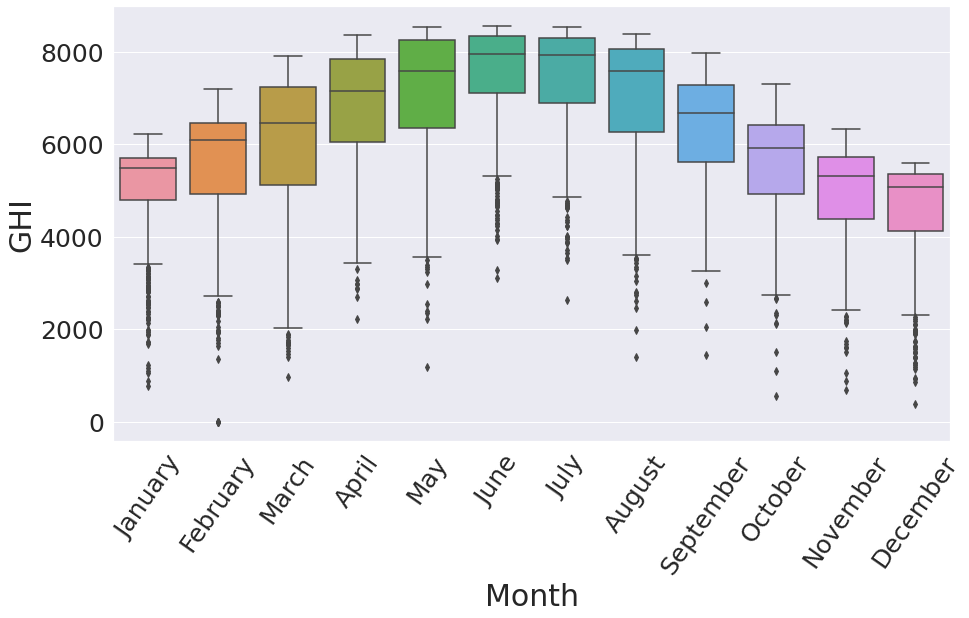

In [ ]:
q=sns.boxplot(x="Month",y="GHI",data=Dailybox)
q.set_xlabel("Month",fontsize=30)
q.set_ylabel("GHI",fontsize=30)
q.tick_params(labelsize=25, axis='x', rotation=55)
q.tick_params(labelsize=25, axis='y')
plt.show

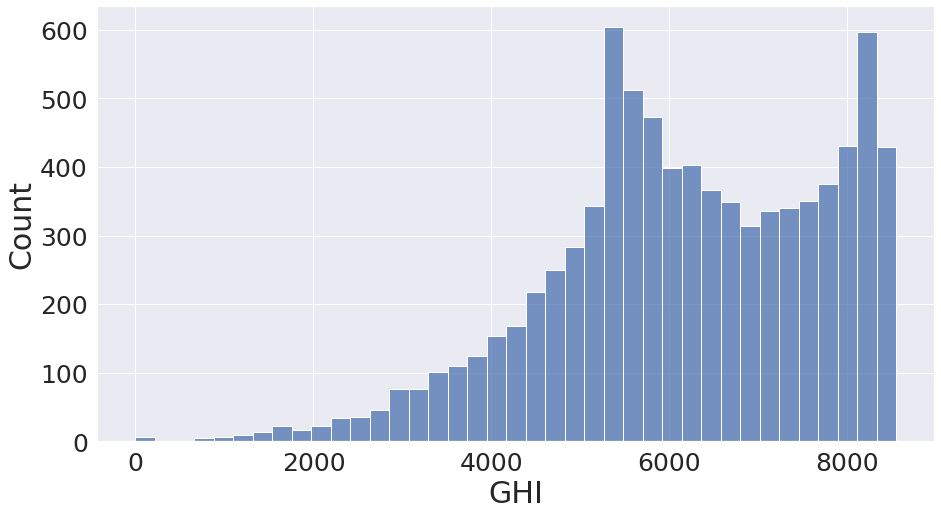

In [ ]:
q=sns.histplot(x='GHI', data=Dailybox, )
q.set_xlabel("GHI",fontsize=30)
q.set_ylabel("Count",fontsize=30)
q.tick_params(labelsize=25)
plt.show()

# **Feature Selection and Correlation Matrix**

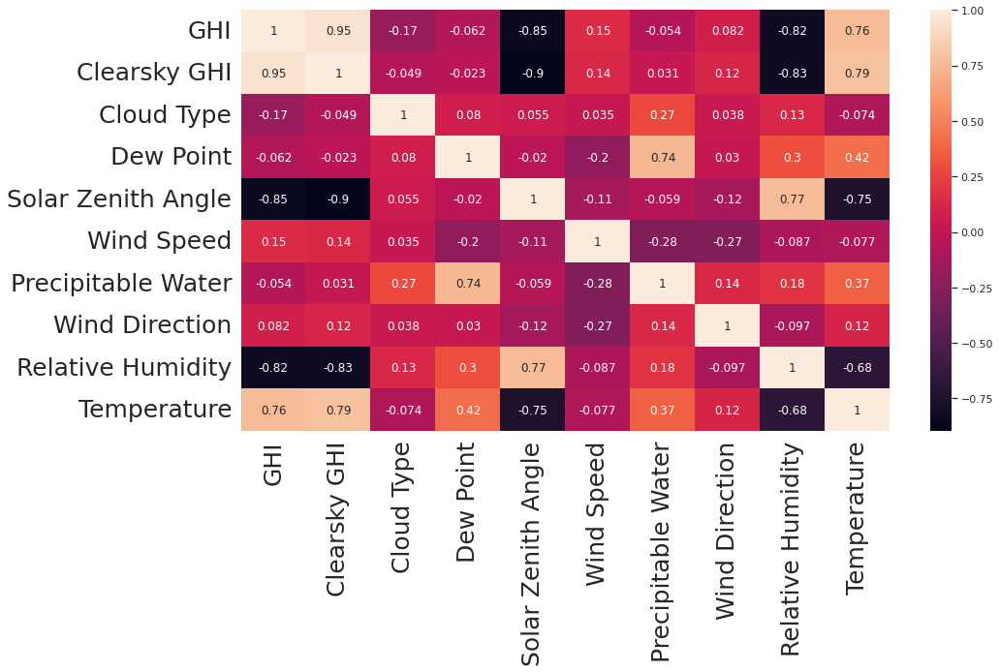

In [ ]:
corrMatrix = df.corr()
a = sns.heatmap(corrMatrix, annot=True)
a.tick_params(labelsize=25, axis='x')
a.tick_params(labelsize=25, axis='y')
plt.show()

In [ ]:
df = df.drop(labels = ['Dew Point',	'Wind Speed',	'Precipitable Water',	'Wind Direction'], axis=1)
df.head()

,GHI,Clearsky GHI,Cloud Type,Solar Zenith Angle,Relative Humidity,Temperature
Date,,,,,,
1998-01-01 00:00:00,0,0,0,173.14,88.72,13.0
1998-01-01 00:30:00,0,0,0,176.50,88.71,13.0
1998-01-01 01:00:00,0,0,0,171.33,88.10,13.0
1998-01-01 01:30:00,0,0,0,164.66,93.90,13.0
1998-01-01 02:00:00,0,0,0,157.81,93.39,13.0


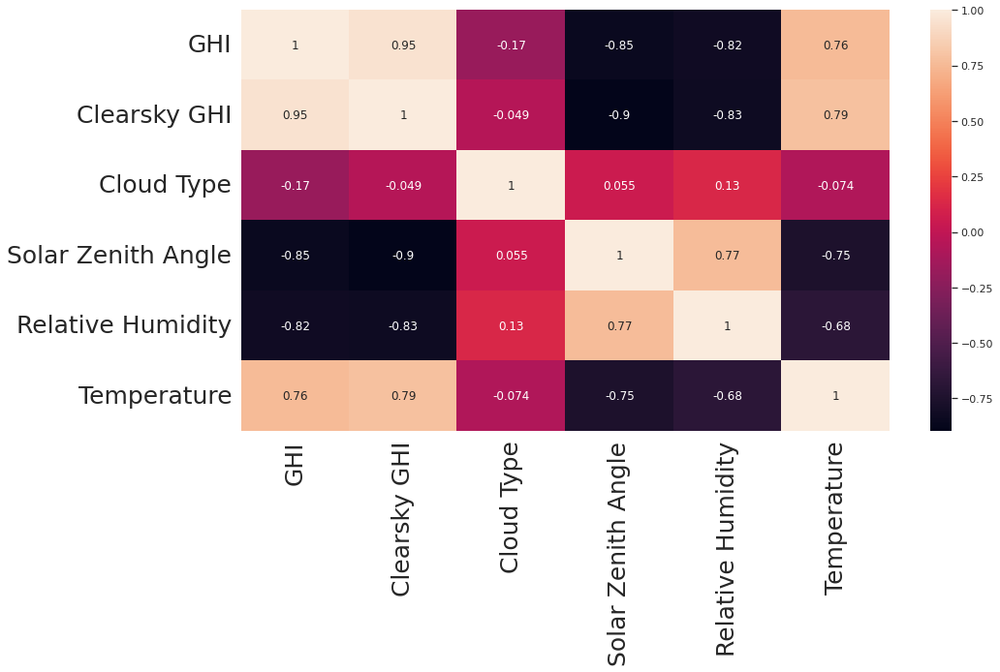

In [ ]:
corrMatrixUpdate = df.corr()
b = sns.heatmap(corrMatrixUpdate, annot=True)
b.tick_params(labelsize=25, axis='x', rotation=90 )
b.tick_params(labelsize=25, axis='y')
plt.show()

# **ONE HOT ENCODING**

In [ ]:
ohe = pd.get_dummies(df['Cloud Type'], drop_first=True)
ohe.columns = ['Probably Clear', 'Fog', 'Water', 'Super-Cooled Water', 'Mixed', 'Opaque Ice', 'Cirrus', 'Overlapping', 'Overshooting'] 
# (Clear Sky) is the first column which is dropped.  
ohe.head()

,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting
Date,,,,,,,,,
1998-01-01 00:00:00,0,0,0,0,0,0,0,0,0
1998-01-01 00:30:00,0,0,0,0,0,0,0,0,0
1998-01-01 01:00:00,0,0,0,0,0,0,0,0,0
1998-01-01 01:30:00,0,0,0,0,0,0,0,0,0
1998-01-01 02:00:00,0,0,0,0,0,0,0,0,0


In [ ]:
dfohe = pd.concat([df,ohe], axis = 'columns')
dfohe = dfohe.drop(['Cloud Type'], axis = 'columns')
dfohe.head(10)

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting
Date,,,,,,,,,,,,,,
1998-01-01 00:00:00,0,0,173.14,88.72,13.0,0,0,0,0,0,0,0,0,0
1998-01-01 00:30:00,0,0,176.50,88.71,13.0,0,0,0,0,0,0,0,0,0
1998-01-01 01:00:00,0,0,171.33,88.10,13.0,0,0,0,0,0,0,0,0,0
1998-01-01 01:30:00,0,0,164.66,93.90,13.0,0,0,0,0,0,0,0,0,0
1998-01-01 02:00:00,0,0,157.81,93.39,13.0,0,0,0,0,0,0,0,0,0
1998-01-01 02:30:00,0,0,150.91,93.38,13.0,1,0,0,0,0,0,0,0,0
1998-01-01 03:00:00,0,0,144.01,93.28,13.0,1,0,0,0,0,0,0,0,0
1998-01-01 03:30:00,0,0,137.12,93.29,13.0,1,0,0,0,0,0,0,0,0
1998-01-01 04:00:00,0,0,130.25,93.66,13.0,1,0,0,0,0,0,0,0,0


# **Clearness Index**

In [ ]:
df1 = dfohe
df1['clearness-index'] = df1['GHI'].astype(float) / df1['Clearsky GHI'].astype(float)
#df2=df1.between_time('08:00','16:30')
print(df1['clearness-index'].isna().sum())

202844


In [ ]:
dftemp = df1
df1 = df1.dropna()
df1

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
1998-01-01 07:30:00,82,82,83.77,90.60,13.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 08:00:00,190,190,77.57,91.17,14.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 08:30:00,303,303,71.58,91.19,14.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 09:00:00,411,411,65.85,86.51,14.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 09:30:00,511,511,60.46,86.50,14.0,0,0,0,0,0,0,0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 16:00:00,379,379,67.54,80.20,16.3,0,0,0,0,0,0,0,0,0,1.0
2020-12-31 16:30:00,268,268,73.33,83.86,15.6,0,0,0,0,0,0,0,0,0,1.0
2020-12-31 17:00:00,156,156,79.36,92.64,14.8,0,0,0,0,0,0,0,0,0,1.0


# **Seasonality Analysis**

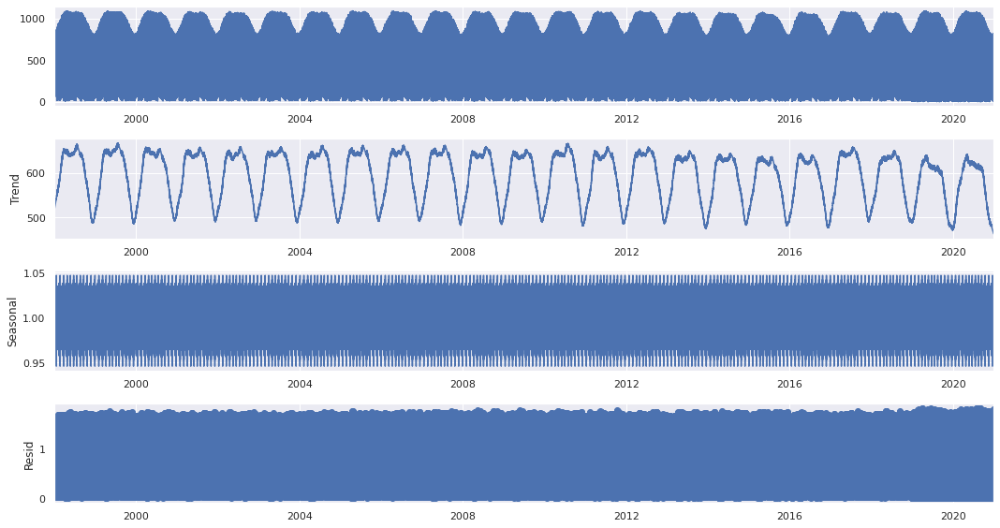

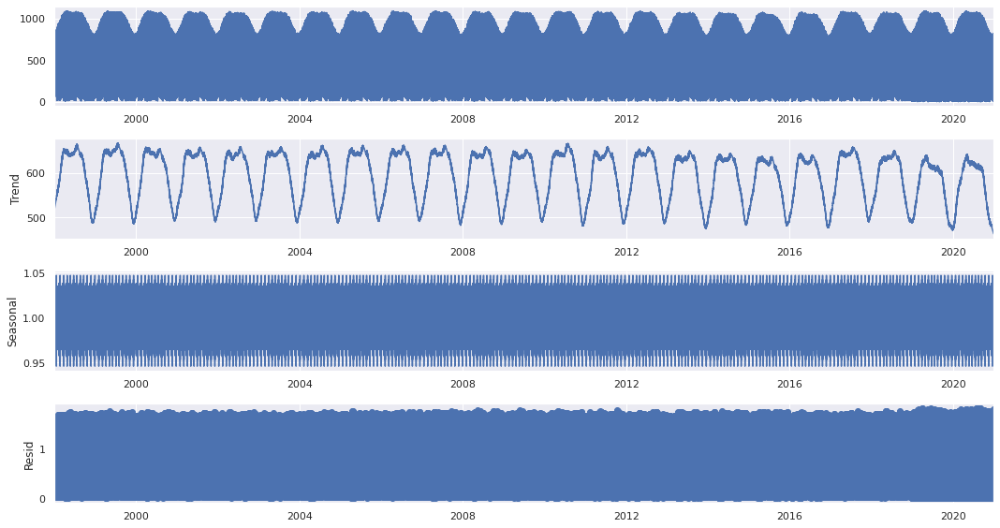

In [ ]:
from pandas.core.internals.construction import treat_as_nested
from statsmodels.tsa.seasonal import seasonal_decompose
analysis = df1[['Clearsky GHI']].copy()

decompose_result_mult = seasonal_decompose(analysis, model='multiplicative', extrapolate_trend='freq', period=25*30)

#trend = decompose_result_mult.trend
#seasonal = decompose_result_mult.seasonal
#residual = decompose_result_mult.resid

decompose_result_mult.plot()

<function matplotlib.pyplot.show(*args, **kw)>

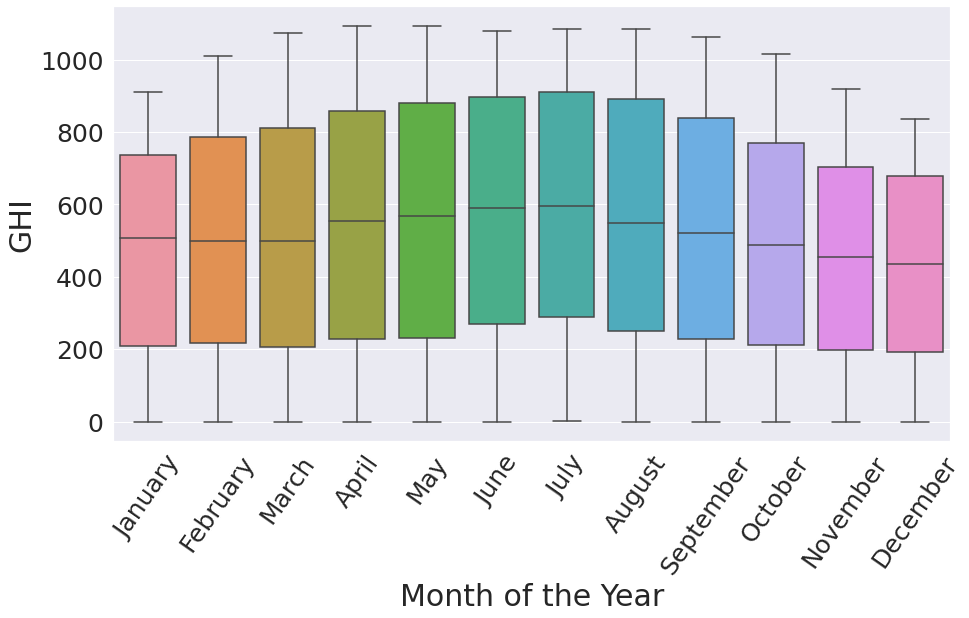

In [ ]:
df1box = dftemp
df1box['Month'] = df1box.index.month_name()
df1box = df1box.dropna()
r=sns.boxplot(x="Month",y="GHI",data=df1box)
r.set_xlabel("Month of the Year",fontsize=30)
r.set_ylabel("GHI",fontsize=30)
r.tick_params(labelsize=25, axis='x', rotation=55)
r.tick_params(labelsize=25, axis='y')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

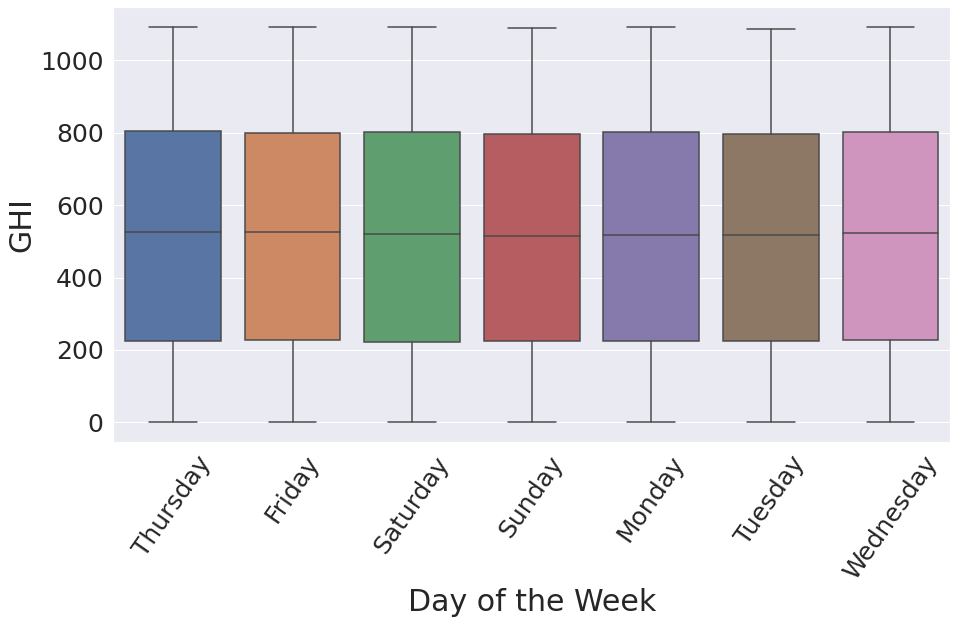

In [ ]:
df3box = dftemp
df3box['Month'] = df3box.index.day_name()
df3box = df3box.dropna()
t=sns.boxplot(x="Month",y="GHI",data=df3box)
t.set_xlabel("Day of the Week",fontsize=30)
t.set_ylabel("GHI",fontsize=30)
t.tick_params(labelsize=25, axis='x', rotation=55)
t.tick_params(labelsize=25, axis='y')
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

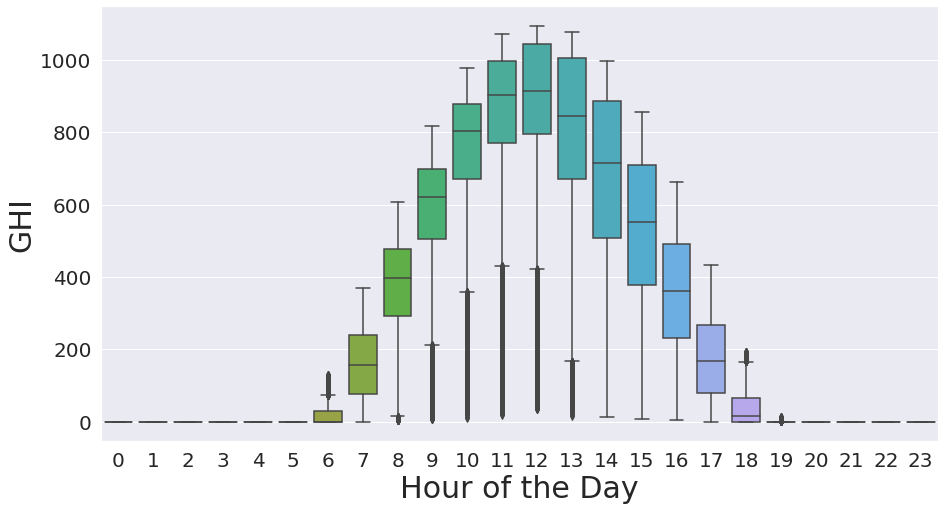

In [ ]:
df4box = df
df4box['Hour'] = df4box.index.hour
df4box = df4box.dropna()
u=sns.boxplot(x="Hour",y="GHI",data=df4box)
u.set_xlabel("Hour of the Day",fontsize=30)
u.set_ylabel("GHI",fontsize=30)
u.tick_params(labelsize=20)
plt.show

<function matplotlib.pyplot.show(*args, **kw)>

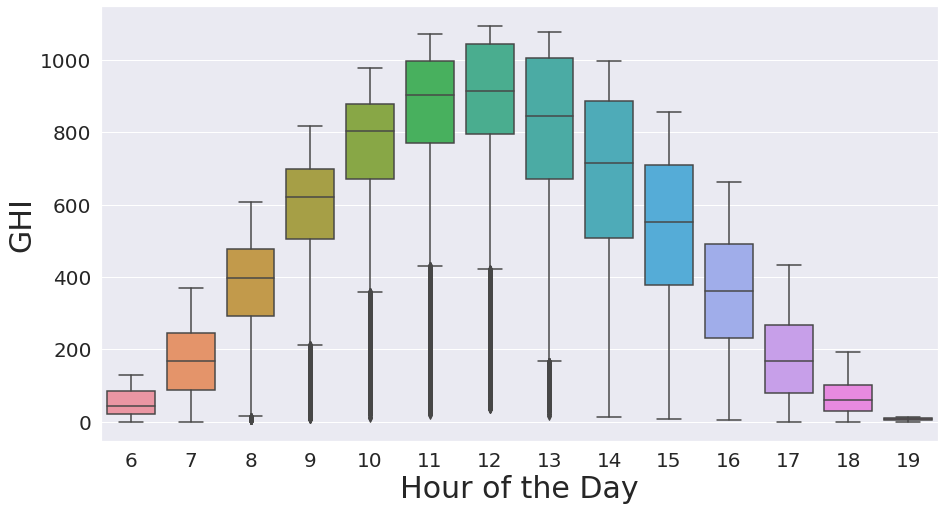

In [ ]:
df2box = dftemp
df2box['Hour'] = df2box.index.hour
df2box = df2box.dropna()
s=sns.boxplot(x="Hour",y="GHI",data=df2box)
s.set_xlabel("Hour of the Day",fontsize=30)
s.set_ylabel("GHI",fontsize=30)
s.tick_params(labelsize=20)
plt.show


# **Train Test Validation Split**

In [ ]:
#df1 = df1.drop(['Month'], axis = 'columns')
mask1 = (df1.index > '1998-01-01') & (df1.index <= '2018-12-29')
dftrain = df1.loc[mask1]
traindates = dftrain.index
dftrain.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
1998-01-01 07:30:00,82,82,83.77,90.60,13.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 08:00:00,190,190,77.57,91.17,14.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 08:30:00,303,303,71.58,91.19,14.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 09:00:00,411,411,65.85,86.51,14.0,0,0,0,0,0,0,0,0,0,1.0
1998-01-01 09:30:00,511,511,60.46,86.50,14.0,0,0,0,0,0,0,0,0,0,1.0


In [ ]:
mask2 = (df1.index > '2018-12-29') & (df1.index <= '2019-12-29')
dfval = df1.loc[mask2]
valdates = dfval.index
dfval.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2018-12-29 07:30:00,25,82,83.44,100.00,15.5,0,0,0,0,0,0,1,0,0,0.304878
2018-12-29 08:00:00,115,187,77.31,100.00,15.9,0,0,0,0,0,0,1,0,0,0.614973
2018-12-29 08:30:00,192,297,71.36,100.00,16.2,0,0,0,0,0,0,1,0,0,0.646465
2018-12-29 09:00:00,291,404,65.67,100.00,16.5,0,0,0,0,0,0,1,0,0,0.720297
2018-12-29 09:30:00,308,504,60.33,99.59,16.8,0,0,0,0,0,0,1,0,0,0.611111


In [ ]:
mask3 = (df1.index > '2019-12-29') & (df1.index <= '2021-01-01')
dftest = df1.loc[mask3]
testdates = dftest.index
dftest.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2019-12-29 07:00:00,13,13,89.47,100.00,13.7,0,0,0,0,0,0,0,0,0,1.0
2019-12-29 07:30:00,91,91,83.41,100.00,14.6,0,0,0,0,0,0,0,0,0,1.0
2019-12-29 08:00:00,199,199,77.28,98.54,15.4,0,0,0,0,0,0,0,0,0,1.0
2019-12-29 08:30:00,313,313,71.34,94.84,16.0,0,0,0,0,0,0,0,0,0,1.0
2019-12-29 09:00:00,422,422,65.65,90.88,16.5,0,0,0,0,0,0,0,0,0,1.0


# **K-means clustering**

In [ ]:
mask4 = (df1.index > '2020-01-01') & (df1.index <= '2021-01-01')
Daily = df1.loc[mask4]
Dailydates = Daily.index
testyear = Daily
Daily = Daily.reset_index()
Daily=Daily.resample('H',on='Date').mean()
testyear.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2020-01-01 07:00:00,11,11,89.67,100.00,12.8,0,0,0,0,0,0,0,0,0,1.0
2020-01-01 07:30:00,84,84,83.62,100.00,13.5,0,0,0,0,0,0,0,0,0,1.0
2020-01-01 08:00:00,190,190,77.47,100.00,14.2,0,0,0,0,0,0,0,0,0,1.0
2020-01-01 08:30:00,302,302,71.50,98.21,14.7,0,0,0,0,0,0,0,0,0,1.0
2020-01-01 09:00:00,410,410,65.79,96.10,15.1,0,0,0,0,0,0,0,0,0,1.0


In [ ]:
Daily = Daily.reset_index()
Daily=Daily.resample('D',on='Date').sum()
Daily = Daily.drop(['clearness-index'], axis = 1)
Daily['clearness-index'] = Daily['GHI'].astype(float) / Daily['Clearsky GHI'].astype(float)
#print(Daily['clearness-index'].isna().sum())
Daily = Daily.dropna()
Daily.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
Date,,,,,,,,,,,,,,,
2020-01-01,5329.5,5350.0,765.165,1099.290,190.70,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.996168
2020-01-02,5379.5,5400.0,764.395,1096.420,195.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.996204
2020-01-03,5456.5,5456.5,763.570,1012.735,202.10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000
2020-01-04,5371.0,5371.0,762.695,1089.310,202.05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000
2020-01-05,5514.0,5514.0,761.760,1042.545,193.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000


In [ ]:
matplotlib.rc('xtick', labelsize=25) 
matplotlib.rc('ytick', labelsize=25)
plt.rc('axes', labelsize=30)
plt.rc('axes', titlesize=30)
plt.rc('legend', fontsize=25)

[]

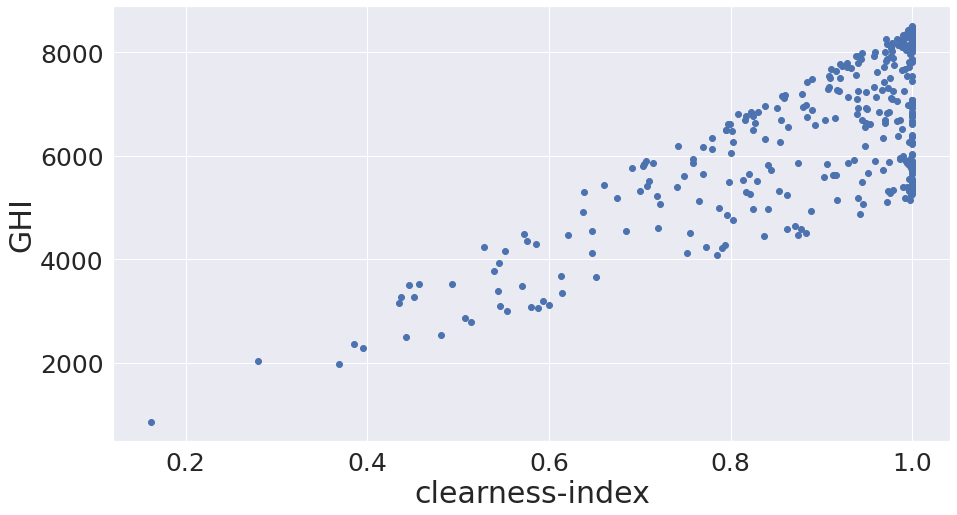

In [ ]:
from sklearn.cluster import KMeans
plt.scatter(Daily['clearness-index'], Daily['GHI'])
plt.xlabel('clearness-index')
plt.ylabel('GHI')
plt.plot()

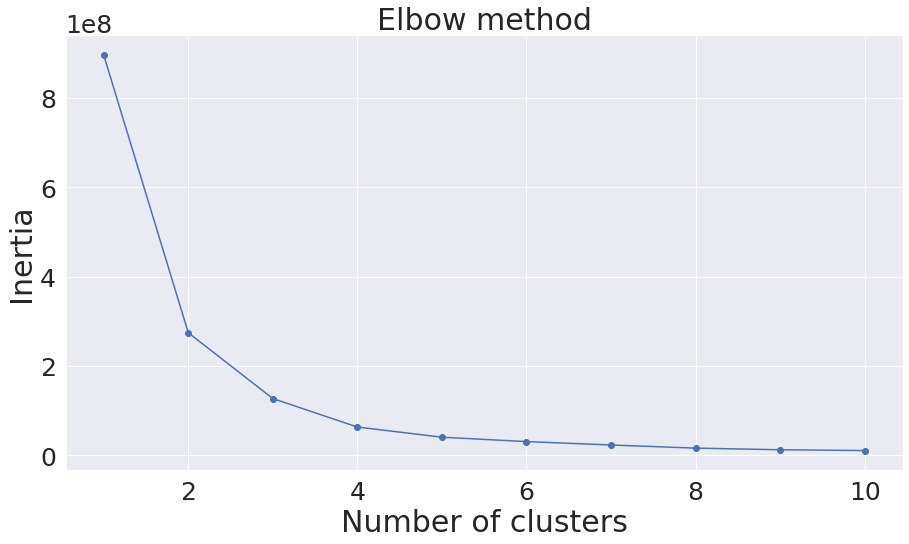

In [ ]:
data = list(zip(Daily['clearness-index'], Daily['GHI']))
inertias = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(data)
    inertias.append(kmeans.inertia_)

plt.plot(range(1,11), inertias, marker='o')
plt.title('Elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [ ]:
km = KMeans(n_clusters=3)
clusters = km.fit_predict(Daily[['clearness-index', 'GHI']])
Daily['cluster'] = clusters
Daily.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,cluster
Date,,,,,,,,,,,,,,,,
2020-01-01,5329.5,5350.0,765.165,1099.290,190.70,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.996168,0
2020-01-02,5379.5,5400.0,764.395,1096.420,195.40,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.996204,0
2020-01-03,5456.5,5456.5,763.570,1012.735,202.10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0
2020-01-04,5371.0,5371.0,762.695,1089.310,202.05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0
2020-01-05,5514.0,5514.0,761.760,1042.545,193.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.000000,0


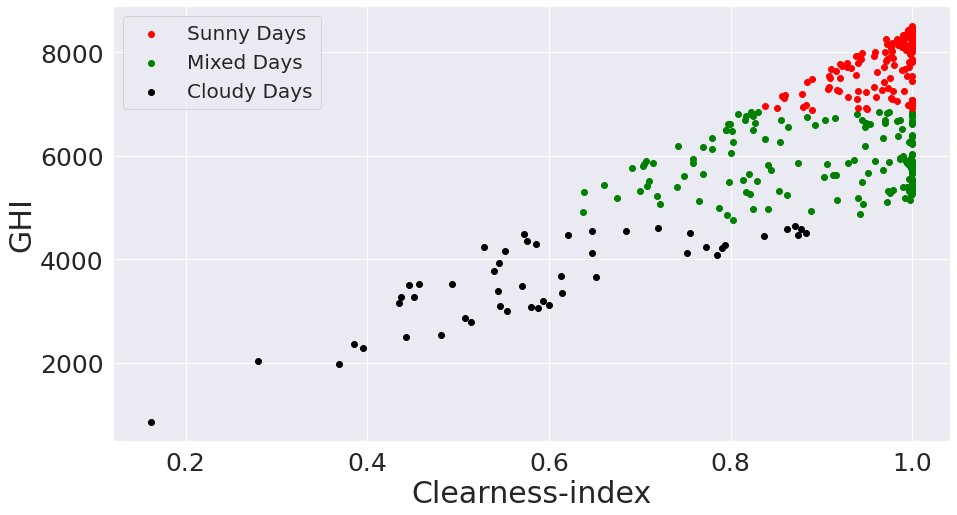

In [ ]:
cluster0 = Daily[Daily.cluster == 0]
cluster1 = Daily[Daily.cluster == 1]
cluster2 = Daily[Daily.cluster == 2]
grn = plt.scatter(cluster0['clearness-index'], cluster0['GHI'], color = 'green')
blk = plt.scatter(cluster1['clearness-index'], cluster1['GHI'], color = 'black')
red = plt.scatter(cluster2['clearness-index'], cluster2['GHI'], color = 'red')
plt.xlabel('Clearness-index')
plt.ylabel('GHI')
plt.legend((red, grn, blk),
           ('Sunny Days', 'Mixed Days', 'Cloudy Days'),
           scatterpoints=1,
           loc='upper left',
           ncol=1,
           fontsize=20)

In [ ]:
clus = 2
clum = 0
cluc = 1

In [ ]:
print(cluster0['cluster'].value_counts())
print(cluster1['cluster'].value_counts())
print(cluster2['cluster'].value_counts())

0    159
Name: cluster, dtype: int64
1    50
Name: cluster, dtype: int64
2    156
Name: cluster, dtype: int64


# **Data Normalization**

In [ ]:
cols1 = list(dftrain)[:]
cols2 = list(dfval)[:]
cols3 = list(dftest)[:]
dftrain = dftrain[cols1].astype(float)
dfval = dfval[cols2].astype(float)
dftest = dftest[cols3].astype(float)
dftrain.dtypes #, dfval.dtypes, dftest.dtypes

GHI                   float64
Clearsky GHI          float64
Solar Zenith Angle    float64
Relative Humidity     float64
Temperature           float64
Probably Clear        float64
Fog                   float64
Water                 float64
Super-Cooled Water    float64
Mixed                 float64
Opaque Ice            float64
Cirrus                float64
Overlapping           float64
Overshooting          float64
clearness-index       float64
dtype: object

In [ ]:
from sklearn.preprocessing import MinMaxScaler

Scaler = MinMaxScaler()
#Scalertr = Scaler.fit(dftrain)
#dftrain_scaled = Scalertr.transform(dftrain)
Scaler = Scaler.fit(dftrain)
dftrain_scaled = Scaler.transform(dftrain)

#Scalervl = Scaler.fit(dfval)
#dfval_scaled = Scalervl.transform(dfval)
dfval_scaled = Scaler.transform(dfval)

#Scalerts = Scaler.fit(dftest)
#dftest_scaled = Scalerts.transform(dftest)
dftest_scaled = Scaler.transform(dftest)

dftrain_scaled.shape, dfval_scaled.shape, dftest_scaled.shape

((181944, 15), (9049, 15), (9123, 15))

# **Tensors for models**

In [ ]:
n_past = 69

n_future = 1 
X_train = []
y_train = []

for i in range(n_past, len(dftrain_scaled) - n_future +1):
    X_train.append(dftrain_scaled[i - n_past:i, 0:dftrain_scaled.shape[1]])
    y_train.append(dftrain_scaled[i + n_future - 1:i + n_future, 0])

X_train, y_train = np.array(X_train), np.array(y_train)

print('X_train shape == {}.'.format(X_train.shape))
print('y_train shape == {}.'.format(y_train.shape))

n_future = 1 
X_val = []
y_val = []

for i in range(n_past, len(dfval_scaled) - n_future +1):
    X_val.append(dfval_scaled[i - n_past:i, 0:dfval_scaled.shape[1]])
    y_val.append(dfval_scaled[i + n_future - 1:i + n_future, 0])

X_val, y_val = np.array(X_val), np.array(y_val)

print('X_val shape == {}.'.format(X_val.shape))
print('y_val shape == {}.'.format(y_val.shape))

n_future = 1 
X_test = []
y_test = []

for i in range(n_past, len(dftest_scaled) - n_future +1):
    X_test.append(dftest_scaled[i - n_past:i, 0:dftest_scaled.shape[1]])
    y_test.append(dftest_scaled[i + n_future - 1:i + n_future, 0])

X_test, y_test = np.array(X_test), np.array(y_test)

print('X_test shape == {}.'.format(X_test.shape))
print('y_test shape == {}.'.format(y_test.shape))

X_train shape == (181875, 69, 15).
y_train shape == (181875, 1).
X_val shape == (8980, 69, 15).
y_val shape == (8980, 1).
X_test shape == (9054, 69, 15).
y_test shape == (9054, 1).


# **LSTM**

In [ ]:
from keras.callbacks import ModelCheckpoint
# define the Autoencoder model

model = Sequential()
model.add(LSTM(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.1))
model.add(Dense(32))
#model.add(Dense(16))
#model.add(Dense(8))
model.add(Dense(y_train.shape[1]))
cp1 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/LSTMH6/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 69, 64)            20480     
                                                                 
 lstm_1 (LSTM)               (None, 32)                12416     
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense (Dense)               (None, 32)                1056      
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 33,985
Trainable params: 33,985
Non-trainable params: 0
_________________________________________________________________


Epoch 1/30
45/45 [==============================] - ETA: 0s - loss: 0.2849 - mape: 117730.1953 - root_mean_squared_error: 0.3446
Epoch 1: val_loss improved from inf to 0.23270, saving model to /content/drive/MyDrive/FYP complete files/LSTMH10/
45/45 [==============================] - 19s 340ms/step - loss: 0.2849 - mape: 117730.1953 - root_mean_squared_error: 0.3446 - val_loss: 0.2327 - val_mape: 315342.6250 - val_root_mean_squared_error: 0.2713
Epoch 2/30
45/45 [==============================] - ETA: 0s - loss: 0.1714 - mape: 81899.4297 - root_mean_squared_error: 0.2112
Epoch 2: val_loss improved from 0.23270 to 0.09879, saving model to /content/drive/MyDrive/FYP complete files/LSTMH10/
45/45 [==============================] - 15s 333ms/step - loss: 0.1714 - mape: 81899.4297 - root_mean_squared_error: 0.2112 - val_loss: 0.0988 - val_mape: 58404.8047 - val_root_mean_squared_error: 0.1240
Epoch 3/30
45/45 [==============================] - ETA: 0s - loss: 0.0951 - mape: 27549.2598 - roo

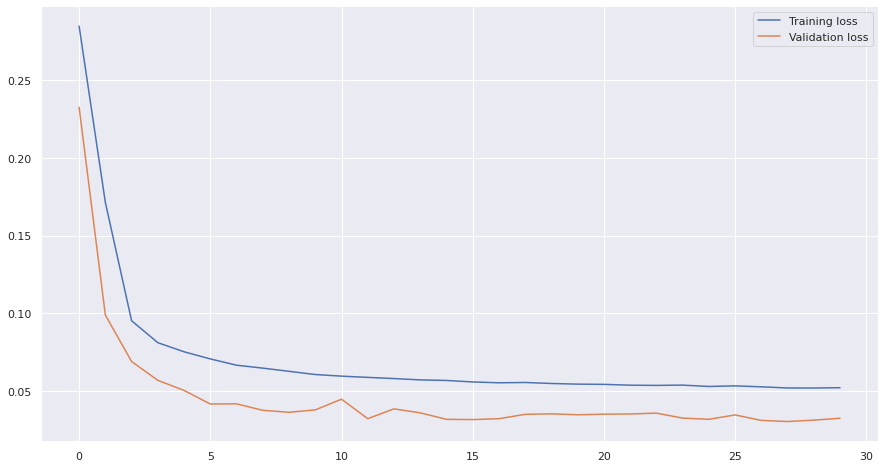

In [ ]:
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae' , metrics=['mape' ,tf.keras.metrics.RootMeanSquaredError()])

# fit the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp1])
plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend()

# **LSTM analysis**

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/FYP complete files/LSTMH3/')

dftrain1 = dftrain
X_train1 = X_train
train_predictions1 = model.predict(X_train1)
prediction_copies1 = np.repeat(train_predictions1, dftrain1.shape[1], axis=-1)
#train_predictions1 = Scalertr.inverse_transform(prediction_copies1)[:,0]
train_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]

y_train1 = y_train
actual_copies1 = np.repeat(y_train1, dftrain1.shape[1], axis=-1)
#y_train1 = Scalertr.inverse_transform(actual_copies1)[:,0]
y_train1 = Scaler.inverse_transform(actual_copies1)[:,0]

train_predictions1 = train_predictions1.flatten()
y_train1 = y_train1.flatten()


5684/5684 [==============================] - 118s 21ms/step


In [ ]:
train_results1 = pd.DataFrame(data={'Train Predictions':train_predictions1, 'Actuals':y_train1, 'Date':traindates[69:]})
train_results1.set_index('Date', inplace = True)
train_results1.head()

,Train Predictions,Actuals
Date,,
1998-01-04 10:30:00,694.446167,688.0
1998-01-04 11:00:00,755.465332,749.0
1998-01-04 11:30:00,799.574768,793.0
1998-01-04 12:00:00,821.105530,819.0
1998-01-04 12:30:00,825.472046,826.0


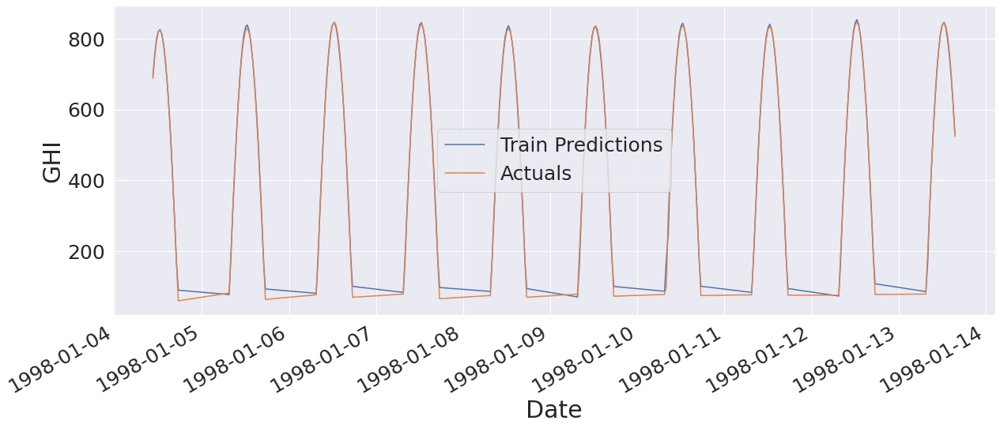

In [ ]:
train_results1['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results1['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval1 = dfval
X_val1 = X_val
val_predictions1 = model.predict(X_val1)
prediction_copies1 = np.repeat(val_predictions1, dfval1.shape[1], axis=-1)
#val_predictions1 = Scalervl.inverse_transform(prediction_copies1)[:,0]
val_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]


y_val1 = y_val
actual_copies1 = np.repeat(y_val1, dfval1.shape[1], axis=-1)
#y_val1 = Scalervl.inverse_transform(actual_copies1)[:,0]
y_val1 = Scaler.inverse_transform(actual_copies1)[:,0]

val_predictions1 = val_predictions1.flatten()
y_val1 = y_val1.flatten()

val_results1 = pd.DataFrame(data={'Val Predictions':val_predictions1, 'Actuals':y_val1, 'Date':valdates[69:]})
val_results1.set_index('Date', inplace = True)
val_results1.head()

281/281 [==============================] - 5s 18ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 10:00:00,620.203918,610.0
2019-01-01 10:30:00,689.653931,686.0
2019-01-01 11:00:00,745.890259,746.0
2019-01-01 11:30:00,787.803528,789.0
2019-01-01 12:00:00,811.206665,814.0


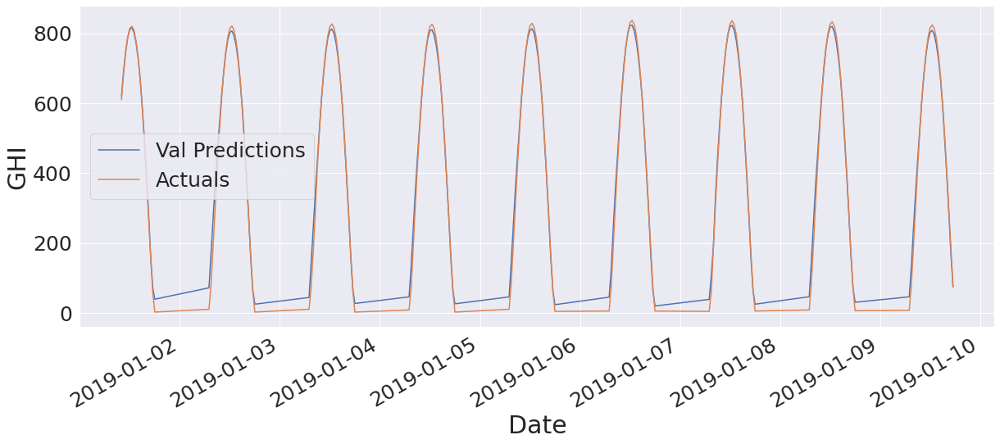

In [ ]:
val_results1['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results1['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest1 = dftest
X_test1 = X_test
test_predictions1 = model.predict(X_test1)
prediction_copies1 = np.repeat(test_predictions1, dftest1.shape[1], axis=-1)
#test_predictions1 = Scalerts.inverse_transform(prediction_copies1)[:,0]
test_predictions1 = Scaler.inverse_transform(prediction_copies1)[:,0]


y_test1 = y_test
actual_copies1 = np.repeat(y_test1, dftest1.shape[1], axis=-1)
#y_test1 = Scalerts.inverse_transform(actual_copies1)[:,0]
y_test1 = Scaler.inverse_transform(actual_copies1)[:,0]


y_test1 = y_test1.flatten()

test_results1 = pd.DataFrame(data={'Test Predictions':test_predictions1, 'Actuals':y_test1.flatten(), 'Date':testdates[69:]})
test_results1.set_index('Date', inplace = True)
Rsquared1 =r2_score(y_test1, test_predictions1)
mape1 = tf.keras.metrics.mean_absolute_percentage_error(y_test1, test_predictions1)
mae1 = tf.keras.metrics.mean_absolute_error(y_test1, test_predictions1)

m1 = tf.keras.metrics.RootMeanSquaredError()
m1.update_state(y_test1, test_predictions1)
rmse1 = m1.result().numpy()

#rmse1 =  tf.keras.metrics.RootMeanSquaredError(y_test1, test_predictions1)
mean1 =np.mean(y_test1)
test_results1, print('Rsqrared: ', Rsquared1), print('MAPE: ',mape1), print('MAE: ',mae1), print('RMSE: ',rmse1), print('Mean: ',mean1)

283/283 [==============================] - 5s 18ms/step
Rsqrared:  0.9694566832736121
MAPE:  tf.Tensor(33.548393, shape=(), dtype=float32)
MAE:  tf.Tensor(32.634563, shape=(), dtype=float32)
RMSE:  57.619675
Mean:  516.662027833002


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 07:00:00         50.656097     11.0
 2020-01-01 07:30:00        147.162048     84.0
 2020-01-01 08:00:00        249.860733    190.0
 2020-01-01 08:30:00        348.636627    302.0
 2020-01-01 09:00:00        441.217621    410.0
 ...                               ...      ...
 2020-12-31 16:00:00        380.845703    379.0
 2020-12-31 16:30:00        270.358063    268.0
 2020-12-31 17:00:00        153.191849    156.0
 2020-12-31 17:30:00         60.902069     56.0
 2020-12-31 18:00:00         23.178139      2.0
 
 [9054 rows x 2 columns], None, None, None, None, None)

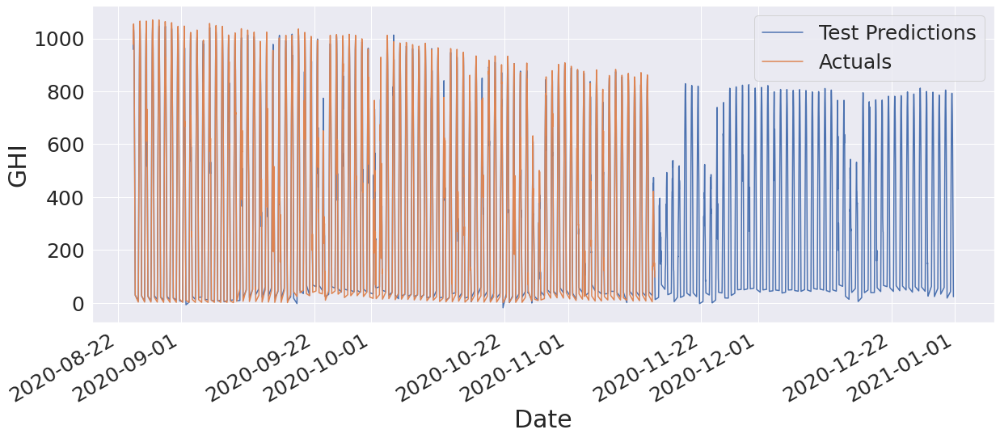

In [ ]:
test_results1['Test Predictions'][6000:].plot(figsize=(20,8), label='Test Predictions')
test_results1['Actuals'][6000:8000].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

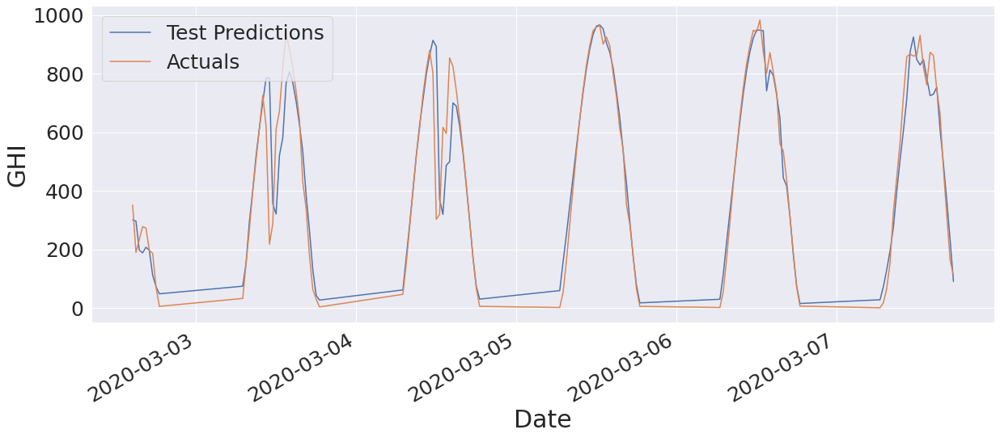

In [ ]:
test_results1['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results1['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

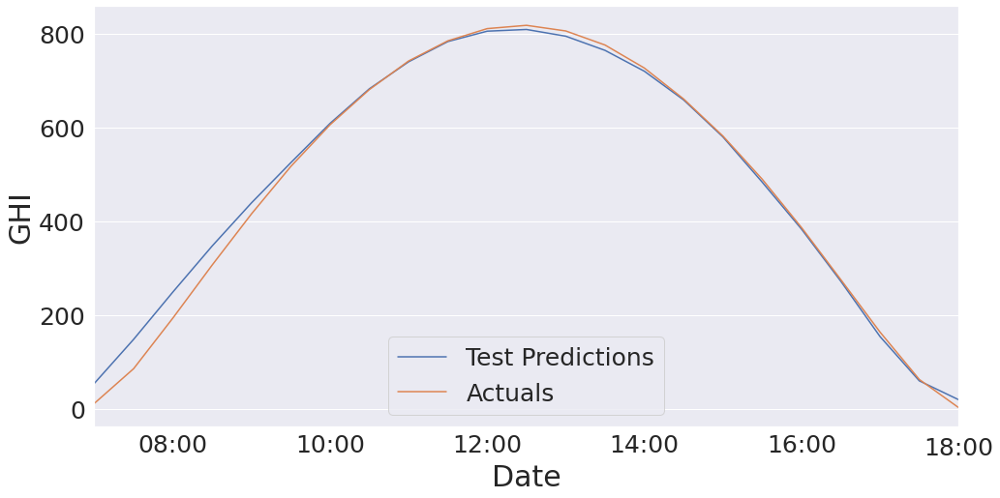

In [ ]:
test_results1['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results1['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results10 = test_results1
test_results1 = test_results1.reset_index()
test_results1 = test_results1.drop(['Date'], axis = 'columns')

In [ ]:
testyear = testyear.reset_index()
testyear

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index
0,2020-01-01 07:00:00,11,11,89.67,100.00,12.8,0,0,0,0,0,0,0,0,0,1.0
1,2020-01-01 07:30:00,84,84,83.62,100.00,13.5,0,0,0,0,0,0,0,0,0,1.0
2,2020-01-01 08:00:00,190,190,77.47,100.00,14.2,0,0,0,0,0,0,0,0,0,1.0
3,2020-01-01 08:30:00,302,302,71.50,98.21,14.7,0,0,0,0,0,0,0,0,0,1.0
4,2020-01-01 09:00:00,410,410,65.79,96.10,15.1,0,0,0,0,0,0,0,0,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9049,2020-12-31 16:00:00,379,379,67.54,80.20,16.3,0,0,0,0,0,0,0,0,0,1.0
9050,2020-12-31 16:30:00,268,268,73.33,83.86,15.6,0,0,0,0,0,0,0,0,0,1.0
9051,2020-12-31 17:00:00,156,156,79.36,92.64,14.8,0,0,0,0,0,0,0,0,0,1.0
9052,2020-12-31 17:30:00,56,56,85.53,95.67,14.3,0,0,0,0,0,0,0,0,0,1.0


# **Daily Reults 1**

In [ ]:
testyear1 = pd.concat([testyear,test_results1], axis = 'columns')
testyear1.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:00:00,11,11,89.67,100.00,12.8,0,0,0,0,0,0,0,0,0,1.0,50.656097,11.0
1,2020-01-01 07:30:00,84,84,83.62,100.00,13.5,0,0,0,0,0,0,0,0,0,1.0,147.162048,84.0
2,2020-01-01 08:00:00,190,190,77.47,100.00,14.2,0,0,0,0,0,0,0,0,0,1.0,249.860733,190.0
3,2020-01-01 08:30:00,302,302,71.50,98.21,14.7,0,0,0,0,0,0,0,0,0,1.0,348.636627,302.0
4,2020-01-01 09:00:00,410,410,65.79,96.10,15.1,0,0,0,0,0,0,0,0,0,1.0,441.217621,410.0


In [ ]:
testyear1 = testyear1.resample('D',on='Date').sum()

In [ ]:
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10893.426758,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10887.471680,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11087.994141,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10898.333984,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11158.486328,11022.0


In [ ]:
#testyear1 = testyear1.dropna()
testyear1 = testyear1.drop("2020-02-29")
testyear1

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10893.426758,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10887.471680,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11087.994141,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10898.333984,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11158.486328,11022.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,8899,10632,1443.03,1977.09,369.8,0,0,0,7,0,0,0,0,0,18.708492,9614.052734,8899.0
2020-12-28,10694,10694,1442.13,1983.03,382.9,0,0,0,0,0,0,0,0,0,23.000000,11005.945312,10694.0
2020-12-29,10621,10621,1441.10,2079.72,389.4,0,0,0,0,0,0,0,0,0,23.000000,10854.147461,10621.0


In [ ]:
testyear1['cluster'] = clusters
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10893.426758,10656.0,0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10887.471680,10756.0,0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11087.994141,10910.0,0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10898.333984,10739.0,0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11158.486328,11022.0,0


# **Dividing days according to clusters**

In [ ]:
 Fullyear1= testyear1[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap1 =  Fullyear1['Test Predictions'].to_numpy()
Fullyearac1 =  Fullyear1['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear1 =r2_score(Fullyearac1, Fullyeararrap1)
mapeFullyear1 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac1, Fullyeararrap1)
maeFullyear1 = tf.keras.metrics.mean_absolute_error(Fullyearac1, Fullyeararrap1)

mFullyear1 = tf.keras.metrics.RootMeanSquaredError()
mFullyear1.update_state(Fullyearac1, Fullyeararrap1)
rmseFullyear1 = mFullyear1.result().numpy()
meanFullyear1 =np.mean(Fullyearac1)
print('Rsqrared: ', RsquaredFullyear1), print('MAPE: ',mapeFullyear1), print('MAE: ',maeFullyear1), print('RMSE: ',rmseFullyear1), print('Mean: ',meanFullyear1)



Rsqrared:  0.9920878697640071
MAPE:  tf.Tensor(1.9962592, shape=(), dtype=float32)
MAE:  tf.Tensor(205.06438, shape=(), dtype=float32)
RMSE:  278.79166
Mean:  12816.049315068492


(None, None, None, None, None)

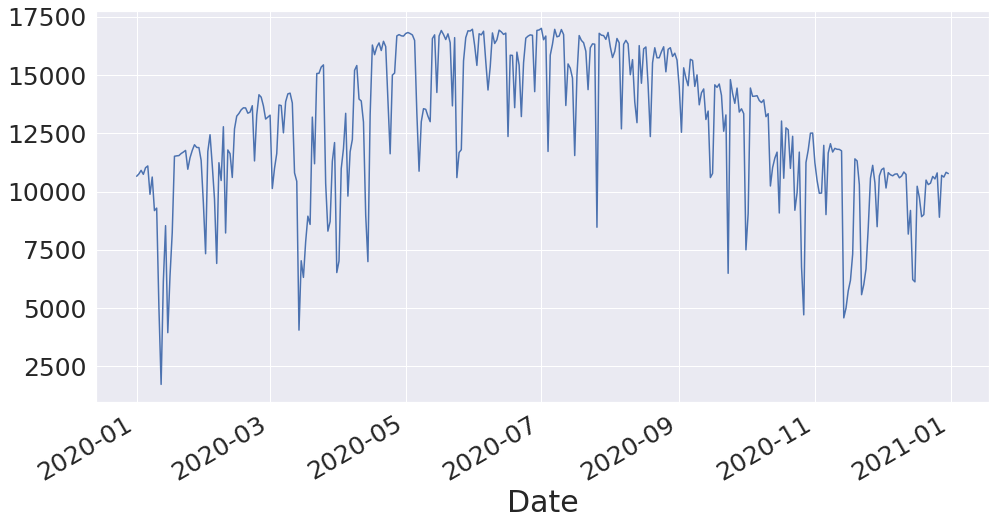

In [ ]:
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')

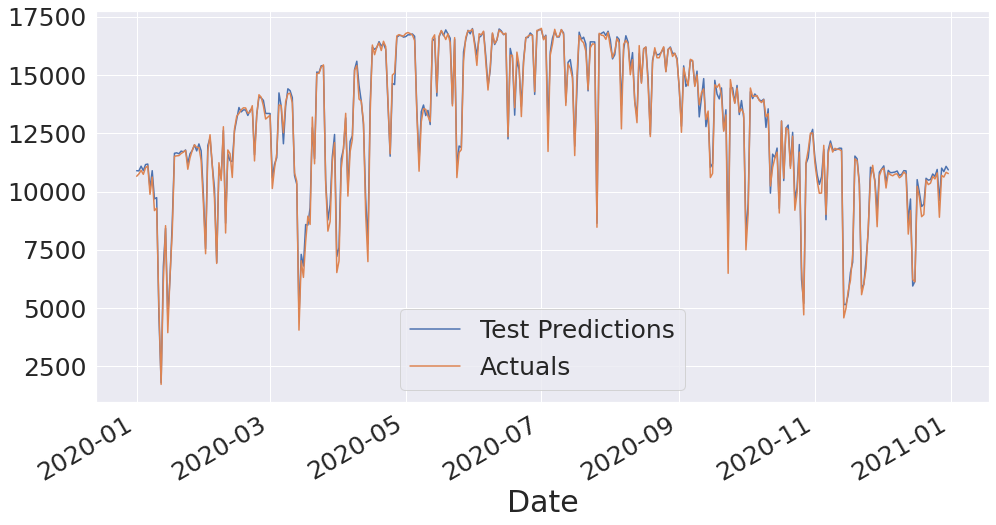

In [ ]:
Fullyear1['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Clusters Sorting

In [ ]:
sunnydays1 = testyear1[testyear1.cluster == clus]
mixeddays1 = testyear1[testyear1.cluster == clum]
cloudydays1 = testyear1[testyear1.cluster == cluc]

In [ ]:
sunnydays1 = sunnydays1[['Test Predictions',	'Actuals']]
sunnydays1

,Test Predictions,Actuals
Date,,
2020-02-25,14066.404297,14151.0
2020-02-26,14014.726562,14047.0
2020-03-08,13653.858398,13851.0
2020-03-09,14406.878906,14188.0
2020-03-10,14326.210938,14220.0
2020-03-11,14028.220703,13798.0
2020-03-22,15125.623047,15061.0
2020-03-23,15097.274414,15072.0
2020-03-24,15394.041992,15339.0


In [ ]:
sunnyarrap1 = sunnydays1['Test Predictions'].to_numpy()
sunnyac1 = sunnydays1['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny1 =r2_score(sunnyac1, sunnyarrap1)
mapesunny1 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac1, sunnyarrap1)
maesunny1 = tf.keras.metrics.mean_absolute_error(sunnyac1, sunnyarrap1)

msunny1 = tf.keras.metrics.RootMeanSquaredError()
msunny1.update_state(sunnyac1, sunnyarrap1)
rmsesunny1 = msunny1.result().numpy()
meansunny1 =np.mean(sunnyac1)
print('Rsqrared: ', Rsquaredsunny1), print('MAPE: ',mapesunny1), print('MAE: ',maesunny1), print('RMSE: ',rmsesunny1), print('Mean: ',meansunny1)



Rsqrared:  0.9660074988198345
MAPE:  tf.Tensor(0.86314774, shape=(), dtype=float32)
MAE:  tf.Tensor(132.58589, shape=(), dtype=float32)
RMSE:  184.98773
Mean:  15727.064102564103


(None, None, None, None, None)

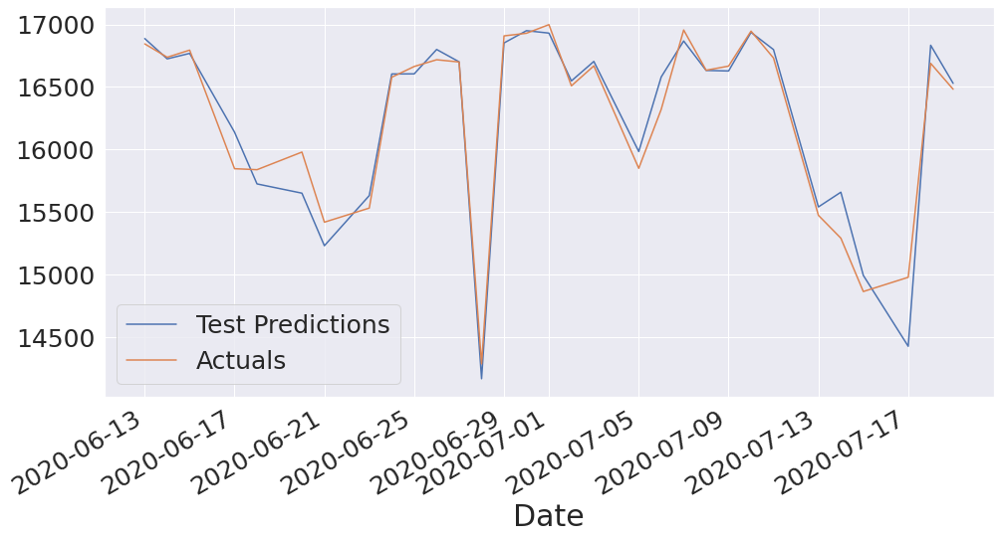

In [ ]:
sunnydays1['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays1['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays1 = mixeddays1[['Test Predictions',	'Actuals']]
mixdays1

,Test Predictions,Actuals
Date,,
2020-01-01,10893.426758,10656.0
2020-01-02,10887.471680,10756.0
2020-01-03,11087.994141,10910.0
2020-01-04,10898.333984,10739.0
2020-01-05,11158.486328,11022.0
2020-01-06,11179.630859,11098.0
2020-01-07,10125.004883,9882.0
2020-01-08,10895.358398,10623.0
2020-01-18,11640.322266,11514.0


In [ ]:
mixarrap1 = mixeddays1['Test Predictions'].to_numpy()
mixac1 = mixeddays1['Actuals'].to_numpy()

In [ ]:
Rsquaredmix1 =r2_score(mixac1, mixarrap1)
mapemix1 = tf.keras.metrics.mean_absolute_percentage_error(mixac1, mixarrap1)
maemix1 = tf.keras.metrics.mean_absolute_error(mixac1, mixarrap1)

mmix1 = tf.keras.metrics.RootMeanSquaredError()
mmix1.update_state(mixac1, mixarrap1)
rmsemix1 = mmix1.result().numpy()
meanmix1 =np.mean(mixac1)
print('Rsqrared: ', Rsquaredmix1), print('MAPE: ',mapemix1), print('MAE: ',maemix1), print('RMSE: ',rmsemix1), print('Mean: ',meanmix1)



Rsqrared:  0.9465869497881233
MAPE:  tf.Tensor(1.7908612, shape=(), dtype=float32)
MAE:  tf.Tensor(206.39973, shape=(), dtype=float32)
RMSE:  264.5748
Mean:  11717.993710691824


(None, None, None, None, None)

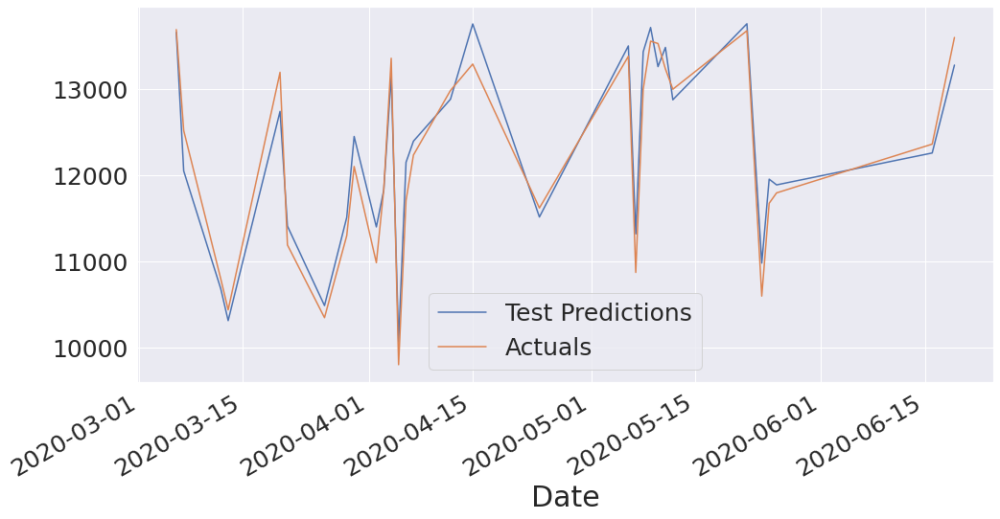

In [ ]:
mixeddays1['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays1['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays1 = cloudydays1[['Test Predictions',	'Actuals']]
cloudydays1

,Test Predictions,Actuals
Date,,
2020-01-09,9686.285156,9184.0
2020-01-10,9739.857422,9291.0
2020-01-11,4681.916992,5059.0
2020-01-12,1804.210327,1732.0
2020-01-13,6788.486328,6146.0
2020-01-14,8423.472656,8538.0
2020-01-15,4633.037598,3950.0
2020-01-16,6286.865723,6386.0
2020-01-17,8650.505859,8237.0


In [ ]:
cloudyarrap1 = cloudydays1['Test Predictions'].to_numpy()
cloudyac1 = cloudydays1['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy1 =r2_score(cloudyac1, cloudyarrap1)
mapecloudy1 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac1, cloudyarrap1)
maecloudy1 = tf.keras.metrics.mean_absolute_error(cloudyac1, cloudyarrap1)

mcloudy1 = tf.keras.metrics.RootMeanSquaredError()
mcloudy1.update_state(cloudyac1, cloudyarrap1)
rmsecloudy1 = mcloudy1.result().numpy()
meancloudy1 =np.mean(cloudyac1)
print('Rsqrared: ', Rsquaredcloudy1), print('MAPE: ',mapecloudy1), print('MAE: ',maecloudy1), print('RMSE: ',rmsecloudy1), print('Mean: ',meancloudy1)

Rsqrared:  0.9172304665952684
MAPE:  tf.Tensor(6.1847343, shape=(), dtype=float32)
MAE:  tf.Tensor(426.95074, shape=(), dtype=float32)
RMSE:  487.87665
Mean:  7225.5


(None, None, None, None, None)

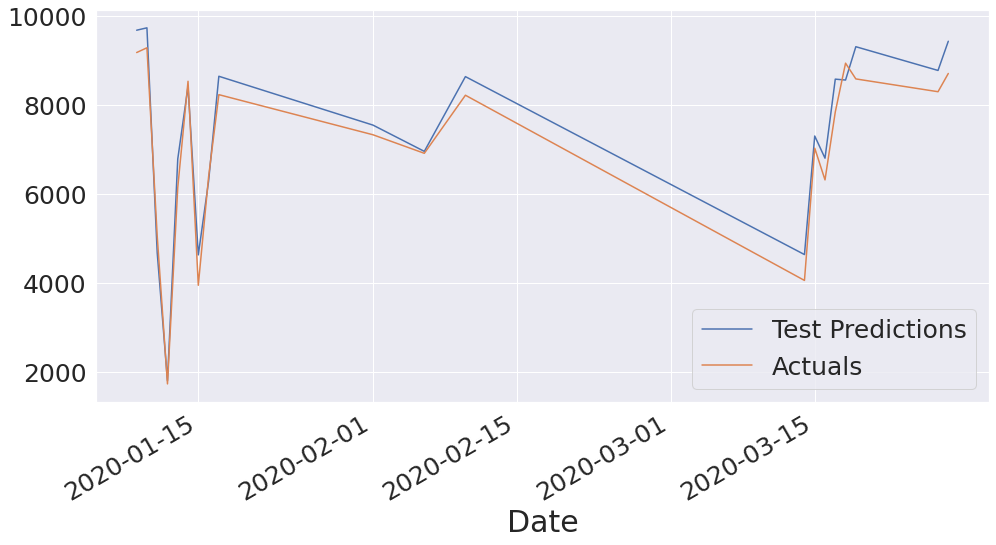

In [ ]:
cloudydays1['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays1['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **GRU**

In [ ]:
from keras.layers import GRU
model2 = Sequential()
model2.add(GRU(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model2.add(GRU(32, activation='relu', return_sequences=False))
model2.add(Dropout(0.1))
model2.add(Dense(32))
#model2.add(Dense(16))
#model2.add(Dense(8))
model2.add(Dense(y_train.shape[1]))
cp2 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/GRU1/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model2.summary()



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 69, 64)            15552     
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_1 (Dropout)         (None, 32)                0         
                                                                 
 dense_2 (Dense)             (None, 32)                1056      
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 26,049
Trainable params: 26,049
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model2.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model2.summary()
# fit the model
history2 = model2.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp2])
plt.plot(history2.history['loss'], label='Training loss')
plt.plot(history2.history['val_loss'], label='Validation loss')
plt.legend()

NameError: ignored

# **GRU analysis**

In [ ]:
from keras.models import load_model
model2 = load_model('/content/drive/MyDrive/FYP complete files/GRU1/')

dftrain2 = dftrain
X_train2 = X_train
train_predictions2 = model2.predict(X_train2)
prediction_copies2 = np.repeat(train_predictions2, dftrain2.shape[1], axis=-1)
train_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]

y_train2 = y_train
actual_copies2 = np.repeat(y_train2, dftrain2.shape[1], axis=-1)
y_train2 = Scaler.inverse_transform(actual_copies2)[:,0]

train_predictions2 = train_predictions2.flatten()
y_train2 = y_train2.flatten()


5684/5684 [==============================] - 102s 18ms/step


In [ ]:
train_results2 = pd.DataFrame(data={'Train Predictions':train_predictions2, 'Actuals':y_train2, 'Date':traindates[69:]})
train_results2.set_index('Date', inplace = True)
train_results2.head()

,Train Predictions,Actuals
Date,,
1998-01-04 10:30:00,691.269348,688.0
1998-01-04 11:00:00,749.786560,749.0
1998-01-04 11:30:00,792.813416,793.0
1998-01-04 12:00:00,816.015747,819.0
1998-01-04 12:30:00,823.094666,826.0


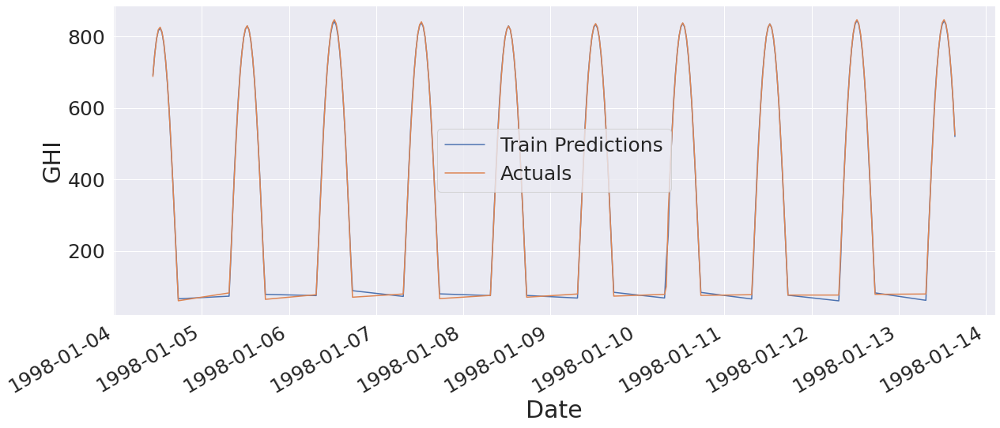

In [ ]:
train_results2['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results2['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval2 = dfval
X_val2 = X_val
val_predictions2 = model2.predict(X_val2)
prediction_copies2 = np.repeat(val_predictions2, dfval2.shape[1], axis=-1)
#val_predictions2 = Scalervl.inverse_transform(prediction_copies2)[:,0]
val_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]


y_val2 = y_val
actual_copies2 = np.repeat(y_val2, dfval2.shape[1], axis=-1)
#y_val2 = Scalervl.inverse_transform(actual_copies2)[:,0]
y_val2 = Scaler.inverse_transform(actual_copies2)[:,0]

val_predictions2 = val_predictions2.flatten()
y_val2 = y_val2.flatten()

val_results2 = pd.DataFrame(data={'Val Predictions':val_predictions2, 'Actuals':y_val2, 'Date':valdates[69:]})
val_results2.set_index('Date', inplace = True)
val_results2.head()

281/281 [==============================] - 4s 16ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 10:00:00,615.248901,610.0
2019-01-01 10:30:00,688.758911,686.0
2019-01-01 11:00:00,745.680664,746.0
2019-01-01 11:30:00,786.483398,789.0
2019-01-01 12:00:00,809.091736,814.0


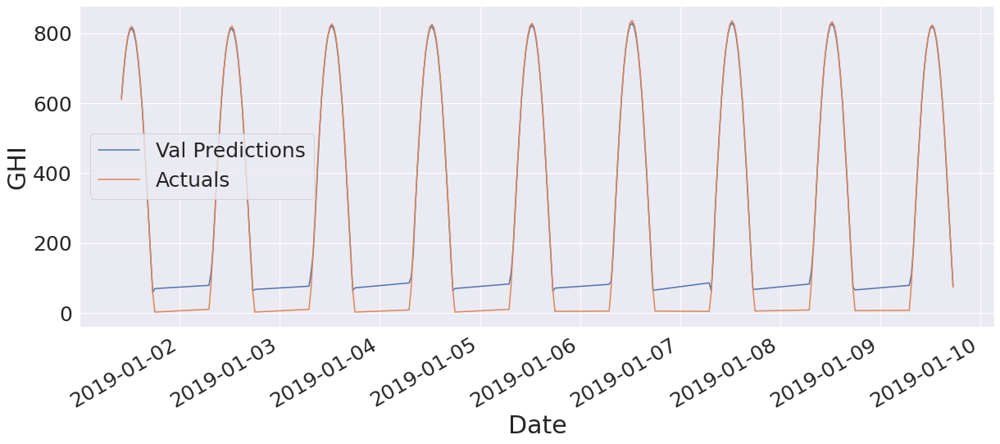

In [ ]:
val_results2['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results2['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest2 = dftest
X_test2 = X_test
test_predictions2 = model2.predict(X_test2)
prediction_copies2 = np.repeat(test_predictions2, dftest2.shape[1], axis=-1)
#test_predictions2 = Scalerts.inverse_transform(prediction_copies2)[:,0]
test_predictions2 = Scaler.inverse_transform(prediction_copies2)[:,0]


y_test2 = y_test
actual_copies2 = np.repeat(y_test2, dftest2.shape[1], axis=-1)
#y_test2 = Scalerts.inverse_transform(actual_copies2)[:,0]
y_test2 = Scaler.inverse_transform(actual_copies2)[:,0]


y_test2 = y_test2.flatten()

test_results2 = pd.DataFrame(data={'Test Predictions':test_predictions2, 'Actuals':y_test2.flatten(), 'Date':testdates[69:]})
test_results2.set_index('Date', inplace = True)
Rsquared2 =r2_score(y_test2, test_predictions2)
mape2 = tf.keras.metrics.mean_absolute_percentage_error(y_test2, test_predictions2)
mae2 = tf.keras.metrics.mean_absolute_error(y_test2, test_predictions2)

m2 = tf.keras.metrics.RootMeanSquaredError()
m2.update_state(y_test2, test_predictions2)
rmse2 = m2.result().numpy()

#rmse2 =  tf.keras.metrics.RootMeanSquaredError(y_test2, test_predictions2)
mean2 =np.mean(y_test2)
test_results2, print('Rsqrared: ', Rsquared2), print('MAPE: ',mape2), print('MAE: ',mae2), print('RMSE: ',rmse2), print('Mean: ',mean2)

283/283 [==============================] - 4s 16ms/step
Rsqrared:  0.9703225088891193
MAPE:  tf.Tensor(71.800316, shape=(), dtype=float32)
MAE:  tf.Tensor(28.83613, shape=(), dtype=float32)
RMSE:  56.79712
Mean:  516.662027833002


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 07:00:00         75.824554     11.0
 2020-01-01 07:30:00        114.805069     84.0
 2020-01-01 08:00:00        187.540070    190.0
 2020-01-01 08:30:00        302.343842    302.0
 2020-01-01 09:00:00        412.053101    410.0
 ...                               ...      ...
 2020-12-31 16:00:00        376.059418    379.0
 2020-12-31 16:30:00        266.648407    268.0
 2020-12-31 17:00:00        157.095642    156.0
 2020-12-31 17:30:00         53.241383     56.0
 2020-12-31 18:00:00         73.700912      2.0
 
 [9054 rows x 2 columns], None, None, None, None, None)

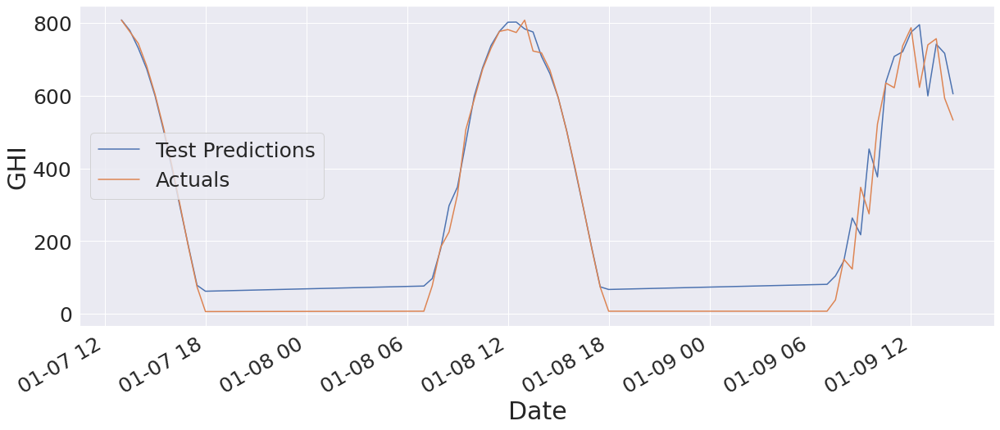

In [ ]:
test_results2['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results2['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

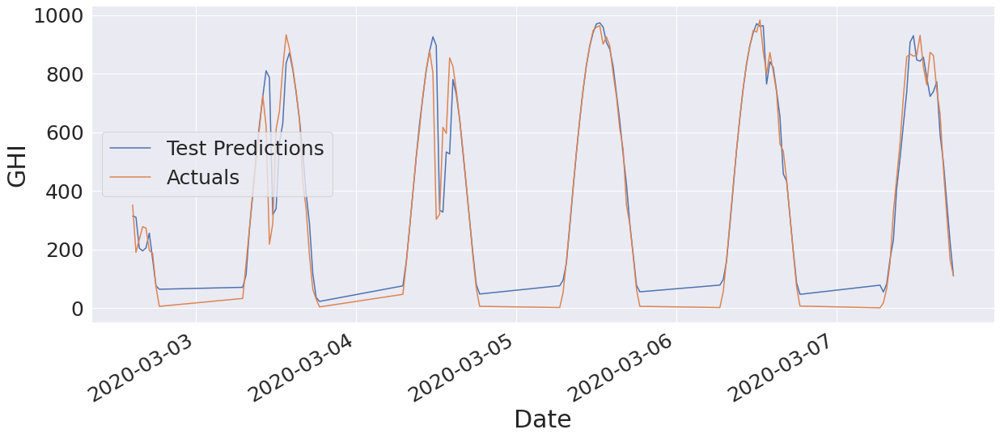

In [ ]:
test_results2['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results2['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

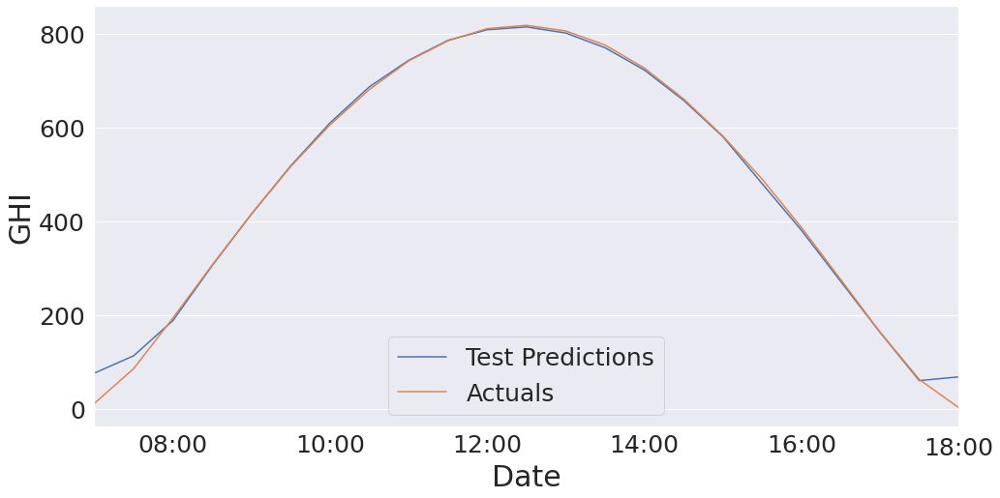

In [ ]:
test_results2['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results2['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results20 = test_results2
test_results2 = test_results2.reset_index()
test_results2 = test_results2.drop(['Date'], axis = 'columns')

# **Daily Reults GRU**

In [ ]:
testyear2 = pd.concat([testyear,test_results2], axis = 'columns')
testyear2.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:00:00,11,11,89.67,100.00,12.8,0,0,0,0,0,0,0,0,0,1.0,75.824554,11.0
1,2020-01-01 07:30:00,84,84,83.62,100.00,13.5,0,0,0,0,0,0,0,0,0,1.0,114.805069,84.0
2,2020-01-01 08:00:00,190,190,77.47,100.00,14.2,0,0,0,0,0,0,0,0,0,1.0,187.540070,190.0
3,2020-01-01 08:30:00,302,302,71.50,98.21,14.7,0,0,0,0,0,0,0,0,0,1.0,302.343842,302.0
4,2020-01-01 09:00:00,410,410,65.79,96.10,15.1,0,0,0,0,0,0,0,0,0,1.0,412.053101,410.0


In [ ]:
testyear2 = testyear2.resample('D',on='Date').sum()

In [ ]:
testyear2.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10842.299805,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10915.597656,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11026.968750,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10885.622070,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11118.303711,11022.0


In [ ]:
#testyear2 = testyear2.dropna()
testyear2 = testyear2.drop("2020-02-29")
testyear2

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10842.299805,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10915.597656,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11026.968750,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10885.622070,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11118.303711,11022.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,8899,10632,1443.03,1977.09,369.8,0,0,0,7,0,0,0,0,0,18.708492,9602.250977,8899.0
2020-12-28,10694,10694,1442.13,1983.03,382.9,0,0,0,0,0,0,0,0,0,23.000000,10819.415039,10694.0
2020-12-29,10621,10621,1441.10,2079.72,389.4,0,0,0,0,0,0,0,0,0,23.000000,10782.063477,10621.0


In [ ]:
testyear2['cluster'] = clusters
testyear2.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10842.299805,10656.0,0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10915.597656,10756.0,0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11026.968750,10910.0,0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10885.622070,10739.0,0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11118.303711,11022.0,0


# **Dividing days according to clusters GRU**

In [ ]:
 Fullyear2= testyear2[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap2 =  Fullyear2['Test Predictions'].to_numpy()
Fullyearac2 =  Fullyear2['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear2 =r2_score(Fullyearac2, Fullyeararrap2)
mapeFullyear2 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac2, Fullyeararrap2)
maeFullyear2 = tf.keras.metrics.mean_absolute_error(Fullyearac2, Fullyeararrap2)

mFullyear2 = tf.keras.metrics.RootMeanSquaredError()
mFullyear2.update_state(Fullyearac2, Fullyeararrap2)
rmseFullyear2 = mFullyear2.result().numpy()
meanFullyear2 =np.mean(Fullyearac2)
print('Rsqrared: ', RsquaredFullyear2), print('MAPE: ',mapeFullyear2), print('MAE: ',maeFullyear2), print('RMSE: ',rmseFullyear2), print('Mean: ',meanFullyear2)



Rsqrared:  0.9886604667305862
MAPE:  tf.Tensor(2.3021119, shape=(), dtype=float32)
MAE:  tf.Tensor(236.1139, shape=(), dtype=float32)
RMSE:  333.7572
Mean:  12816.049315068492


(None, None, None, None, None)

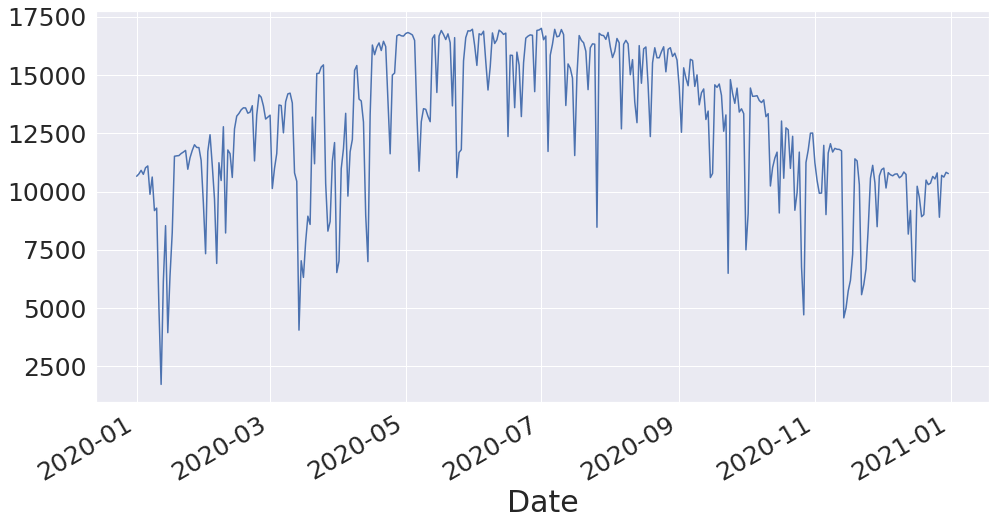

In [ ]:
Fullyear2['Actuals'][:].plot(figsize=(16,8), label='Actuals')

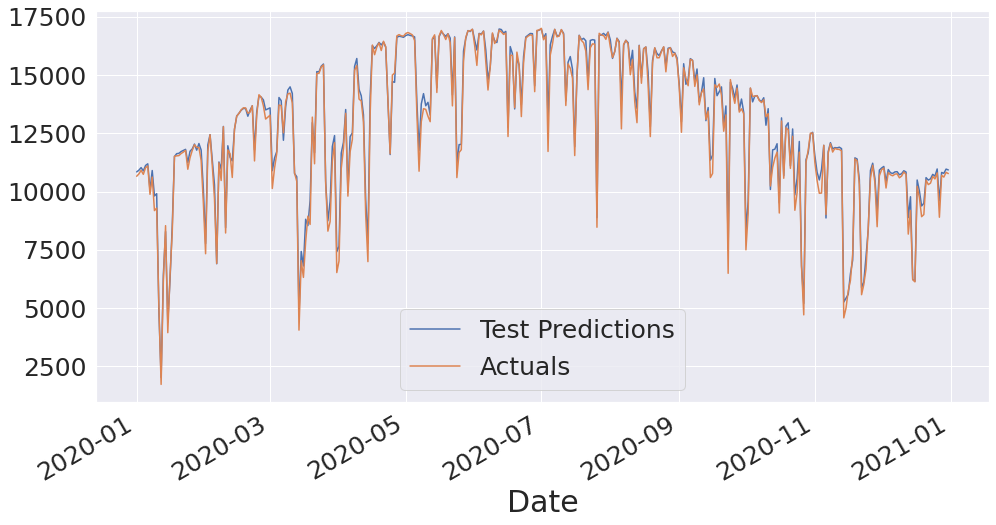

In [ ]:
Fullyear2['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear2['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays2 = testyear2[testyear2.cluster == clus]
mixeddays2 = testyear2[testyear2.cluster == clum]
cloudydays2 = testyear2[testyear2.cluster == cluc]

In [ ]:
sunnydays2 = sunnydays2[['Test Predictions',	'Actuals']]
sunnydays2

,Test Predictions,Actuals
Date,,
2020-02-25,14100.246094,14151.0
2020-02-26,14049.439453,14047.0
2020-03-08,13634.810547,13851.0
2020-03-09,14351.710938,14188.0
2020-03-10,14489.068359,14220.0
2020-03-11,14204.852539,13798.0
2020-03-22,15140.033203,15061.0
2020-03-23,15135.855469,15072.0
2020-03-24,15373.029297,15339.0


In [ ]:
sunnyarrap2 = sunnydays2['Test Predictions'].to_numpy()
sunnyac2 = sunnydays2['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny2 =r2_score(sunnyac2, sunnyarrap2)
mapesunny2 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac2, sunnyarrap2)
maesunny2 = tf.keras.metrics.mean_absolute_error(sunnyac2, sunnyarrap2)

msunny2 = tf.keras.metrics.RootMeanSquaredError()
msunny2.update_state(sunnyac2, sunnyarrap2)
rmsesunny2 = msunny2.result().numpy()
meansunny2 =np.mean(sunnyac2)
print('Rsqrared: ', Rsquaredsunny2), print('MAPE: ',mapesunny2), print('MAE: ',maesunny2), print('RMSE: ',rmsesunny2), print('Mean: ',meansunny2)



Rsqrared:  0.9601233234268522
MAPE:  tf.Tensor(0.9141176, shape=(), dtype=float32)
MAE:  tf.Tensor(139.0531, shape=(), dtype=float32)
RMSE:  200.35992
Mean:  15727.064102564103


(None, None, None, None, None)

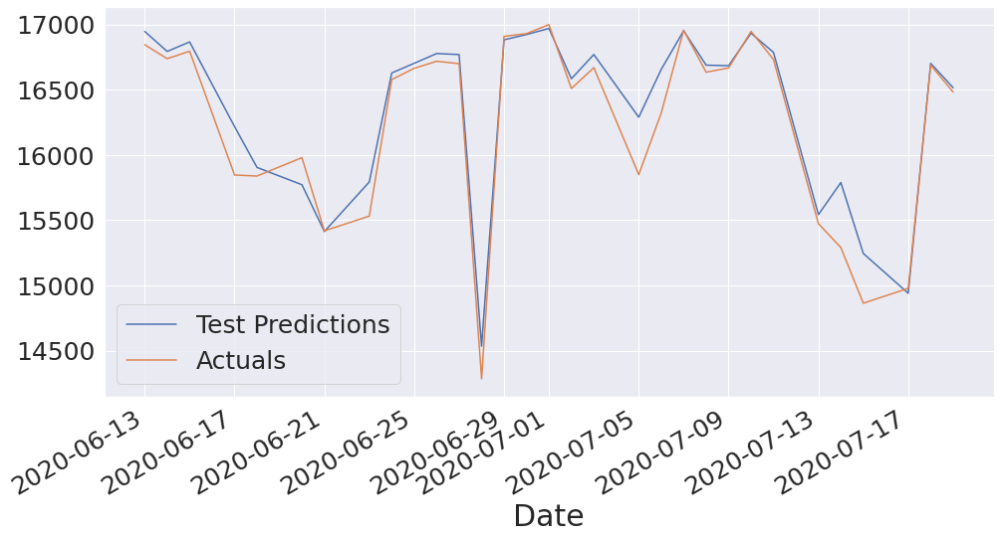

In [ ]:
sunnydays2['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays2['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays2 = mixeddays2[['Test Predictions',	'Actuals']]
mixdays2

,Test Predictions,Actuals
Date,,
2020-01-01,10842.299805,10656.0
2020-01-02,10915.597656,10756.0
2020-01-03,11026.968750,10910.0
2020-01-04,10885.622070,10739.0
2020-01-05,11118.303711,11022.0
2020-01-06,11190.313477,11098.0
2020-01-07,10051.748047,9882.0
2020-01-08,10902.348633,10623.0
2020-01-18,11502.873047,11514.0


In [ ]:
mixarrap2 = mixeddays2['Test Predictions'].to_numpy()
mixac2 = mixeddays2['Actuals'].to_numpy()

In [ ]:
Rsquaredmix2 =r2_score(mixac2, mixarrap2)
mapemix2 = tf.keras.metrics.mean_absolute_percentage_error(mixac2, mixarrap2)
maemix2 = tf.keras.metrics.mean_absolute_error(mixac2, mixarrap2)

mmix2 = tf.keras.metrics.RootMeanSquaredError()
mmix2.update_state(mixac2, mixarrap2)
rmsemix2 = mmix2.result().numpy()
meanmix2 =np.mean(mixac2)
print('Rsqrared: ', Rsquaredmix2), print('MAPE: ',mapemix2), print('MAE: ',maemix2), print('RMSE: ',rmsemix2), print('Mean: ',meanmix2)



Rsqrared:  0.9032669285250068
MAPE:  tf.Tensor(2.263229, shape=(), dtype=float32)
MAE:  tf.Tensor(260.38223, shape=(), dtype=float32)
RMSE:  356.0511
Mean:  11717.993710691824


(None, None, None, None, None)

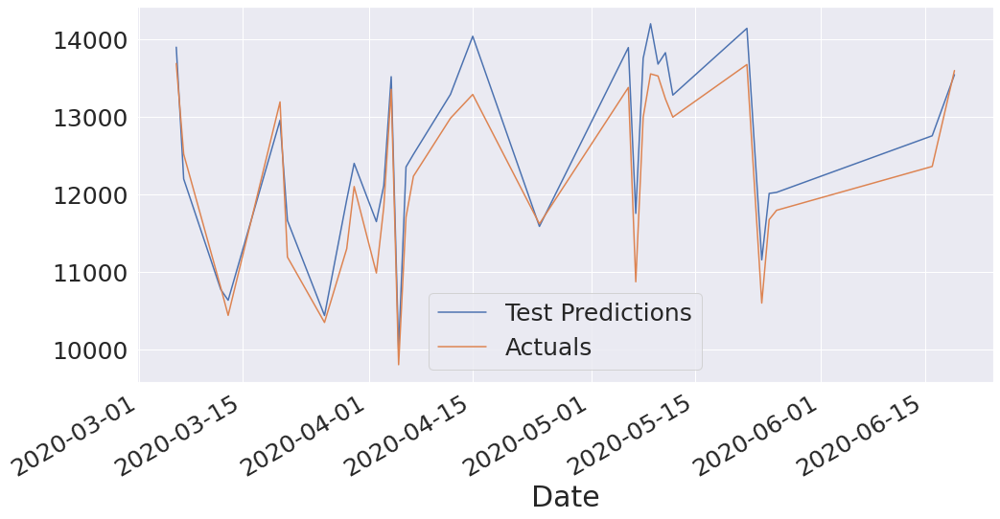

In [ ]:
mixeddays2['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays2['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays2 = cloudydays2[['Test Predictions',	'Actuals']]
cloudydays2

,Test Predictions,Actuals
Date,,
2020-01-09,9812.850586,9184.0
2020-01-10,9908.979492,9291.0
2020-01-11,4856.652832,5059.0
2020-01-12,2029.198975,1732.0
2020-01-13,6409.325684,6146.0
2020-01-14,8285.924805,8538.0
2020-01-15,4402.183105,3950.0
2020-01-16,6206.601562,6386.0
2020-01-17,8524.904297,8237.0


In [ ]:
cloudyarrap2 = cloudydays2['Test Predictions'].to_numpy()
cloudyac2 = cloudydays2['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy2 =r2_score(cloudyac2, cloudyarrap2)
mapecloudy2 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac2, cloudyarrap2)
maecloudy2 = tf.keras.metrics.mean_absolute_error(cloudyac2, cloudyarrap2)

mcloudy2 = tf.keras.metrics.RootMeanSquaredError()
mcloudy2.update_state(cloudyac2, cloudyarrap2)
rmsecloudy2 = mcloudy2.result().numpy()
meancloudy2 =np.mean(cloudyac2)
print('Rsqrared: ', Rsquaredcloudy2), print('MAPE: ',mapecloudy2), print('MAE: ',maecloudy2), print('RMSE: ',rmsecloudy2), print('Mean: ',meancloudy2)

Rsqrared:  0.9009682498032965
MAPE:  tf.Tensor(6.7563014, shape=(), dtype=float32)
MAE:  tf.Tensor(461.77032, shape=(), dtype=float32)
RMSE:  533.65674
Mean:  7225.5


(None, None, None, None, None)

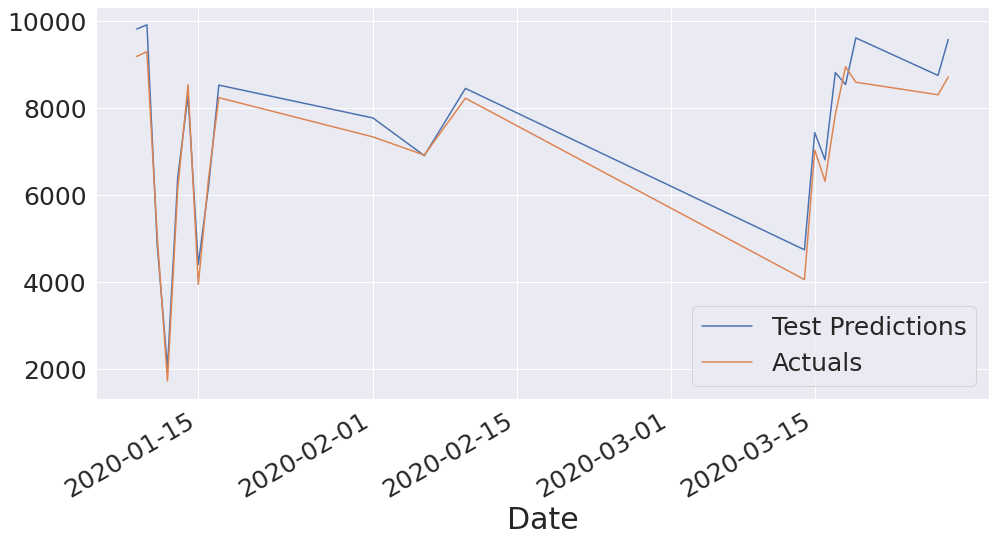

In [ ]:
cloudydays2['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays2['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **1D CONVOLUTIONAL**

In [ ]:
from keras.layers import *
model3 = Sequential()
model3.add(Conv1D(64, kernel_size=3, activation='relu',input_shape=(X_train.shape[1], X_train.shape[2])))
model3.add(MaxPooling1D(pool_size=2))
model3.add(Dropout(0.1))
model3.add(Flatten())
model3.add(Dense(8, 'relu'))
model3.add(Dense(1))

cp3 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/1DCONV2/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 67, 64)            2944      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 33, 64)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 33, 64)            0         
                                                                 
 flatten (Flatten)           (None, 2112)              0         
                                                                 
 dense_4 (Dense)             (None, 8)                 16904     
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                      

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 67, 64)            2944      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 33, 64)           0         
 )                                                               
                                                                 
 dropout_2 (Dropout)         (None, 33, 64)            0         
                                                                 
 flatten (Flatten)           (None, 2112)              0         
                                                                 
 dense_4 (Dense)             (None, 8)                 16904     
                                                                 
 dense_5 (Dense)             (None, 1)                 9         
                                                      

45/45 [==============================] - 5s 93ms/step - loss: 0.1964 - mape: 68960.2734 - root_mean_squared_error: 0.2535 - val_loss: 0.1319 - val_mape: 72585.5469 - val_root_mean_squared_error: 0.1687
Epoch 2/30
44/45 [============================>.] - ETA: 0s - loss: 0.1237 - mape: 45488.1445 - root_mean_squared_error: 0.1644
Epoch 2: val_loss improved from 0.13187 to 0.09253, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 44ms/step - loss: 0.1236 - mape: 45075.9492 - root_mean_squared_error: 0.1643 - val_loss: 0.0925 - val_mape: 61963.3828 - val_root_mean_squared_error: 0.1243
Epoch 3/30
43/45 [===========================>..] - ETA: 0s - loss: 0.1042 - mape: 34825.5234 - root_mean_squared_error: 0.1449
Epoch 3: val_loss improved from 0.09253 to 0.08249, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.1040 - mape: 33969.3789 - root_mean_squared_error: 0.1447 - val_loss: 0.0825 - val_mape: 66008.5938 - val_root_mean_squared_error: 0.1130
Epoch 4/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0943 - mape: 34320.4336 - root_mean_squared_error: 0.1348
Epoch 4: val_loss improved from 0.08249 to 0.07605, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0942 - mape: 33239.6719 - root_mean_squared_error: 0.1347 - val_loss: 0.0760 - val_mape: 57425.7812 - val_root_mean_squared_error: 0.1067
Epoch 5/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0870 - mape: 25815.7148 - root_mean_squared_error: 0.1274
Epoch 5: val_loss improved from 0.07605 to 0.07198, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 40ms/step - loss: 0.0869 - mape: 25632.0898 - root_mean_squared_error: 0.1273 - val_loss: 0.0720 - val_mape: 55468.5703 - val_root_mean_squared_error: 0.1015
Epoch 6/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0811 - mape: 23138.2969 - root_mean_squared_error: 0.1217
Epoch 6: val_loss improved from 0.07198 to 0.06928, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0811 - mape: 23062.8672 - root_mean_squared_error: 0.1216 - val_loss: 0.0693 - val_mape: 53674.9336 - val_root_mean_squared_error: 0.0981
Epoch 7/30
44/45 [============================>.] - ETA: 0s - loss: 0.0767 - mape: 21280.7734 - root_mean_squared_error: 0.1175
Epoch 7: val_loss improved from 0.06928 to 0.06811, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0767 - mape: 21491.1465 - root_mean_squared_error: 0.1174 - val_loss: 0.0681 - val_mape: 49679.7070 - val_root_mean_squared_error: 0.0973
Epoch 8/30
45/45 [==============================] - ETA: 0s - loss: 0.0737 - mape: 19203.3691 - root_mean_squared_error: 0.1148
Epoch 8: val_loss improved from 0.06811 to 0.06458, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0737 - mape: 19203.3691 - root_mean_squared_error: 0.1148 - val_loss: 0.0646 - val_mape: 42121.0625 - val_root_mean_squared_error: 0.0932
Epoch 9/30
45/45 [==============================] - ETA: 0s - loss: 0.0714 - mape: 19014.5430 - root_mean_squared_error: 0.1126
Epoch 9: val_loss did not improve from 0.06458
45/45 [==============================] - 1s 25ms/step - loss: 0.0714 - mape: 19014.5430 - root_mean_squared_error: 0.1126 - val_loss: 0.0646 - val_mape: 44949.8477 - val_root_mean_squared_error: 0.0952
Epoch 10/30
45/45 [==============================] - ETA: 0s - loss: 0.0694 - mape: 17781.5000 - root_mean_squared_error: 0.1109
Epoch 10: val_loss improved from 0.06458 to 0.06107, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0694 - mape: 17781.5000 - root_mean_squared_error: 0.1109 - val_loss: 0.0611 - val_mape: 33541.3320 - val_root_mean_squared_error: 0.0907
Epoch 11/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0677 - mape: 18066.8633 - root_mean_squared_error: 0.1094
Epoch 11: val_loss improved from 0.06107 to 0.06062, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0676 - mape: 17944.0371 - root_mean_squared_error: 0.1093 - val_loss: 0.0606 - val_mape: 32549.3516 - val_root_mean_squared_error: 0.0917
Epoch 12/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0663 - mape: 16823.9082 - root_mean_squared_error: 0.1082
Epoch 12: val_loss improved from 0.06062 to 0.05954, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0663 - mape: 16811.9258 - root_mean_squared_error: 0.1082 - val_loss: 0.0595 - val_mape: 29699.3027 - val_root_mean_squared_error: 0.0904
Epoch 13/30
44/45 [============================>.] - ETA: 0s - loss: 0.0649 - mape: 14125.5029 - root_mean_squared_error: 0.1070
Epoch 13: val_loss improved from 0.05954 to 0.05771, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 54ms/step - loss: 0.0649 - mape: 14236.0479 - root_mean_squared_error: 0.1070 - val_loss: 0.0577 - val_mape: 26756.3301 - val_root_mean_squared_error: 0.0888
Epoch 14/30
44/45 [============================>.] - ETA: 0s - loss: 0.0639 - mape: 13057.6445 - root_mean_squared_error: 0.1067
Epoch 14: val_loss improved from 0.05771 to 0.05760, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0639 - mape: 13327.4609 - root_mean_squared_error: 0.1066 - val_loss: 0.0576 - val_mape: 22624.0547 - val_root_mean_squared_error: 0.0880
Epoch 15/30
44/45 [============================>.] - ETA: 0s - loss: 0.0630 - mape: 13942.0664 - root_mean_squared_error: 0.1059
Epoch 15: val_loss improved from 0.05760 to 0.05558, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 40ms/step - loss: 0.0630 - mape: 13996.6865 - root_mean_squared_error: 0.1058 - val_loss: 0.0556 - val_mape: 20467.7070 - val_root_mean_squared_error: 0.0874
Epoch 16/30
44/45 [============================>.] - ETA: 0s - loss: 0.0621 - mape: 12635.6377 - root_mean_squared_error: 0.1053
Epoch 16: val_loss improved from 0.05558 to 0.05371, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0620 - mape: 12521.4062 - root_mean_squared_error: 0.1053 - val_loss: 0.0537 - val_mape: 19656.3516 - val_root_mean_squared_error: 0.0850
Epoch 17/30
44/45 [============================>.] - ETA: 0s - loss: 0.0614 - mape: 12985.1318 - root_mean_squared_error: 0.1049
Epoch 17: val_loss did not improve from 0.05371
45/45 [==============================] - 1s 25ms/step - loss: 0.0614 - mape: 12867.7051 - root_mean_squared_error: 0.1049 - val_loss: 0.0539 - val_mape: 15798.3838 - val_root_mean_squared_error: 0.0862
Epoch 18/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0607 - mape: 11401.6836 - root_mean_squared_error: 0.1044
Epoch 18: val_loss improved from 0.05371 to 0.05278, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0606 - mape: 12587.8652 - root_mean_squared_error: 0.1043 - val_loss: 0.0528 - val_mape: 16957.7617 - val_root_mean_squared_error: 0.0848
Epoch 19/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0600 - mape: 12765.0215 - root_mean_squared_error: 0.1041
Epoch 19: val_loss did not improve from 0.05278
45/45 [==============================] - 1s 24ms/step - loss: 0.0600 - mape: 12524.0352 - root_mean_squared_error: 0.1042 - val_loss: 0.0533 - val_mape: 15907.8682 - val_root_mean_squared_error: 0.0854
Epoch 20/30
44/45 [============================>.] - ETA: 0s - loss: 0.0593 - mape: 12535.2441 - root_mean_squared_error: 0.1037
Epoch 20: val_loss improved from 0.05278 to 0.05193, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0593 - mape: 12421.7764 - root_mean_squared_error: 0.1037 - val_loss: 0.0519 - val_mape: 17798.3457 - val_root_mean_squared_error: 0.0831
Epoch 21/30
44/45 [============================>.] - ETA: 0s - loss: 0.0589 - mape: 11844.0352 - root_mean_squared_error: 0.1036
Epoch 21: val_loss improved from 0.05193 to 0.05182, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0589 - mape: 11736.8682 - root_mean_squared_error: 0.1035 - val_loss: 0.0518 - val_mape: 16170.2646 - val_root_mean_squared_error: 0.0845
Epoch 22/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0585 - mape: 11693.0039 - root_mean_squared_error: 0.1034
Epoch 22: val_loss improved from 0.05182 to 0.05136, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0584 - mape: 11324.8096 - root_mean_squared_error: 0.1032 - val_loss: 0.0514 - val_mape: 18336.9746 - val_root_mean_squared_error: 0.0844
Epoch 23/30
45/45 [==============================] - ETA: 0s - loss: 0.0580 - mape: 10337.6924 - root_mean_squared_error: 0.1030
Epoch 23: val_loss improved from 0.05136 to 0.05037, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0580 - mape: 10337.6924 - root_mean_squared_error: 0.1030 - val_loss: 0.0504 - val_mape: 13157.0439 - val_root_mean_squared_error: 0.0819
Epoch 24/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0578 - mape: 11265.3457 - root_mean_squared_error: 0.1030
Epoch 24: val_loss improved from 0.05037 to 0.04826, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0578 - mape: 10910.7656 - root_mean_squared_error: 0.1030 - val_loss: 0.0483 - val_mape: 13122.7461 - val_root_mean_squared_error: 0.0810
Epoch 25/30
45/45 [==============================] - ETA: 0s - loss: 0.0571 - mape: 11620.1855 - root_mean_squared_error: 0.1025
Epoch 25: val_loss did not improve from 0.04826
45/45 [==============================] - 1s 25ms/step - loss: 0.0571 - mape: 11620.1855 - root_mean_squared_error: 0.1025 - val_loss: 0.0485 - val_mape: 10986.7959 - val_root_mean_squared_error: 0.0808
Epoch 26/30
44/45 [============================>.] - ETA: 0s - loss: 0.0568 - mape: 10791.8066 - root_mean_squared_error: 0.1023
Epoch 26: val_loss improved from 0.04826 to 0.04732, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 41ms/step - loss: 0.0569 - mape: 10694.1875 - root_mean_squared_error: 0.1024 - val_loss: 0.0473 - val_mape: 11304.7061 - val_root_mean_squared_error: 0.0808
Epoch 27/30
44/45 [============================>.] - ETA: 0s - loss: 0.0566 - mape: 10951.6201 - root_mean_squared_error: 0.1023
Epoch 27: val_loss did not improve from 0.04732
45/45 [==============================] - 1s 26ms/step - loss: 0.0566 - mape: 10852.5156 - root_mean_squared_error: 0.1022 - val_loss: 0.0479 - val_mape: 10477.1914 - val_root_mean_squared_error: 0.0801
Epoch 28/30
43/45 [===========================>..] - ETA: 0s - loss: 0.0562 - mape: 9910.7969 - root_mean_squared_error: 0.1020
Epoch 28: val_loss did not improve from 0.04732
45/45 [==============================] - 1s 25ms/step - loss: 0.0562 - mape: 9821.2021 - root_mean_squared_error: 0.1020 - val_loss: 0.0474 - val_mape: 12303.0420 - val_root_mean_squared_error: 0.0811
Epoch 29/30
43/45 [=======================

45/45 [==============================] - 2s 43ms/step - loss: 0.0560 - mape: 10505.0439 - root_mean_squared_error: 0.1020 - val_loss: 0.0470 - val_mape: 11126.9717 - val_root_mean_squared_error: 0.0812
Epoch 30/30
45/45 [==============================] - ETA: 0s - loss: 0.0557 - mape: 9582.8096 - root_mean_squared_error: 0.1019
Epoch 30: val_loss improved from 0.04698 to 0.04549, saving model to /content/drive/MyDrive/FYP complete files/1DCONV2/


45/45 [==============================] - 2s 42ms/step - loss: 0.0557 - mape: 9582.8096 - root_mean_squared_error: 0.1019 - val_loss: 0.0455 - val_mape: 11219.8242 - val_root_mean_squared_error: 0.0795


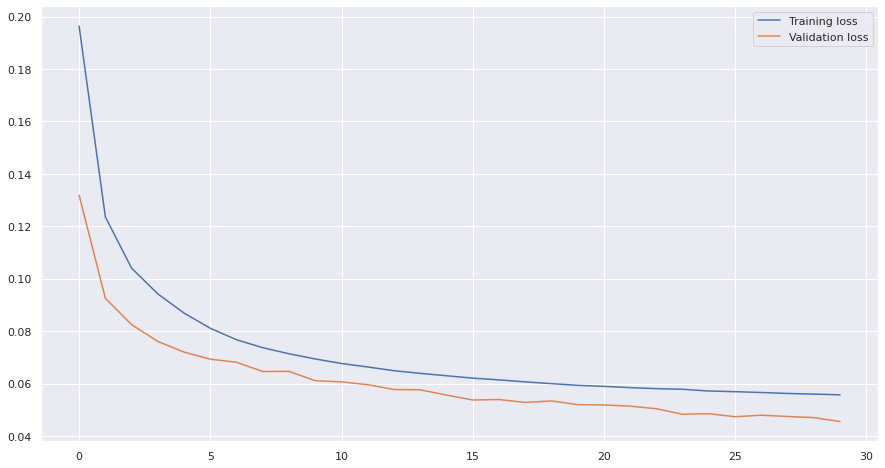

In [ ]:
model3.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005), loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model3.summary()
# fit the model
history3 = model3.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp3])
plt.plot(history3.history['loss'], label='Training loss')
plt.plot(history3.history['val_loss'], label='Validation loss')
plt.legend()

# **CNN analysis**

In [ ]:
from keras.models import load_model
model3 = load_model('/content/drive/MyDrive/FYP complete files/1DCONV1/')

dftrain3 = dftrain
X_train3 = X_train
train_predictions3 = model3.predict(X_train3)
prediction_copies3 = np.repeat(train_predictions3, dftrain3.shape[1], axis=-1)
train_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]

y_train3 = y_train
actual_copies3 = np.repeat(y_train3, dftrain3.shape[1], axis=-1)
y_train3 = Scaler.inverse_transform(actual_copies3)[:,0]

train_predictions3 = train_predictions3.flatten()
y_train3 = y_train3.flatten()


5684/5684 [==============================] - 19s 3ms/step


In [ ]:
train_results3 = pd.DataFrame(data={'Train Predictions':train_predictions3, 'Actuals':y_train3, 'Date':traindates[69:]})
train_results3.set_index('Date', inplace = True)
train_results3.head()

,Train Predictions,Actuals
Date,,
1998-01-04 10:30:00,699.840515,688.0
1998-01-04 11:00:00,759.057678,749.0
1998-01-04 11:30:00,801.853882,793.0
1998-01-04 12:00:00,828.702820,819.0
1998-01-04 12:30:00,822.905090,826.0


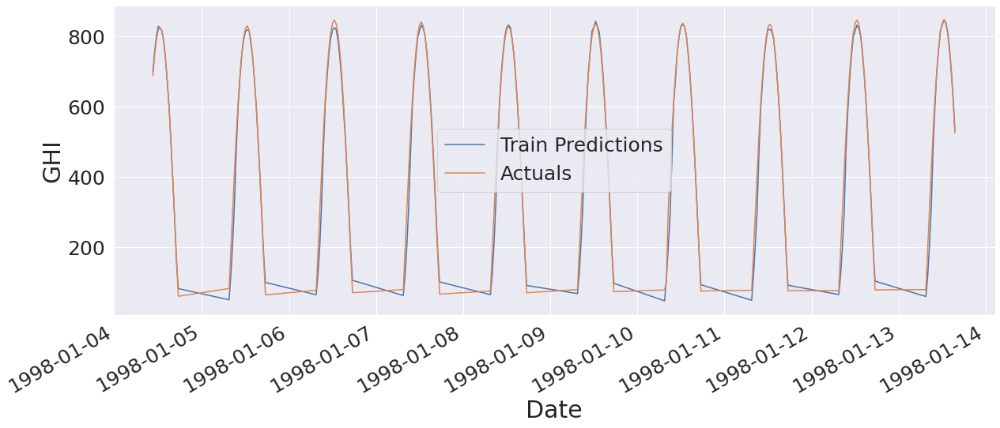

In [ ]:
train_results3['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results3['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval3 = dfval
X_val3 = X_val
val_predictions3 = model3.predict(X_val3)
prediction_copies3 = np.repeat(val_predictions3, dfval3.shape[1], axis=-1)
#val_predictions3 = Scalervl.inverse_transform(prediction_copies3)[:,0]
val_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]


y_val3 = y_val
actual_copies3 = np.repeat(y_val3, dfval3.shape[1], axis=-1)
#y_val3 = Scalervl.inverse_transform(actual_copies3)[:,0]
y_val3 = Scaler.inverse_transform(actual_copies3)[:,0]

val_predictions3 = val_predictions3.flatten()
y_val3 = y_val3.flatten()

val_results3 = pd.DataFrame(data={'Val Predictions':val_predictions3, 'Actuals':y_val3, 'Date':valdates[69:]})
val_results3.set_index('Date', inplace = True)
val_results3.head()

281/281 [==============================] - 1s 3ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 10:00:00,645.161377,610.0
2019-01-01 10:30:00,722.304626,686.0
2019-01-01 11:00:00,775.913879,746.0
2019-01-01 11:30:00,806.784790,789.0
2019-01-01 12:00:00,820.580566,814.0


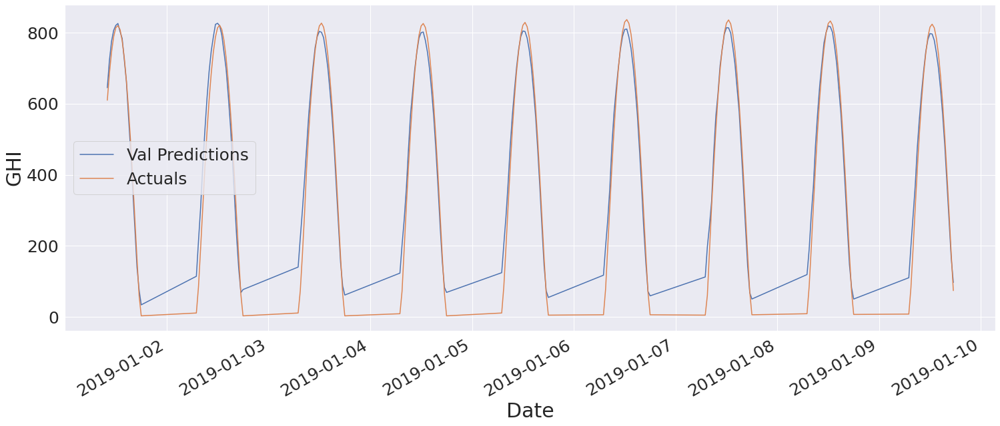

In [ ]:
val_results3['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results3['Actuals'][:200].plot(figsize=(25,10), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest3 = dftest
X_test3 = X_test
test_predictions3 = model3.predict(X_test3)
prediction_copies3 = np.repeat(test_predictions3, dftest3.shape[1], axis=-1)
#test_predictions3 = Scalerts.inverse_transform(prediction_copies3)[:,0]
test_predictions3 = Scaler.inverse_transform(prediction_copies3)[:,0]


y_test3 = y_test
actual_copies3 = np.repeat(y_test3, dftest3.shape[1], axis=-1)
#y_test3 = Scalerts.inverse_transform(actual_copies3)[:,0]
y_test3 = Scaler.inverse_transform(actual_copies3)[:,0]


y_test3 = y_test3.flatten()

test_results3 = pd.DataFrame(data={'Test Predictions':test_predictions3, 'Actuals':y_test3.flatten(), 'Date':testdates[69:]})
test_results3.set_index('Date', inplace = True)
Rsquared3 =r2_score(y_test3, test_predictions3)
mape3 = tf.keras.metrics.mean_absolute_percentage_error(y_test3, test_predictions3)
mae3 = tf.keras.metrics.mean_absolute_error(y_test3, test_predictions3)

m3 = tf.keras.metrics.RootMeanSquaredError()
m3.update_state(y_test3, test_predictions3)
rmse3 = m3.result().numpy()

#rmse3 =  tf.keras.metrics.RootMeanSquaredError(y_test3, test_predictions3)
mean3 =np.mean(y_test3)
test_results3, print('Rsqrared: ', Rsquared3), print('MAPE: ',mape3), print('MAE: ',mae3), print('RMSE: ',rmse3), print('Mean: ',mean3)

283/283 [==============================] - 1s 3ms/step
Rsqrared:  0.9287616859632447
MAPE:  tf.Tensor(76.19058, shape=(), dtype=float32)
MAE:  tf.Tensor(56.42771, shape=(), dtype=float32)
RMSE:  87.99734
Mean:  516.662027833002


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 07:00:00        129.246826     11.0
 2020-01-01 07:30:00        206.617950     84.0
 2020-01-01 08:00:00        283.264923    190.0
 2020-01-01 08:30:00        377.512665    302.0
 2020-01-01 09:00:00        475.269897    410.0
 ...                               ...      ...
 2020-12-31 16:00:00        356.391968    379.0
 2020-12-31 16:30:00        249.874207    268.0
 2020-12-31 17:00:00        143.735733    156.0
 2020-12-31 17:30:00         80.086464     56.0
 2020-12-31 18:00:00         65.945251      2.0
 
 [9054 rows x 2 columns], None, None, None, None, None)

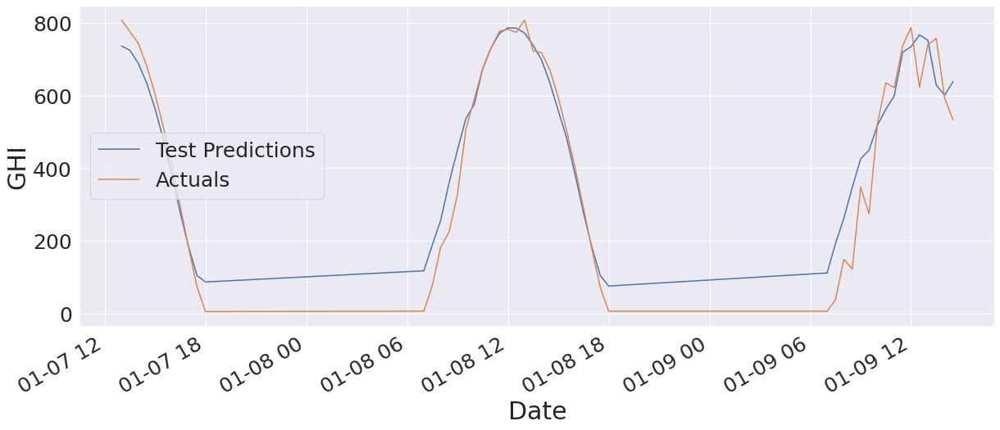

In [ ]:
test_results3['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results3['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

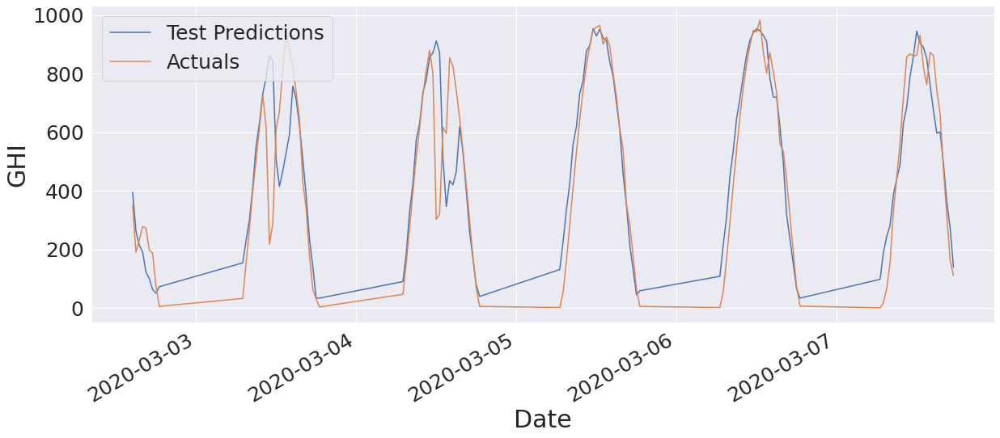

In [ ]:
test_results3['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results3['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

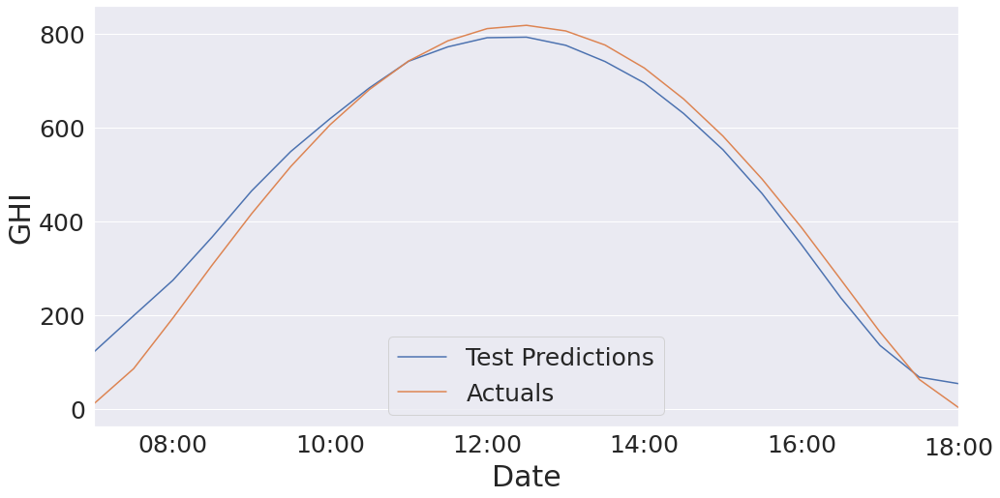

In [ ]:
test_results3['Test Predictions'][46:69].plot(figsize=(16,8), label='Test Predictions')
test_results3['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results30 = test_results3
test_results3 = test_results3.reset_index()
test_results3 = test_results3.drop(['Date'], axis = 'columns')

# **Daily Reults CONV**

In [ ]:
testyear3 = pd.concat([testyear,test_results3], axis = 'columns')
testyear3.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:00:00,11,11,89.67,100.00,12.8,0,0,0,0,0,0,0,0,0,1.0,129.246826,11.0
1,2020-01-01 07:30:00,84,84,83.62,100.00,13.5,0,0,0,0,0,0,0,0,0,1.0,206.617950,84.0
2,2020-01-01 08:00:00,190,190,77.47,100.00,14.2,0,0,0,0,0,0,0,0,0,1.0,283.264923,190.0
3,2020-01-01 08:30:00,302,302,71.50,98.21,14.7,0,0,0,0,0,0,0,0,0,1.0,377.512665,302.0
4,2020-01-01 09:00:00,410,410,65.79,96.10,15.1,0,0,0,0,0,0,0,0,0,1.0,475.269897,410.0


In [ ]:
testyear3 = testyear3.resample('D',on='Date').sum()

In [ ]:
testyear3.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,11127.082031,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10983.534180,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11076.790039,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,11045.827148,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11176.376953,11022.0


In [ ]:
#testyear3 = testyear3.dropna()
testyear3 = testyear3.drop("2020-02-29")
testyear3

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,11127.082031,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10983.534180,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11076.790039,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,11045.827148,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11176.376953,11022.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,8899,10632,1443.03,1977.09,369.8,0,0,0,7,0,0,0,0,0,18.708492,9875.774414,8899.0
2020-12-28,10694,10694,1442.13,1983.03,382.9,0,0,0,0,0,0,0,0,0,23.000000,11021.222656,10694.0
2020-12-29,10621,10621,1441.10,2079.72,389.4,0,0,0,0,0,0,0,0,0,23.000000,11043.196289,10621.0


In [ ]:
testyear3['cluster'] = clusters
testyear3.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,11127.082031,10656.0,0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10983.534180,10756.0,0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11076.790039,10910.0,0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,11045.827148,10739.0,0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11176.376953,11022.0,0


# **Dividing days according to clusters CONV**

In [ ]:
 Fullyear3= testyear3[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap3 =  Fullyear3['Test Predictions'].to_numpy()
Fullyearac3 =  Fullyear3['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear3 =r2_score(Fullyearac3, Fullyeararrap3)
mapeFullyear3 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac3, Fullyeararrap3)
maeFullyear3 = tf.keras.metrics.mean_absolute_error(Fullyearac3, Fullyeararrap3)

mFullyear3 = tf.keras.metrics.RootMeanSquaredError()
mFullyear3.update_state(Fullyearac3, Fullyeararrap3)
rmseFullyear3 = mFullyear3.result().numpy()
meanFullyear3 =np.mean(Fullyearac3)
print('Rsqrared: ', RsquaredFullyear3), print('MAPE: ',mapeFullyear3), print('MAE: ',maeFullyear3), print('RMSE: ',rmseFullyear3), print('Mean: ',meanFullyear3)



Rsqrared:  0.9564958259406598
MAPE:  tf.Tensor(4.358856, shape=(), dtype=float32)
MAE:  tf.Tensor(480.92578, shape=(), dtype=float32)
RMSE:  653.73016
Mean:  12816.049315068492


(None, None, None, None, None)

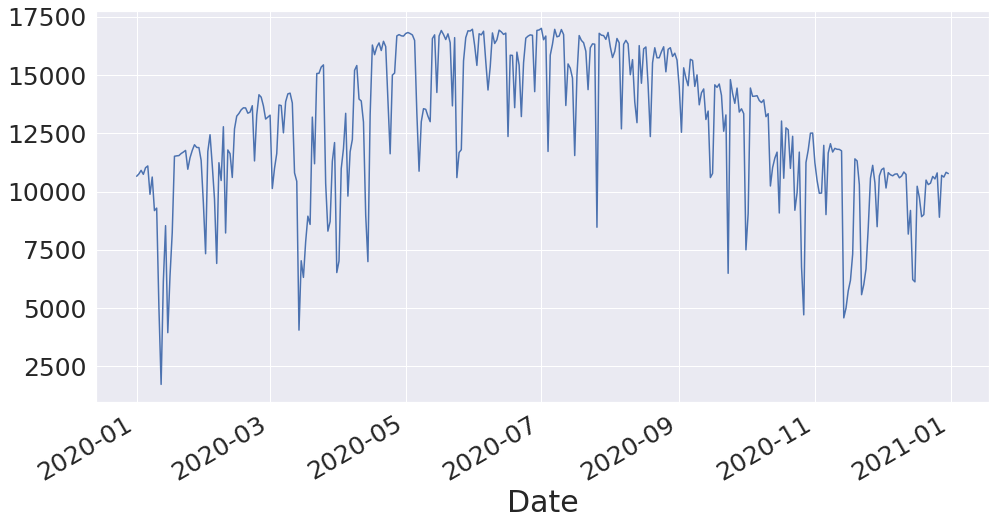

In [ ]:
Fullyear3['Actuals'][:].plot(figsize=(16,8), label='Actuals')

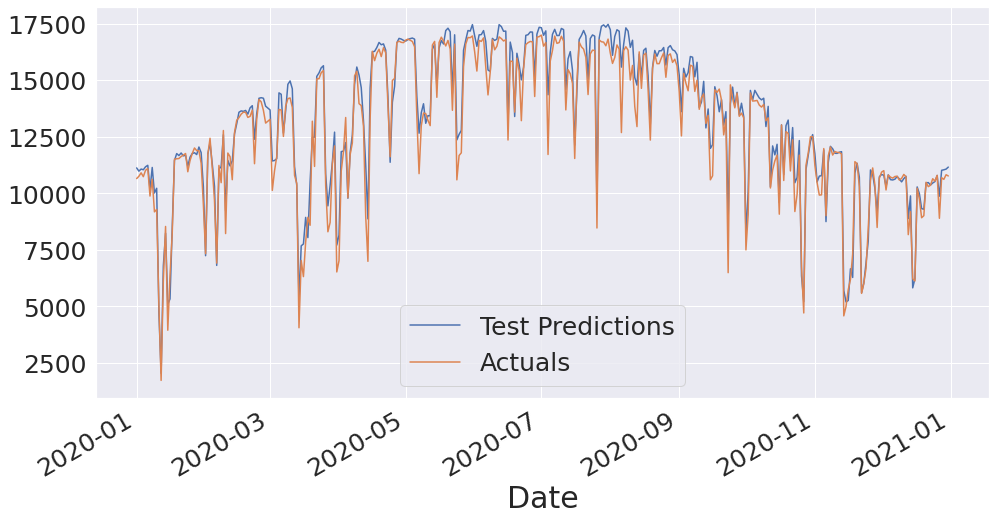

In [ ]:
Fullyear3['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear3['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays3 = testyear3[testyear3.cluster == clus]
mixeddays3 = testyear3[testyear3.cluster == clum]
cloudydays3 = testyear3[testyear3.cluster == cluc]

In [ ]:
sunnydays1 = sunnydays1[['Test Predictions',	'Actuals']]
sunnydays1

,Test Predictions,Actuals
Date,,
2020-02-25,14066.404297,14151.0
2020-02-26,14014.726562,14047.0
2020-03-08,13653.858398,13851.0
2020-03-09,14406.878906,14188.0
2020-03-10,14326.210938,14220.0
2020-03-11,14028.220703,13798.0
2020-03-22,15125.623047,15061.0
2020-03-23,15097.274414,15072.0
2020-03-24,15394.041992,15339.0


In [ ]:
sunnyarrap3 = sunnydays3['Test Predictions'].to_numpy()
sunnyac3 = sunnydays3['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny3 =r2_score(sunnyac3, sunnyarrap3)
mapesunny3 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac3, sunnyarrap3)
maesunny3 = tf.keras.metrics.mean_absolute_error(sunnyac3, sunnyarrap3)

msunny3 = tf.keras.metrics.RootMeanSquaredError()
msunny3.update_state(sunnyac3, sunnyarrap3)
rmsesunny3 = msunny3.result().numpy()
meansunny3 =np.mean(sunnyac3)
print('Rsqrared: ', Rsquaredsunny3), print('MAPE: ',mapesunny3), print('MAE: ',maesunny3), print('RMSE: ',rmsesunny3), print('Mean: ',meansunny3)



Rsqrared:  0.7155424200764956
MAPE:  tf.Tensor(2.8301053, shape=(), dtype=float32)
MAE:  tf.Tensor(439.98322, shape=(), dtype=float32)
RMSE:  535.13104
Mean:  15727.064102564103


(None, None, None, None, None)

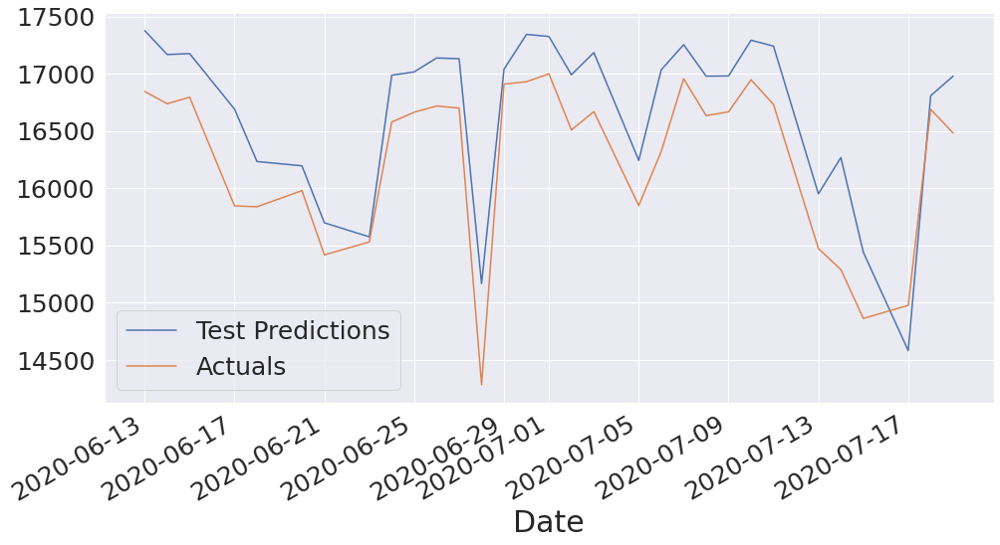

In [ ]:
sunnydays3['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays3['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays3 = mixeddays3[['Test Predictions',	'Actuals']]
mixdays3

,Test Predictions,Actuals
Date,,
2020-01-01,11127.082031,10656.0
2020-01-02,10983.534180,10756.0
2020-01-03,11076.790039,10910.0
2020-01-04,11045.827148,10739.0
2020-01-05,11176.376953,11022.0
2020-01-06,11242.041992,11098.0
2020-01-07,10183.185547,9882.0
2020-01-08,11146.650391,10623.0
2020-01-18,11449.639648,11514.0


In [ ]:
mixarrap3 = mixeddays3['Test Predictions'].to_numpy()
mixac3 = mixeddays3['Actuals'].to_numpy()

In [ ]:
Rsquaredmix3 =r2_score(mixac3, mixarrap3)
mapemix3 = tf.keras.metrics.mean_absolute_percentage_error(mixac3, mixarrap3)
maemix3 = tf.keras.metrics.mean_absolute_error(mixac3, mixarrap3)

mmix3 = tf.keras.metrics.RootMeanSquaredError()
mmix3.update_state(mixac3, mixarrap3)
rmsemix3 = mmix3.result().numpy()
meanmix3 =np.mean(mixac3)
print('Rsqrared: ', Rsquaredmix3), print('MAPE: ',mapemix3), print('MAE: ',maemix3), print('RMSE: ',rmsemix3), print('Mean: ',meanmix3)



Rsqrared:  0.6923639259800953
MAPE:  tf.Tensor(3.60524, shape=(), dtype=float32)
MAE:  tf.Tensor(421.42697, shape=(), dtype=float32)
RMSE:  634.9557
Mean:  11717.993710691824


(None, None, None, None, None)

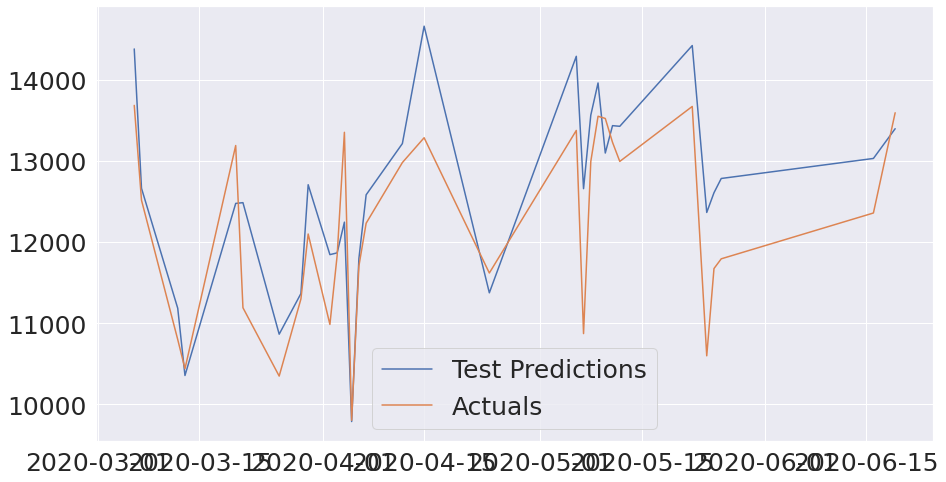

In [ ]:
plt.plot(mixeddays3['Test Predictions'][50:81], label='Test Predictions')
plt.plot(mixeddays3['Actuals'][50:81], label='Actuals')
plt.legend()

In [ ]:
cloudydays3 = cloudydays3[['Test Predictions',	'Actuals']]
cloudydays3

,Test Predictions,Actuals
Date,,
2020-01-09,10018.779297,9184.0
2020-01-10,10226.408203,9291.0
2020-01-11,4739.728027,5059.0
2020-01-12,2046.417969,1732.0
2020-01-13,6796.513184,6146.0
2020-01-14,8238.419922,8538.0
2020-01-15,5102.039551,3950.0
2020-01-16,5333.461426,6386.0
2020-01-17,8501.242188,8237.0


In [ ]:
cloudyarrap3 = cloudydays3['Test Predictions'].to_numpy()
cloudyac3 = cloudydays3['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy3 =r2_score(cloudyac3, cloudyarrap3)
mapecloudy3 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac3, cloudyarrap3)
maecloudy3 = tf.keras.metrics.mean_absolute_error(cloudyac3, cloudyarrap3)

mcloudy3 = tf.keras.metrics.RootMeanSquaredError()
mcloudy3.update_state(cloudyac3, cloudyarrap3)
rmsecloudy3 = mcloudy3.result().numpy()
meancloudy3 =np.mean(cloudyac3)
print('Rsqrared: ', Rsquaredcloudy3), print('MAPE: ',mapecloudy3), print('MAE: ',maecloudy3), print('RMSE: ',rmsecloudy3), print('Mean: ',meancloudy3)

Rsqrared:  0.6716619916826087
MAPE:  tf.Tensor(11.525058, shape=(), dtype=float32)
MAE:  tf.Tensor(797.8727, shape=(), dtype=float32)
RMSE:  971.70715
Mean:  7225.5


(None, None, None, None, None)

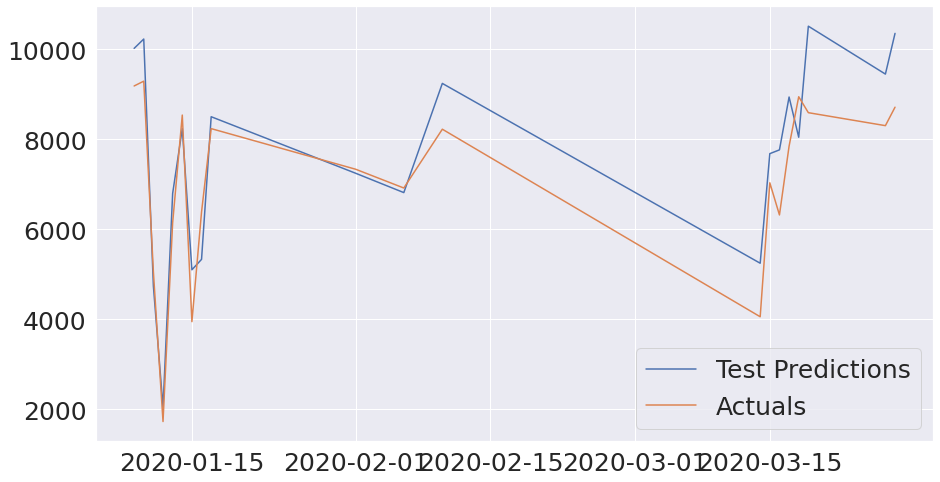

In [ ]:
plt.plot(cloudydays3['Test Predictions'][:20], label='Test Predictions')
plt.plot(cloudydays3['Actuals'][:20], label='Actuals')
plt.legend()

# **RNN**

In [ ]:
from tensorflow.keras.layers import SimpleRNN
model4 = Sequential()
model4.add(SimpleRNN(64, activation='relu', input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model4.add(SimpleRNN(32, activation='relu', return_sequences=False))
model4.add(Dropout(0.1))
model4.add(Dense(32))
#model4.add(Dense(16))
#model4.add(Dense(8))
model4.add(Dense(y_train.shape[1]))
cp4 = ModelCheckpoint(filepath = '/content/drive/MyDrive/FYP complete files/RNN2/', monitor = 'val_loss',mode = 'min' , save_best_only=True, verbose = 2)
model4.summary()



In [ ]:
model4.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0005) , loss='mae', metrics=['mape' , tf.keras.metrics.RootMeanSquaredError()])
model4.summary()
# fit the model
history4 = model4.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=30, batch_size=4096, callbacks=[cp4])
plt.plot(history4.history['loss'], label='Training loss')
plt.plot(history4.history['val_loss'], label='Validation loss')
plt.legend()

# **RNN analysis**

In [ ]:
from tensorflow.keras.models import load_model
model4 = load_model('/content/drive/MyDrive/FYP complete files/RNN1/')

dftrain4 = dftrain
X_train4 = X_train
train_predictions4 = model4.predict(X_train4)
prediction_copies4 = np.repeat(train_predictions4, dftrain4.shape[1], axis=-1)
train_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]

y_train4 = y_train
actual_copies4 = np.repeat(y_train4, dftrain4.shape[1], axis=-1)
y_train4 = Scaler.inverse_transform(actual_copies4)[:,0]

train_predictions4 = train_predictions4.flatten()
y_train4 = y_train4.flatten()

train_results4 = pd.DataFrame(data={'Train Predictions':train_predictions4, 'Actuals':y_train4})
train_results4.head()

5684/5684 [==============================] - 61s 11ms/step


,Train Predictions,Actuals
0,701.537170,688.0
1,758.588806,749.0
2,801.260742,793.0
3,824.013794,819.0
4,825.291077,826.0


In [ ]:
train_results4 = pd.DataFrame(data={'Train Predictions':train_predictions4, 'Actuals':y_train4, 'Date':traindates[69:]})
train_results4.set_index('Date', inplace = True)
train_results4.head()

,Train Predictions,Actuals
Date,,
1998-01-04 10:30:00,701.537170,688.0
1998-01-04 11:00:00,758.588806,749.0
1998-01-04 11:30:00,801.260742,793.0
1998-01-04 12:00:00,824.013794,819.0
1998-01-04 12:30:00,825.291077,826.0


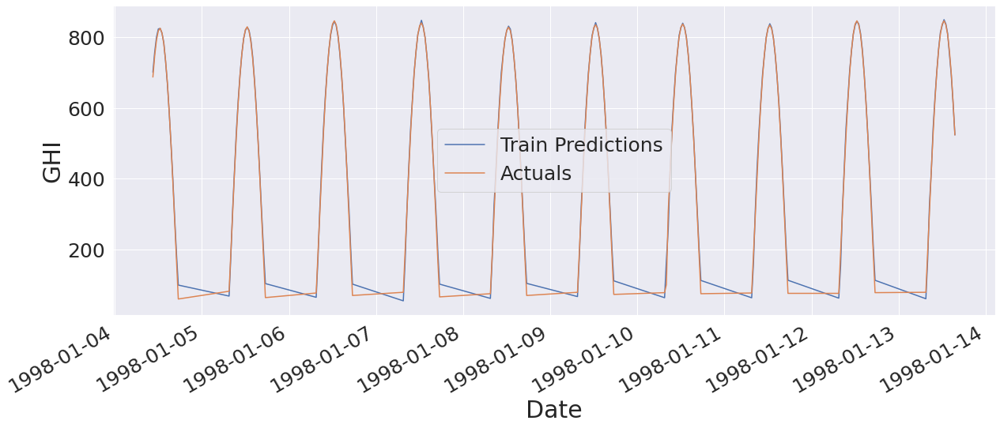

In [ ]:
train_results4['Train Predictions'][:200].plot(figsize=(20,8), label='Train Predictions')
train_results4['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()


In [ ]:
dfval4 = dfval
X_val4 = X_val
val_predictions4 = model4.predict(X_val4)
prediction_copies4 = np.repeat(val_predictions4, dfval4.shape[1], axis=-1)
#val_predictions4 = Scalervl.inverse_transform(prediction_copies4)[:,0]
val_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]


y_val4 = y_val
actual_copies4 = np.repeat(y_val4, dfval4.shape[1], axis=-1)
#y_val4 = Scalervl.inverse_transform(actual_copies4)[:,0]
y_val4 = Scaler.inverse_transform(actual_copies4)[:,0]

val_predictions4 = val_predictions4.flatten()
y_val4 = y_val4.flatten()

val_results4 = pd.DataFrame(data={'Val Predictions':val_predictions4, 'Actuals':y_val4, 'Date':valdates[69:]})
val_results4.set_index('Date', inplace = True)
val_results4.head()

281/281 [==============================] - 3s 9ms/step


,Val Predictions,Actuals
Date,,
2019-01-01 10:00:00,608.910156,610.0
2019-01-01 10:30:00,693.563477,686.0
2019-01-01 11:00:00,749.027527,746.0
2019-01-01 11:30:00,785.509033,789.0
2019-01-01 12:00:00,812.935913,814.0


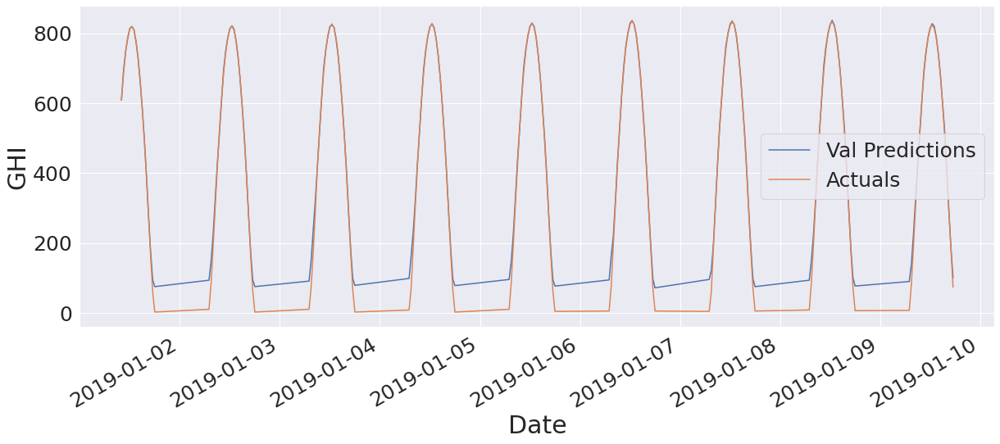

In [ ]:
val_results4['Val Predictions'][:200].plot(figsize=(20,8), label='Val Predictions')
val_results4['Actuals'][:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
from sklearn.metrics import r2_score

dftest4 = dftest
X_test4 = X_test
test_predictions4 = model4.predict(X_test4)
prediction_copies4 = np.repeat(test_predictions4, dftest4.shape[1], axis=-1)
#test_predictions4 = Scalerts.inverse_transform(prediction_copies4)[:,0]
test_predictions4 = Scaler.inverse_transform(prediction_copies4)[:,0]


y_test4 = y_test
actual_copies4 = np.repeat(y_test4, dftest4.shape[1], axis=-1)
#y_test4 = Scalerts.inverse_transform(actual_copies4)[:,0]
y_test4 = Scaler.inverse_transform(actual_copies4)[:,0]


y_test4 = y_test4.flatten()

test_results4 = pd.DataFrame(data={'Test Predictions':test_predictions4, 'Actuals':y_test4.flatten(), 'Date':testdates[69:]})
test_results4.set_index('Date', inplace = True)
Rsquared4 =r2_score(y_test4, test_predictions4)
mape4 = tf.keras.metrics.mean_absolute_percentage_error(y_test4, test_predictions4)
mae4 = tf.keras.metrics.mean_absolute_error(y_test4, test_predictions4)

m4 = tf.keras.metrics.RootMeanSquaredError()
m4.update_state(y_test4, test_predictions4)
rmse4 = m4.result().numpy()

#rmse4 =  tf.keras.metrics.RootMeanSquaredError(y_test4, test_predictions4)
mean4 =np.mean(y_test4)
test_results4, print('Rsqrared: ', Rsquared4), print('MAPE: ',mape4), print('MAE: ',mae4), print('RMSE: ',rmse4), print('Mean: ',mean4)

283/283 [==============================] - 3s 9ms/step
Rsqrared:  0.9684745155749328
MAPE:  tf.Tensor(75.53307, shape=(), dtype=float32)
MAE:  tf.Tensor(32.66405, shape=(), dtype=float32)
RMSE:  58.53877
Mean:  516.662027833002


(                     Test Predictions  Actuals
 Date                                          
 2020-01-01 07:00:00         91.492935     11.0
 2020-01-01 07:30:00        148.107254     84.0
 2020-01-01 08:00:00        228.435944    190.0
 2020-01-01 08:30:00        319.602631    302.0
 2020-01-01 09:00:00        425.441223    410.0
 ...                               ...      ...
 2020-12-31 16:00:00        389.379395    379.0
 2020-12-31 16:30:00        276.039825    268.0
 2020-12-31 17:00:00        172.984467    156.0
 2020-12-31 17:30:00         90.512215     56.0
 2020-12-31 18:00:00         76.159264      2.0
 
 [9054 rows x 2 columns], None, None, None, None, None)

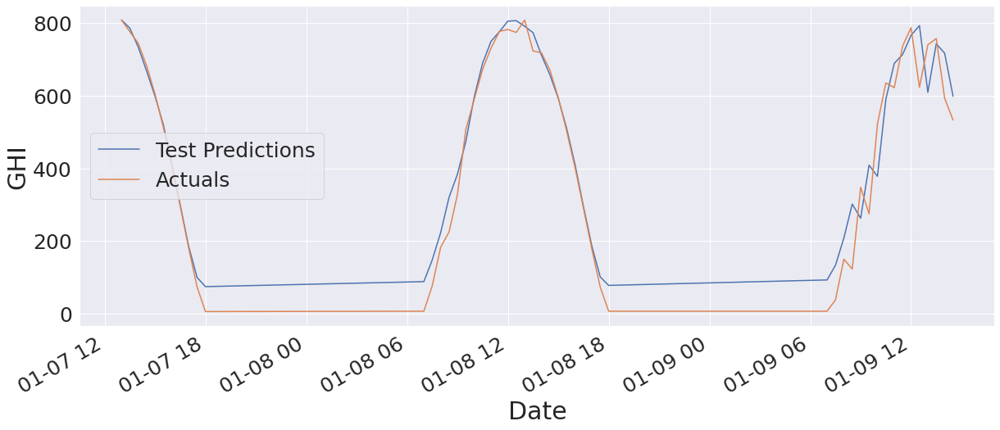

In [ ]:
test_results4['Test Predictions'][150:200].plot(figsize=(20,8), label='Test Predictions')
test_results4['Actuals'][150:200].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

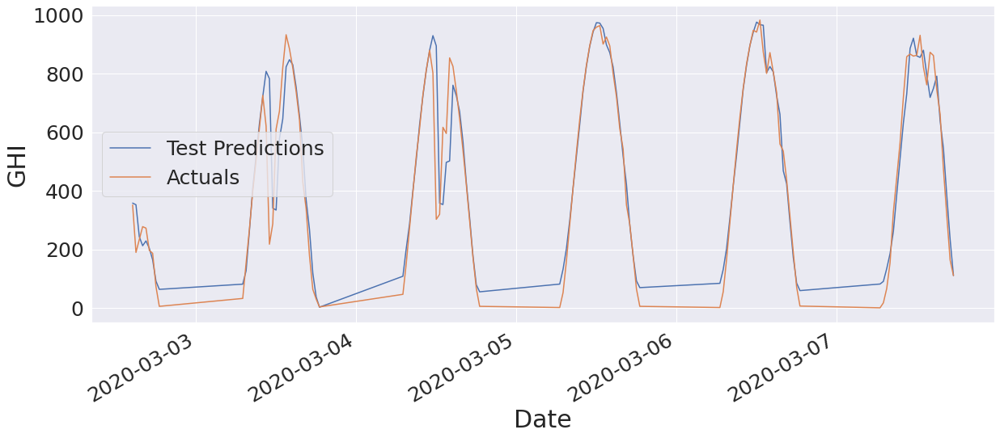

In [ ]:
test_results4['Test Predictions'][1410:1540].plot(figsize=(20,8), label='Test Predictions')
test_results4['Actuals'][1410:1540].plot(figsize=(20,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

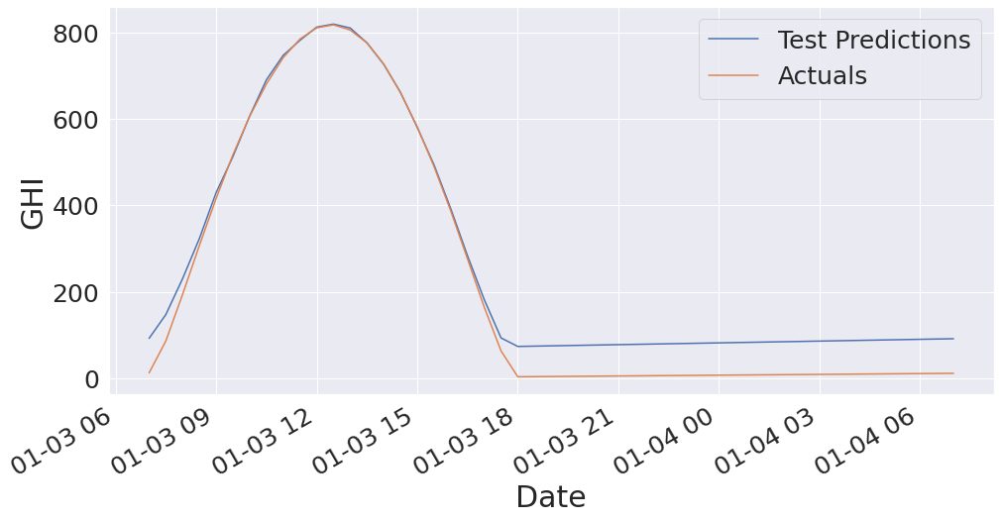

In [ ]:
test_results4['Test Predictions'][46:70].plot(figsize=(16,8), label='Test Predictions')
test_results4['Actuals'][46:70].plot(figsize=(16,8), label='Actuals')
plt.xlabel('Date')
plt.ylabel('GHI')
plt.legend()

In [ ]:
test_results40 = test_results4 
test_results4 = test_results4.reset_index()
test_results4 = test_results4.drop(['Date'], axis = 'columns')

# **Daily Reults RNN**

In [ ]:
testyear4 = pd.concat([testyear,test_results4], axis = 'columns')
testyear4.head()

,Date,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
0,2020-01-01 07:00:00,11,11,89.67,100.00,12.8,0,0,0,0,0,0,0,0,0,1.0,91.492935,11.0
1,2020-01-01 07:30:00,84,84,83.62,100.00,13.5,0,0,0,0,0,0,0,0,0,1.0,148.107254,84.0
2,2020-01-01 08:00:00,190,190,77.47,100.00,14.2,0,0,0,0,0,0,0,0,0,1.0,228.435944,190.0
3,2020-01-01 08:30:00,302,302,71.50,98.21,14.7,0,0,0,0,0,0,0,0,0,1.0,319.602631,302.0
4,2020-01-01 09:00:00,410,410,65.79,96.10,15.1,0,0,0,0,0,0,0,0,0,1.0,425.441223,410.0


In [ ]:
testyear4 = testyear4.resample('D',on='Date').sum()

In [ ]:
testyear1.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,10893.426758,10656.0,0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,10887.471680,10756.0,0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11087.994141,10910.0,0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,10898.333984,10739.0,0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11158.486328,11022.0,0


In [ ]:
#testyear4 = testyear4.dropna()
testyear4 = testyear4.drop("2020-02-29")
testyear4

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals
Date,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,11083.733398,10656.0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,11162.213867,10756.0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11266.438477,10910.0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,11122.605469,10739.0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11339.690430,11022.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,8899,10632,1443.03,1977.09,369.8,0,0,0,7,0,0,0,0,0,18.708492,9942.545898,8899.0
2020-12-28,10694,10694,1442.13,1983.03,382.9,0,0,0,0,0,0,0,0,0,23.000000,11109.434570,10694.0
2020-12-29,10621,10621,1441.10,2079.72,389.4,0,0,0,0,0,0,0,0,0,23.000000,11046.758789,10621.0


In [ ]:
testyear4['cluster'] = clusters
testyear4.head()

,GHI,Clearsky GHI,Solar Zenith Angle,Relative Humidity,Temperature,Probably Clear,Fog,Water,Super-Cooled Water,Mixed,Opaque Ice,Cirrus,Overlapping,Overshooting,clearness-index,Test Predictions,Actuals,cluster
Date,,,,,,,,,,,,,,,,,,
2020-01-01,10656,10697,1438.39,2098.58,367.2,0,0,0,0,0,0,0,0,0,22.940630,11083.733398,10656.0,0
2020-01-02,10756,10797,1436.98,2092.84,376.4,0,0,0,0,0,0,0,0,0,22.914226,11162.213867,10756.0,0
2020-01-03,10910,10910,1435.46,1925.47,389.7,0,0,0,0,0,0,0,0,0,23.000000,11266.438477,10910.0,0
2020-01-04,10739,10739,1433.85,2078.62,389.7,0,0,0,0,0,0,0,0,0,23.000000,11122.605469,10739.0,0
2020-01-05,11022,11022,1432.11,1985.09,372.4,0,0,0,0,0,0,0,0,0,23.000000,11339.690430,11022.0,0


# **Dividing days according to clusters RNN**

In [ ]:
 Fullyear4= testyear4[['Test Predictions',	'Actuals']]

In [ ]:
Fullyeararrap4 =  Fullyear4['Test Predictions'].to_numpy()
Fullyearac4 =  Fullyear4['Actuals'].to_numpy()

In [ ]:
RsquaredFullyear4 =r2_score(Fullyearac4, Fullyeararrap4)
mapeFullyear4 = tf.keras.metrics.mean_absolute_percentage_error(Fullyearac4, Fullyeararrap4)
maeFullyear4 = tf.keras.metrics.mean_absolute_error(Fullyearac4, Fullyeararrap4)

mFullyear4 = tf.keras.metrics.RootMeanSquaredError()
mFullyear4.update_state(Fullyearac4, Fullyeararrap4)
rmseFullyear4 = mFullyear4.result().numpy()
meanFullyear4 =np.mean(Fullyearac4)
print('Rsqrared: ', RsquaredFullyear4), print('MAPE: ',mapeFullyear4), print('MAE: ',maeFullyear4), print('RMSE: ',rmseFullyear4), print('Mean: ',meanFullyear4)



Rsqrared:  0.9828877929988726
MAPE:  tf.Tensor(3.1450975, shape=(), dtype=float32)
MAE:  tf.Tensor(319.41748, shape=(), dtype=float32)
RMSE:  410.00208
Mean:  12816.049315068492


(None, None, None, None, None)

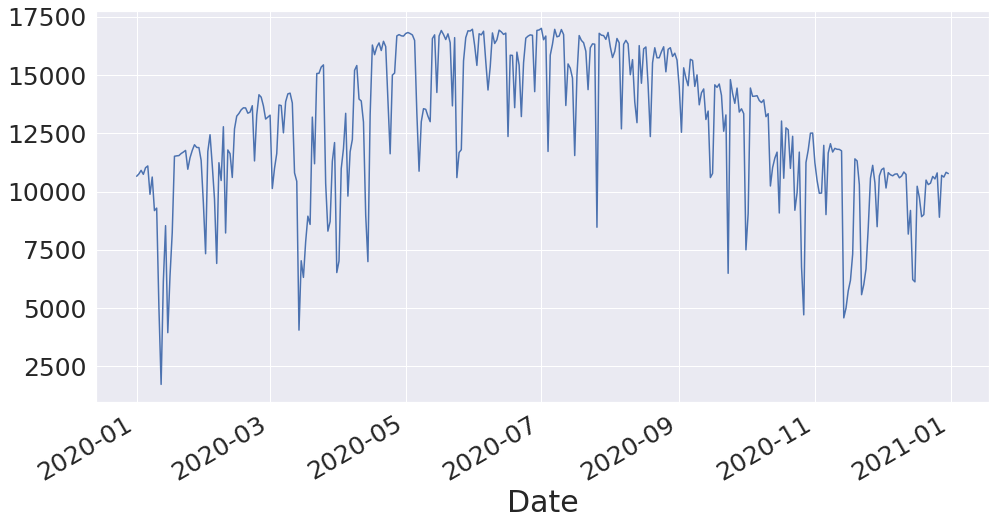

In [ ]:
Fullyear4['Actuals'][:].plot(figsize=(16,8), label='Actuals')

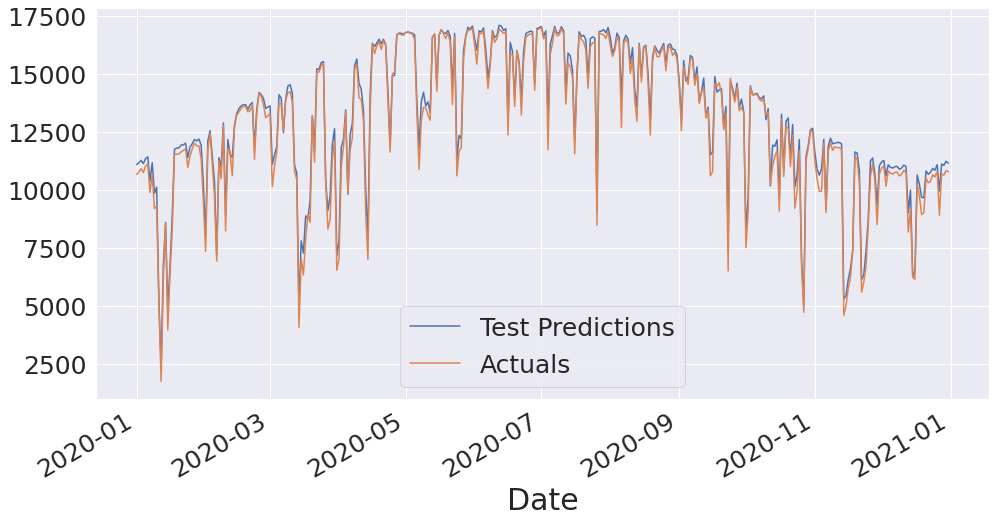

In [ ]:
Fullyear4['Test Predictions'][:].plot(figsize=(16,8), label='Test Predictions')
Fullyear4['Actuals'][:].plot(figsize=(16,8), label='Actuals')
plt.legend()

# Cluster sorting

In [ ]:
sunnydays4 = testyear4[testyear4.cluster == clus]
mixeddays4 = testyear4[testyear4.cluster == clum]
cloudydays4 = testyear4[testyear4.cluster == cluc]

In [ ]:
sunnydays4 = sunnydays4[['Test Predictions',	'Actuals']]
sunnydays4

,Test Predictions,Actuals
Date,,
2020-02-25,14193.860352,14151.0
2020-02-26,14104.362305,14047.0
2020-03-08,13888.969727,13851.0
2020-03-09,14466.576172,14188.0
2020-03-10,14534.900391,14220.0
2020-03-11,14164.891602,13798.0
2020-03-22,15210.262695,15061.0
2020-03-23,15188.612305,15072.0
2020-03-24,15479.789062,15339.0


In [ ]:
sunnyarrap4 = sunnydays4['Test Predictions'].to_numpy()
sunnyac4 = sunnydays4['Actuals'].to_numpy()


In [ ]:
Rsquaredsunny4 =r2_score(sunnyac4, sunnyarrap4)
mapesunny4 = tf.keras.metrics.mean_absolute_percentage_error(sunnyac4, sunnyarrap4)
maesunny4 = tf.keras.metrics.mean_absolute_error(sunnyac4, sunnyarrap4)

msunny4 = tf.keras.metrics.RootMeanSquaredError()
msunny4.update_state(sunnyac4, sunnyarrap4)
rmsesunny4 = msunny4.result().numpy()
meansunny4 =np.mean(sunnyac4)
print('Rsqrared: ', Rsquaredsunny4), print('MAPE: ',mapesunny4), print('MAE: ',maesunny4), print('RMSE: ',rmsesunny4), print('Mean: ',meansunny4)



Rsqrared:  0.9507042356444798
MAPE:  tf.Tensor(1.1479561, shape=(), dtype=float32)
MAE:  tf.Tensor(176.75589, shape=(), dtype=float32)
RMSE:  222.76971
Mean:  15727.064102564103


(None, None, None, None, None)

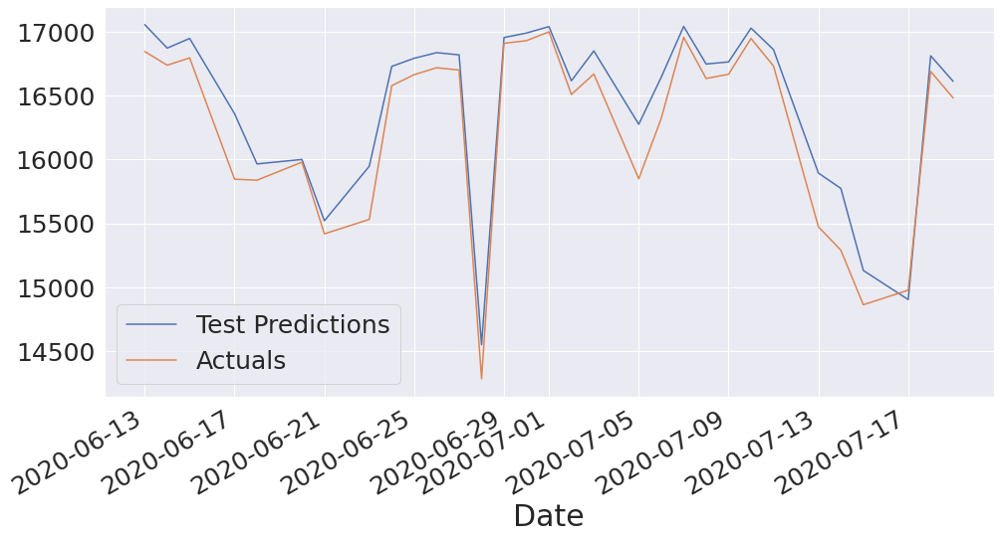

In [ ]:
sunnydays4['Test Predictions'][60:91].plot(figsize=(16,8), label='Test Predictions')
sunnydays4['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
mixdays4 = mixeddays4[['Test Predictions',	'Actuals']]
mixdays4

,Test Predictions,Actuals
Date,,
2020-01-01,11083.733398,10656.0
2020-01-02,11162.213867,10756.0
2020-01-03,11266.438477,10910.0
2020-01-04,11122.605469,10739.0
2020-01-05,11339.690430,11022.0
2020-01-06,11415.882812,11098.0
2020-01-07,10375.161133,9882.0
2020-01-08,11168.352539,10623.0
2020-01-18,11741.023438,11514.0


In [ ]:
mixarrap4 = mixeddays4['Test Predictions'].to_numpy()
mixac4 = mixeddays4['Actuals'].to_numpy()

In [ ]:
Rsquaredmix4 =r2_score(mixac4, mixarrap4)
mapemix4 = tf.keras.metrics.mean_absolute_percentage_error(mixac4, mixarrap4)
maemix4 = tf.keras.metrics.mean_absolute_error(mixac4, mixarrap4)

mmix4 = tf.keras.metrics.RootMeanSquaredError()
mmix4.update_state(mixac4, mixarrap4)
rmsemix4 = mmix4.result().numpy()
meanmix4 =np.mean(mixac4)
print('Rsqrared: ', Rsquaredmix4), print('MAPE: ',mapemix4), print('MAE: ',maemix4), print('RMSE: ',rmsemix4), print('Mean: ',meanmix4)



Rsqrared:  0.8534622585174859
MAPE:  tf.Tensor(3.225659, shape=(), dtype=float32)
MAE:  tf.Tensor(367.9863, shape=(), dtype=float32)
RMSE:  438.22742
Mean:  11717.993710691824


(None, None, None, None, None)

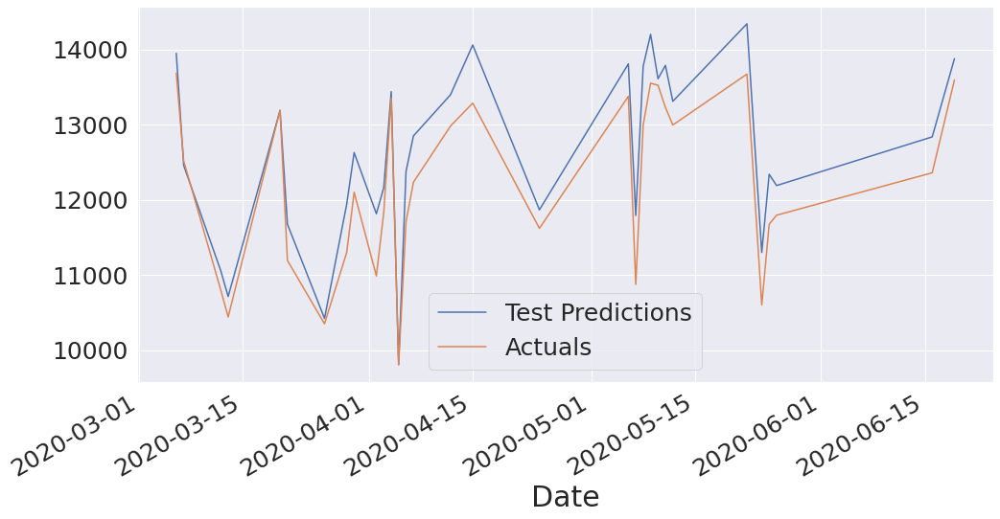

In [ ]:
mixeddays4['Test Predictions'][50:81].plot(figsize=(16,8), label='Test Predictions')
mixeddays4['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
plt.legend()

In [ ]:
cloudydays4 = cloudydays4[['Test Predictions',	'Actuals']]
cloudydays4

,Test Predictions,Actuals
Date,,
2020-01-09,9846.333008,9184.0
2020-01-10,10109.884766,9291.0
2020-01-11,5209.046875,5059.0
2020-01-12,2335.960205,1732.0
2020-01-13,6760.846680,6146.0
2020-01-14,8586.463867,8538.0
2020-01-15,4826.811035,3950.0
2020-01-16,6719.083496,6386.0
2020-01-17,8872.462891,8237.0


In [ ]:
cloudyarrap4 = cloudydays4['Test Predictions'].to_numpy()
cloudyac4 = cloudydays4['Actuals'].to_numpy()

In [ ]:
Rsquaredcloudy4 =r2_score(cloudyac4, cloudyarrap4)
mapecloudy4 = tf.keras.metrics.mean_absolute_percentage_error(cloudyac4, cloudyarrap4)
maecloudy4 = tf.keras.metrics.mean_absolute_error(cloudyac4, cloudyarrap4)

mcloudy4 = tf.keras.metrics.RootMeanSquaredError()
mcloudy4.update_state(cloudyac4, cloudyarrap4)
rmsecloudy4 = mcloudy4.result().numpy()
meancloudy4 =np.mean(cloudyac4)
print('Rsqrared: ', Rsquaredcloudy4), print('MAPE: ',mapecloudy4), print('MAE: ',maecloudy4), print('RMSE: ',rmsecloudy4), print('Mean: ',meancloudy4)

Rsqrared:  0.8394810751296528
MAPE:  tf.Tensor(9.119994, shape=(), dtype=float32)
MAE:  tf.Tensor(610.0728, shape=(), dtype=float32)
RMSE:  679.4193
Mean:  7225.5


(None, None, None, None, None)

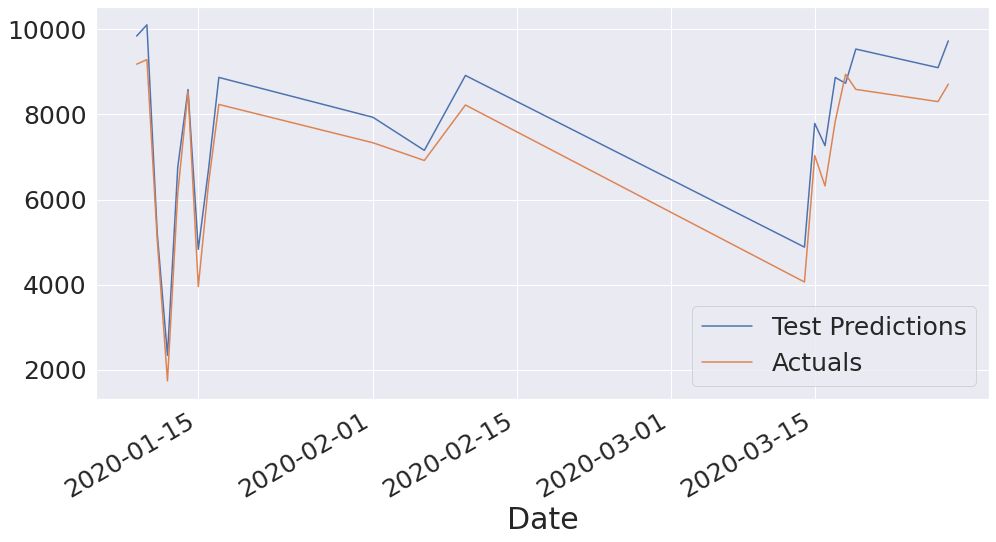

In [ ]:
cloudydays4['Test Predictions'][:20].plot(figsize=(16,8), label='Test Predictions')
cloudydays4['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
plt.legend()

# **COMPARISON**

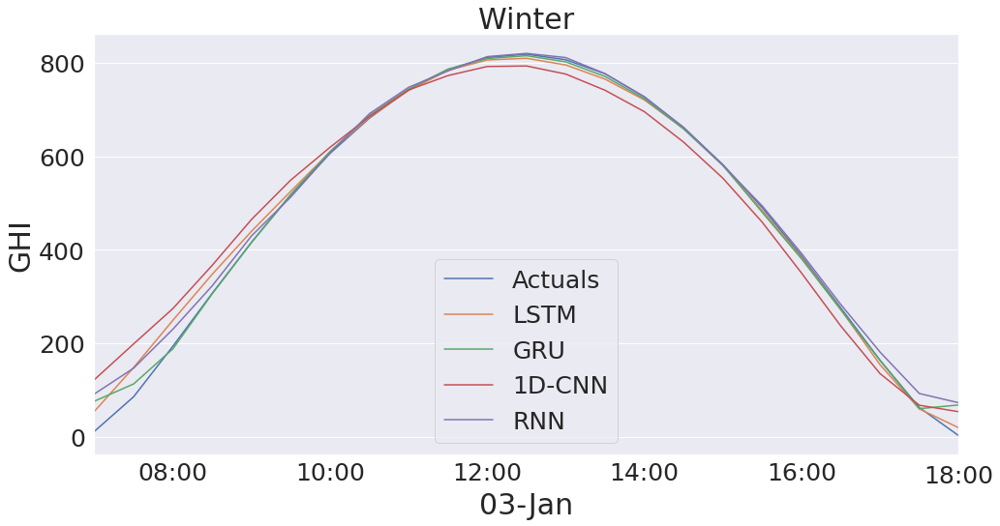

In [ ]:
test_results10['Actuals'][46:69].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][46:69].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][46:69].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][46:69].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][46:69].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('03-Jan')
plt.ylabel('GHI')
plt.legend()

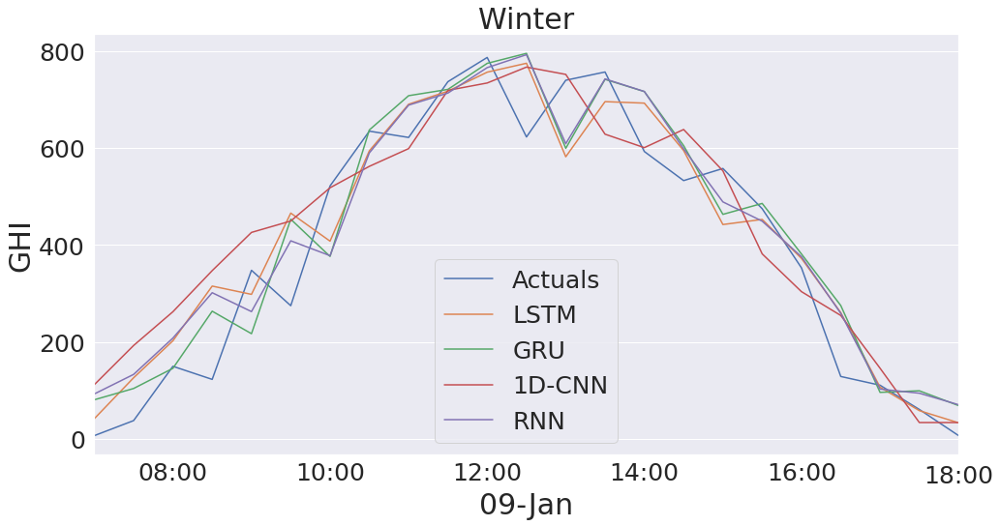

In [ ]:
test_results10['Actuals'][184:207].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][184:207].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][184:207].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][184:207].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][184:207].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('09-Jan')
plt.ylabel('GHI')
plt.legend()

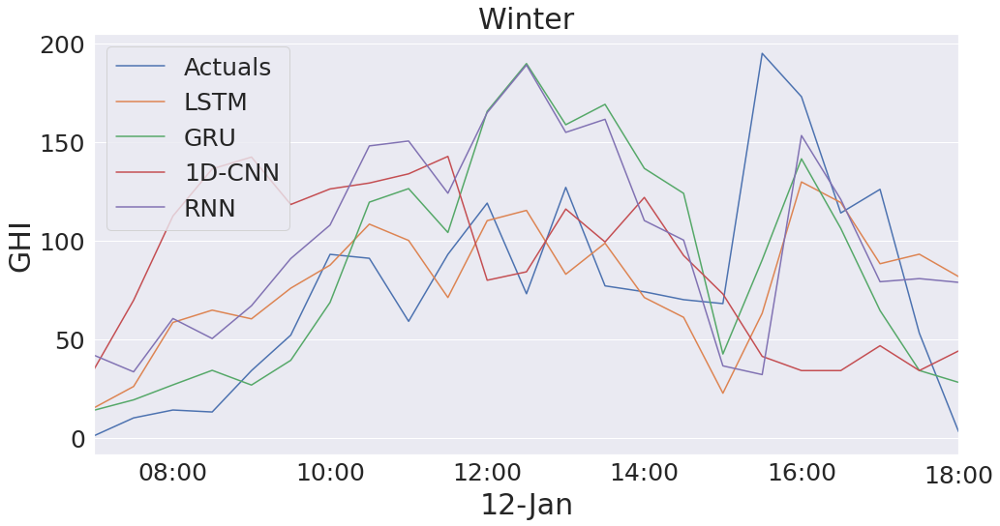

In [ ]:
test_results10['Actuals'][253:276].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][253:276].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][253:276].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][253:276].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][253:276].plot(figsize=(16,8), label='RNN')
plt.title('Winter')
plt.xlabel('12-Jan')
plt.ylabel('GHI')
plt.legend()

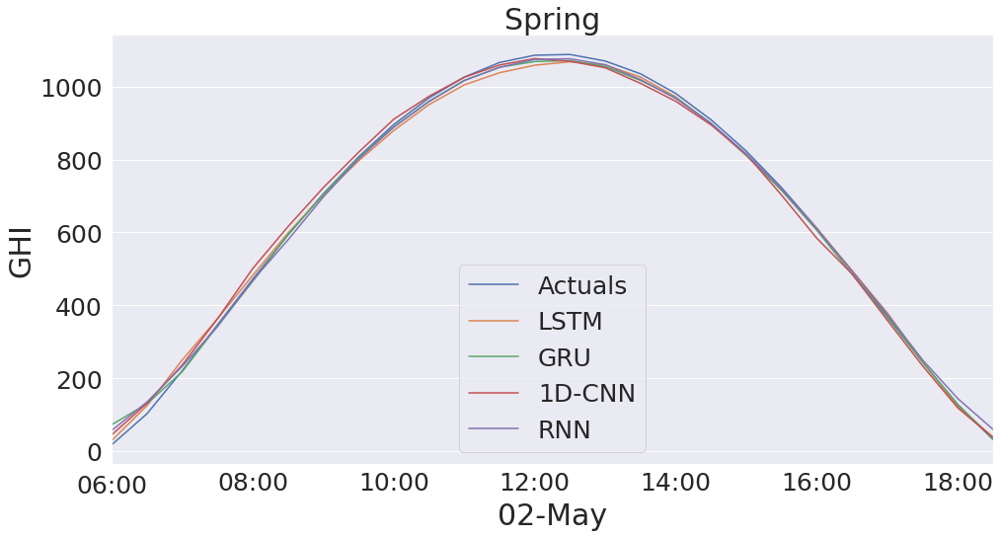

In [ ]:
test_results10['Actuals'][2939:2965].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][2939:2965].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][2939:2965].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][2939:2965].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][2939:2965].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('02-May')
plt.ylabel('GHI')
plt.legend()

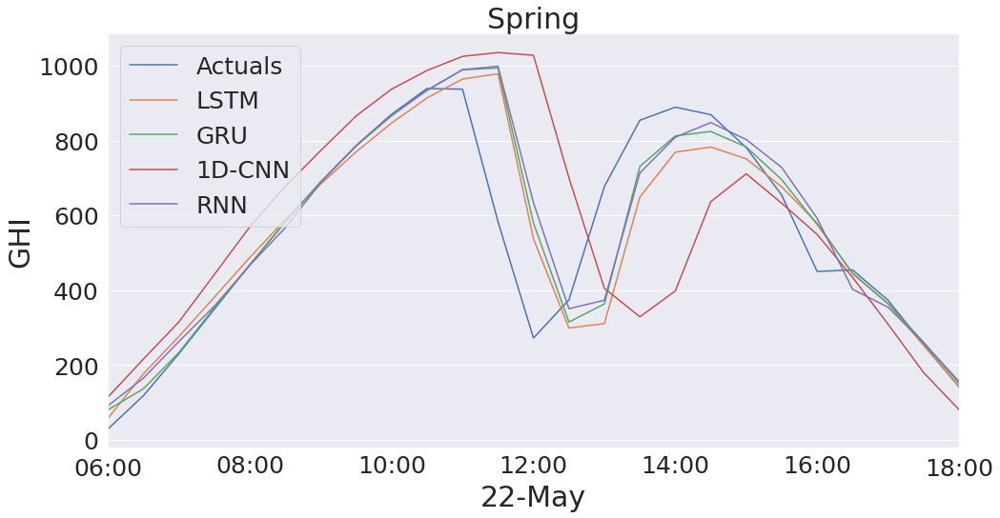

In [ ]:
test_results10['Actuals'][3463:3488].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][3463:3488].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][3463:3488].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][3463:3488].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][3463:3488].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('22-May')
plt.ylabel('GHI')
plt.legend()

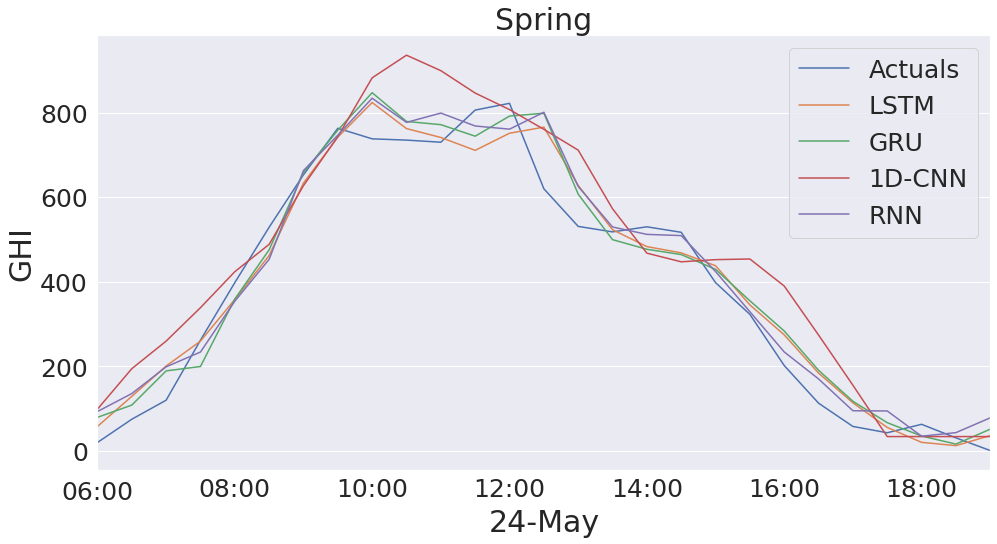

In [ ]:
test_results10['Actuals'][3517:3544].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][3517:3544].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][3517:3544].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][3517:3544].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][3517:3544].plot(figsize=(16,8), label='RNN')
plt.title('Spring')
plt.xlabel('24-May')
plt.ylabel('GHI')
plt.legend()

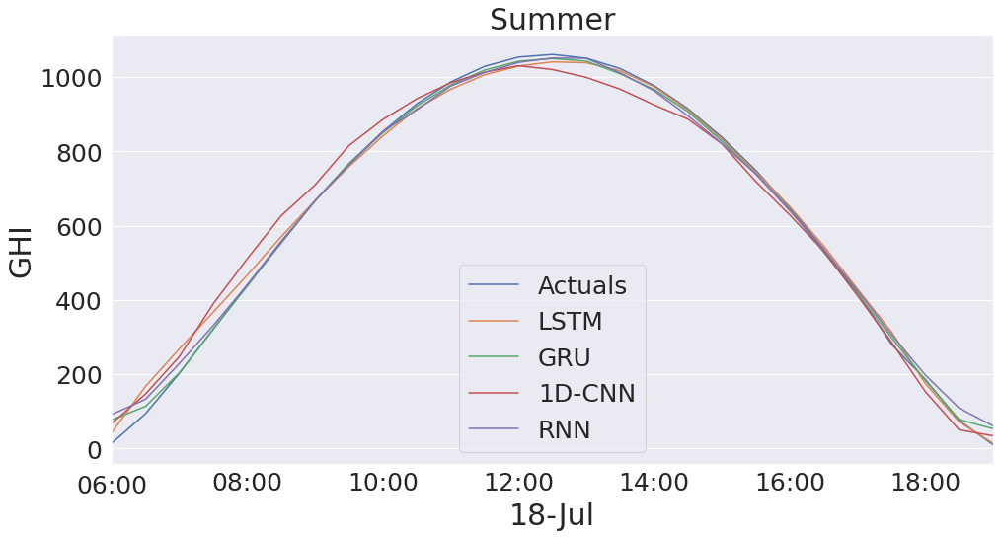

In [ ]:
test_results10['Actuals'][5002:5029].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][5002:5029].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][5002:5029].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][5002:5029].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][5002:5029].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('18-Jul')
plt.ylabel('GHI')
plt.legend()

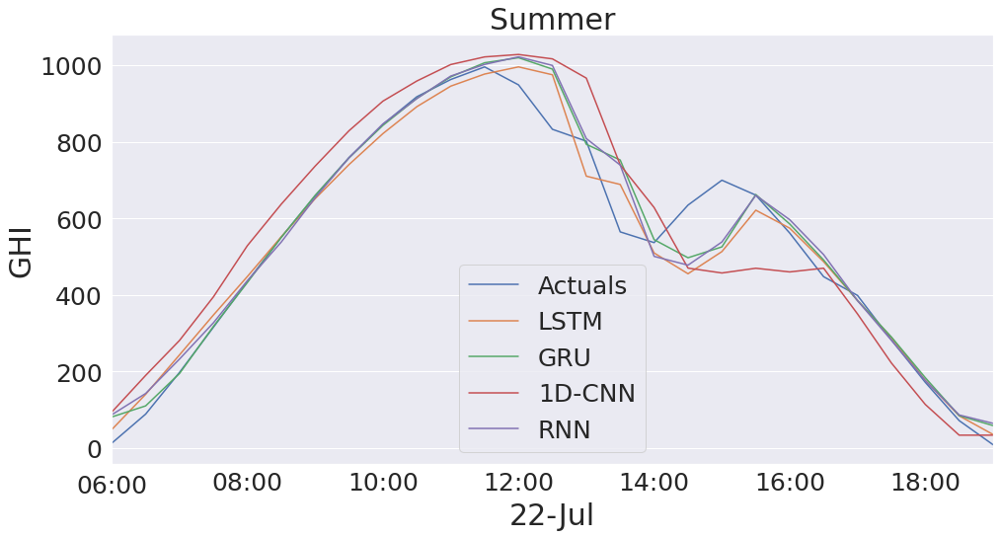

In [ ]:
test_results10['Actuals'][5110:5137].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][5110:5137].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][5110:5137].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][5110:5137].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][5110:5137].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('22-Jul')
plt.ylabel('GHI')
plt.legend()

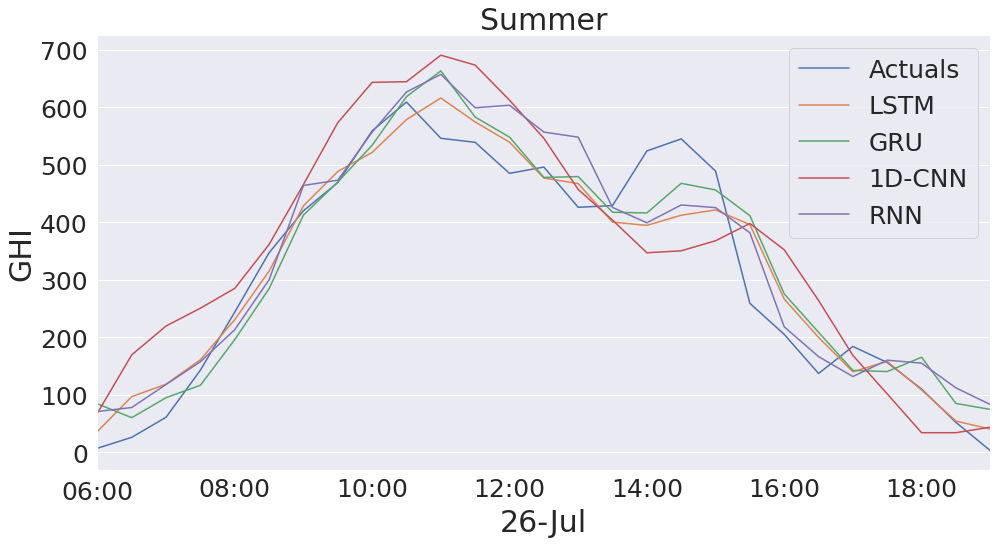

In [ ]:
test_results10['Actuals'][5218:5245].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][5218:5245].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][5218:5245].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][5218:5245].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][5218:5245].plot(figsize=(16,8), label='RNN')
plt.title('Summer')
plt.xlabel('26-Jul')
plt.ylabel('GHI')
plt.legend()

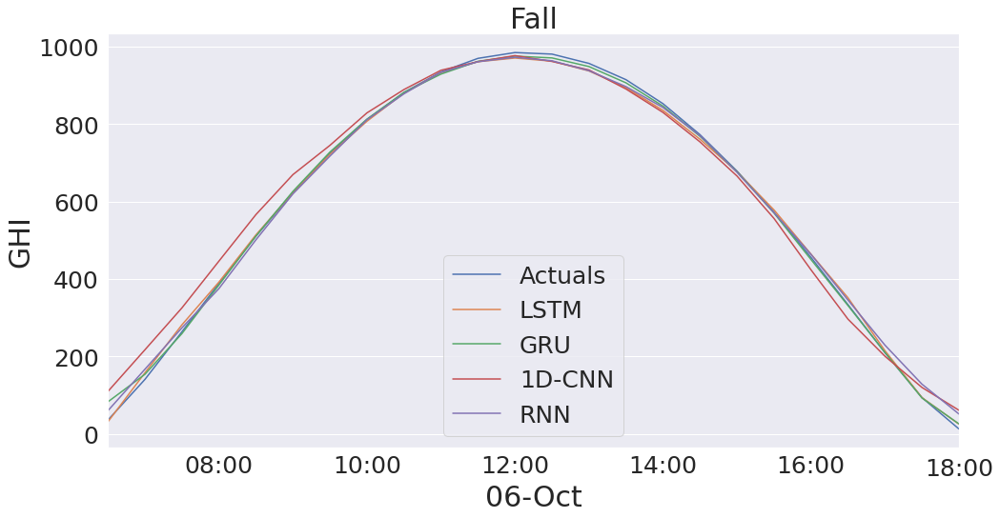

In [ ]:
test_results10['Actuals'][7064:7088].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][7064:7088].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][7064:7088].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][7064:7088].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][7064:7088].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('06-Oct')
plt.ylabel('GHI')
plt.legend()

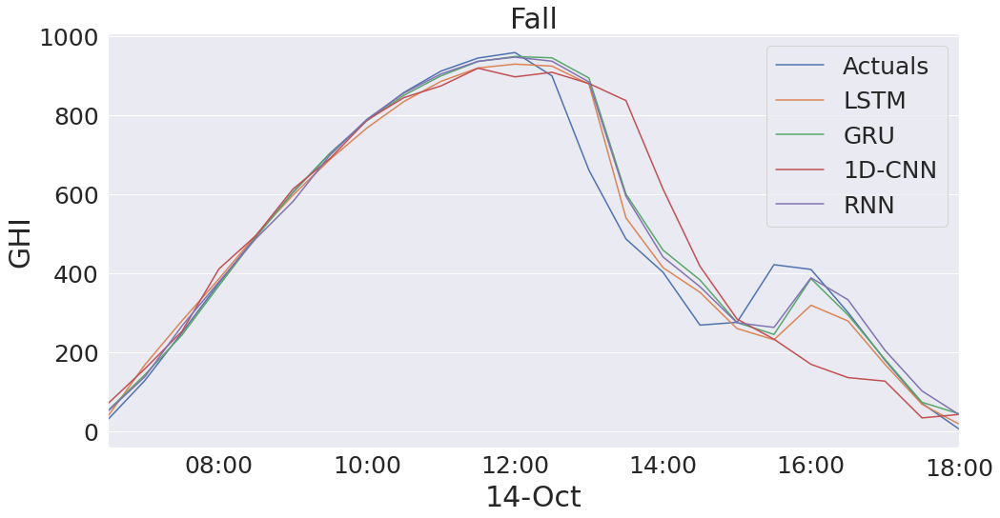

In [ ]:
test_results10['Actuals'][7256:7280].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][7256:7280].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][7256:7280].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][7256:7280].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][7256:7280].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('14-Oct')
plt.ylabel('GHI')
plt.legend()

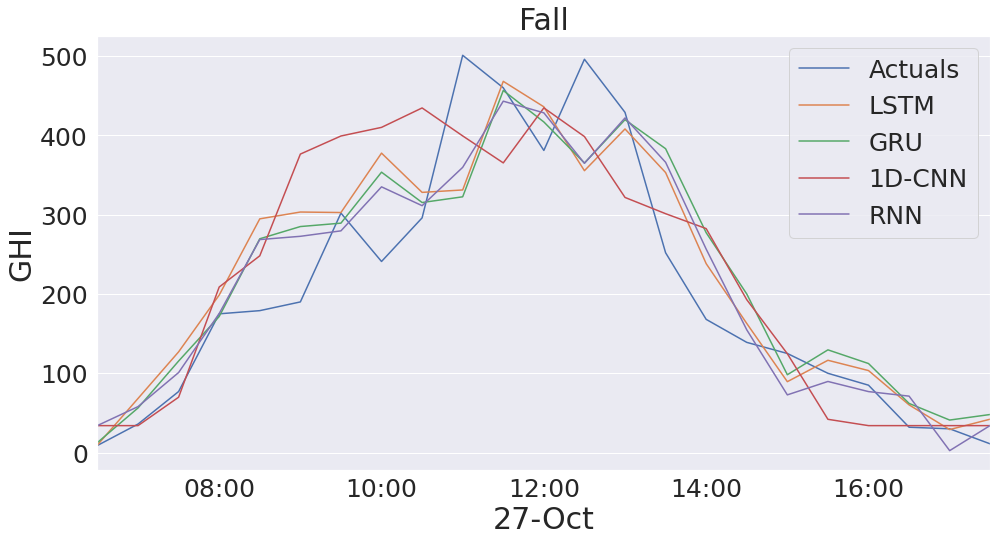

In [ ]:
test_results10['Actuals'][7566:7589].plot(figsize=(16,8), label='Actuals')
test_results10['Test Predictions'][7566:7589].plot(figsize=(16,8), label='LSTM')
test_results20['Test Predictions'][7566:7589].plot(figsize=(16,8), label='GRU')
test_results30['Test Predictions'][7566:7589].plot(figsize=(16,8), label='1D-CNN')
test_results40['Test Predictions'][7566:7589].plot(figsize=(16,8), label='RNN')
plt.title('Fall')
plt.xlabel('27-Oct')
plt.ylabel('GHI')
plt.legend()

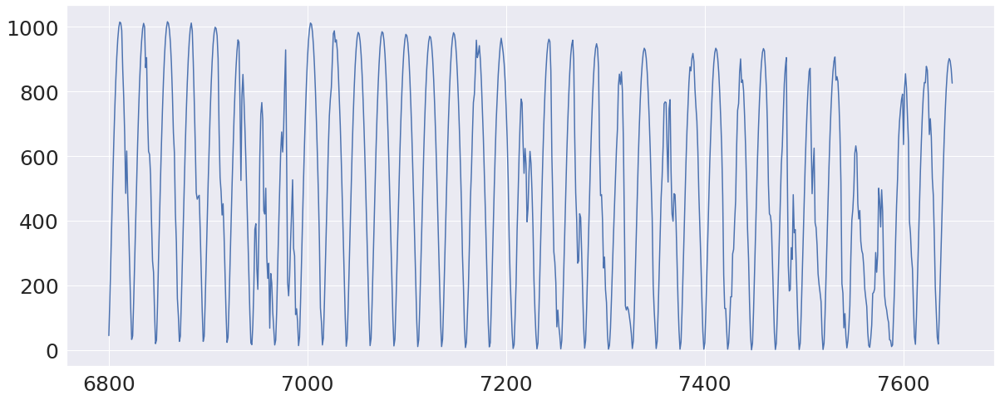

In [ ]:
test_results1['Actuals'][6800:7650].plot(figsize=(20,8), label='Actuals')

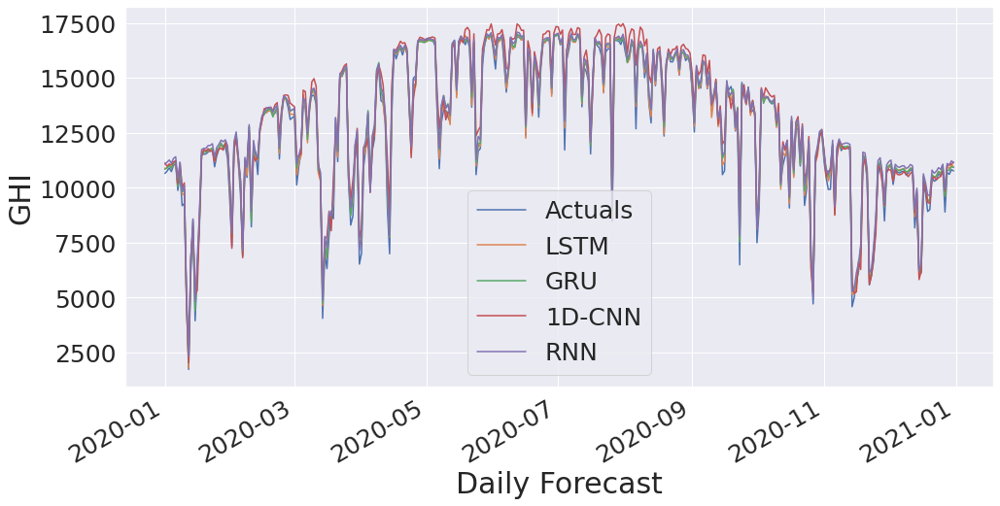

In [ ]:
Fullyear1['Actuals'][:].plot(figsize=(16,8), label='Actuals')
Fullyear1['Test Predictions'][:].plot(figsize=(16,8), label='LSTM')
Fullyear2['Test Predictions'][:].plot(figsize=(16,8), label='GRU')
Fullyear3['Test Predictions'][:].plot(figsize=(16,8), label='1D-CNN')
Fullyear4['Test Predictions'][:].plot(figsize=(16,8), label='RNN')
plt.xlabel('Daily Forecast')
plt.ylabel('GHI')
plt.legend()

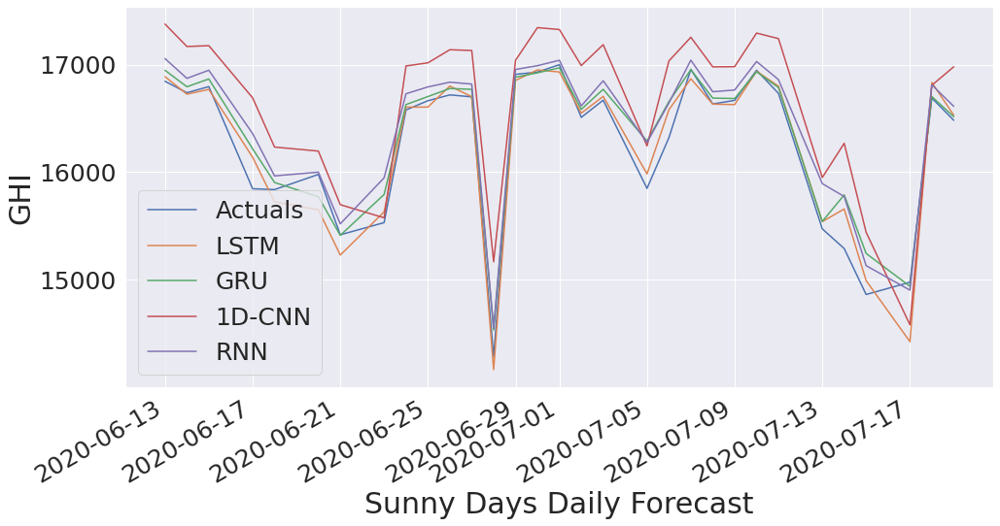

In [ ]:
sunnydays1['Actuals'][60:91].plot(figsize=(16,8), label='Actuals')
sunnydays1['Test Predictions'][60:91].plot(figsize=(16,8), label='LSTM')
sunnydays2['Test Predictions'][60:91].plot(figsize=(16,8), label='GRU')
sunnydays3['Test Predictions'][60:91].plot(figsize=(16,8), label='1D-CNN')
sunnydays4['Test Predictions'][60:91].plot(figsize=(16,8), label='RNN')
plt.xlabel('Sunny Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

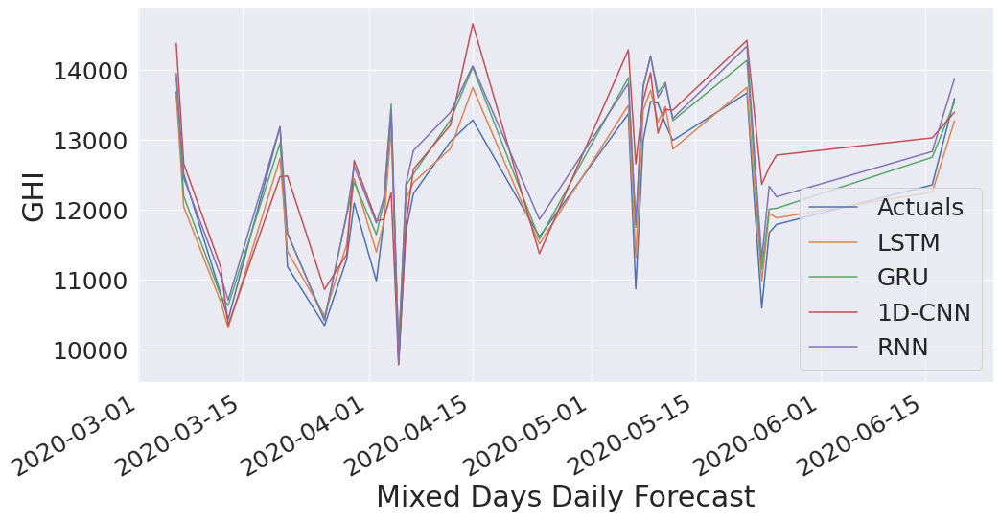

In [ ]:
mixeddays1['Actuals'][50:81].plot(figsize=(16,8), label='Actuals')
mixeddays1['Test Predictions'][50:81].plot(figsize=(16,8), label='LSTM')
mixeddays2['Test Predictions'][50:81].plot(figsize=(16,8), label='GRU')
mixeddays3['Test Predictions'][50:81].plot(figsize=(16,8), label='1D-CNN')
mixeddays4['Test Predictions'][50:81].plot(figsize=(16,8), label='RNN')
plt.xlabel('Mixed Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

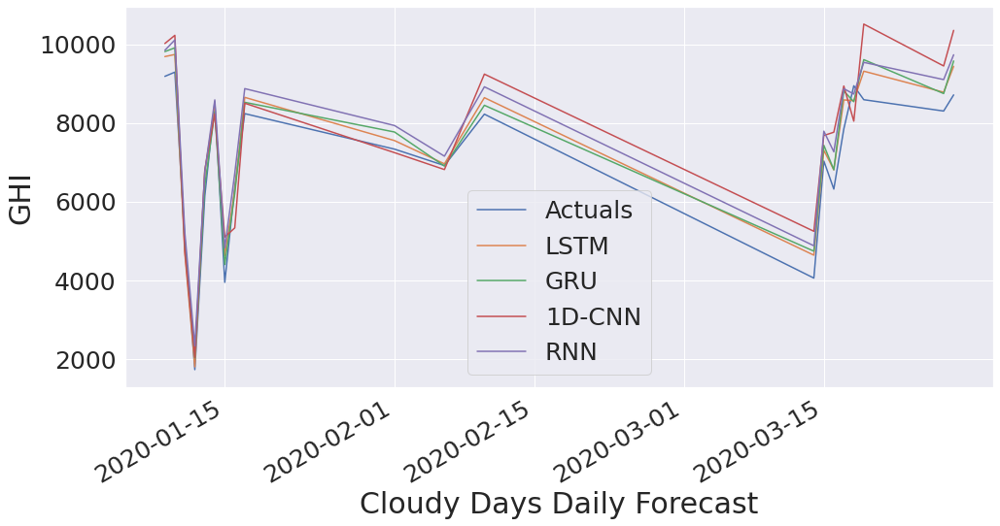

In [ ]:
cloudydays1['Actuals'][:20].plot(figsize=(16,8), label='Actuals')
cloudydays1['Test Predictions'][:20].plot(figsize=(16,8), label='LSTM')
cloudydays2['Test Predictions'][:20].plot(figsize=(16,8), label='GRU')
cloudydays3['Test Predictions'][:20].plot(figsize=(16,8), label='1D-CNN')
cloudydays4['Test Predictions'][:20].plot(figsize=(16,8), label='RNN')
plt.xlabel('Cloudy Days Daily Forecast')
plt.ylabel('GHI')
plt.legend()

# **Evaluation Parameters Barcharts**

In [ ]:

columns = ["Models", "R2_SCORE%", "MAE", "RMSE"]
HawaiiHourly = pd.DataFrame.from_records([("1D-CNN", Rsquared3*100, mae3.numpy(),rmse3),
                                          ("RNN", Rsquared4*100, mae4.numpy(), rmse4),
                                          ("LSTM", Rsquared1*100, mae1.numpy(), rmse1),
                                          ("GRU", Rsquared2*100, mae2.numpy(), rmse2)],
                                       columns=columns)
HawaiiHourlymelted = pd.melt(HawaiiHourly, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")


In [ ]:
def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() + (p.get_height()*0.01)
                value = '{:.1f}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center") 
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)
                value = '{:.1f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left")

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

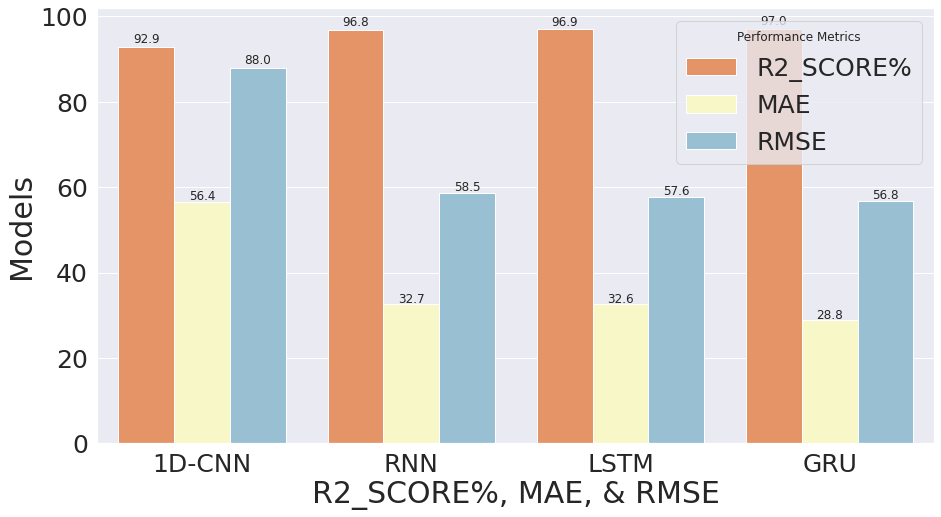

In [ ]:

a = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=HawaiiHourlymelted, errwidth=0, palette="RdYlBu", alpha=1)
a.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
a.set_ylabel("Models",fontsize=30)
a.tick_params(labelsize=25)

show_values(a)


In [ ]:
HawaiiHourly.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,92.876169,56.427711,87.997337
RNN,96.847452,32.664051,58.538769
LSTM,96.945668,32.634563,57.619675
GRU,97.032251,28.836130,56.797119


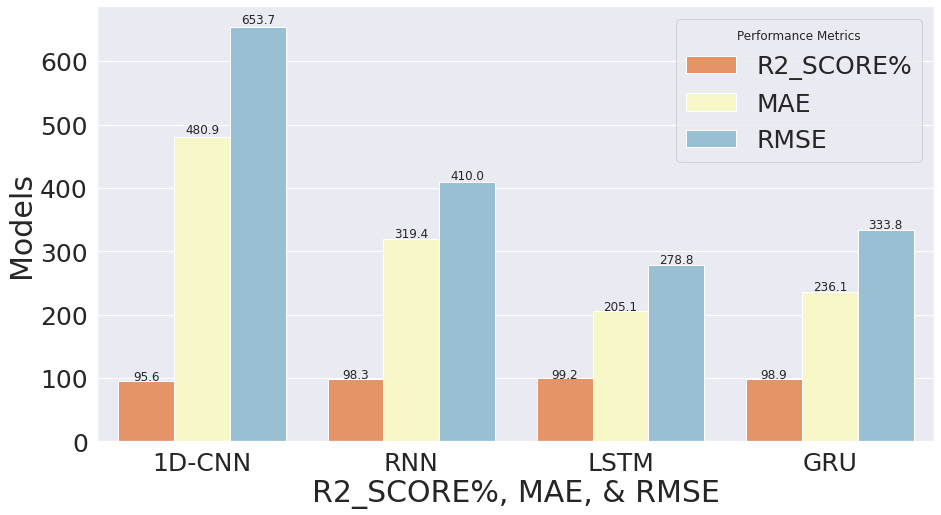

In [ ]:
columns1 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Daily = pd.DataFrame.from_records([("1D-CNN", RsquaredFullyear3*100, maeFullyear3.numpy(), rmseFullyear3),
                                          ("RNN", RsquaredFullyear4*100, maeFullyear4.numpy(), rmseFullyear4),
                                          ("LSTM", RsquaredFullyear1*100, maeFullyear1.numpy(), rmseFullyear1),
                                          ("GRU", RsquaredFullyear2*100, maeFullyear2.numpy(), rmseFullyear2)],
                                       columns=columns1)
Dailymelted = pd.melt(Daily, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

b = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Dailymelted, errwidth=0, palette="RdYlBu", alpha=1)
b.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
b.set_ylabel("Models",fontsize=30)
b.tick_params(labelsize=25)

show_values(b)

In [ ]:
Daily.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,95.649583,480.925781,653.730164
RNN,98.288779,319.417480,410.002075
LSTM,99.208787,205.064377,278.791656
GRU,98.866047,236.113907,333.757202


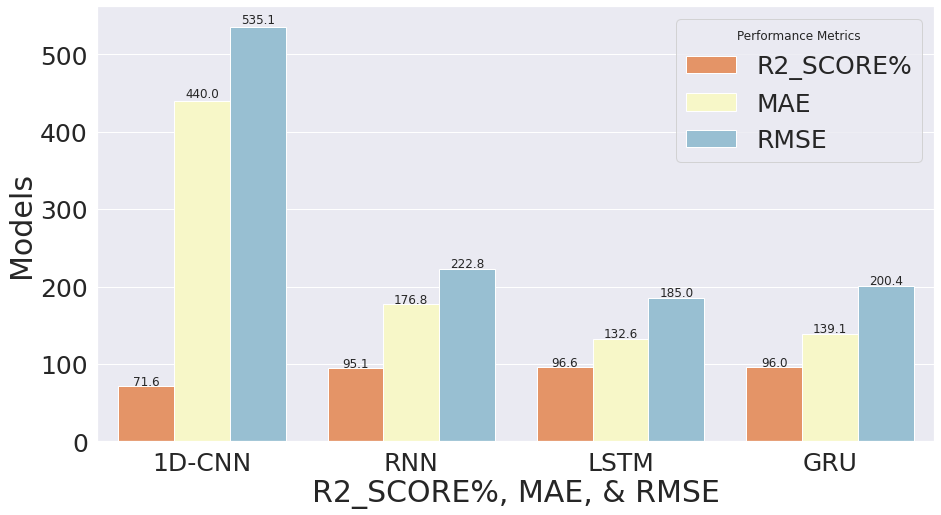

In [ ]:
columns2 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Sunny = pd.DataFrame.from_records([("1D-CNN", Rsquaredsunny3*100, maesunny3.numpy(), rmsesunny3),
                                          ("RNN", Rsquaredsunny4*100, maesunny4.numpy(), rmsesunny4),
                                          ("LSTM", Rsquaredsunny1*100, maesunny1.numpy(), rmsesunny1),
                                          ("GRU", Rsquaredsunny2*100, maesunny2.numpy(), rmsesunny2)],
                                       columns=columns2)
Sunnymelted = pd.melt(Sunny, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

c = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Sunnymelted, errwidth=0, palette="RdYlBu", alpha=1)
c.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
c.set_ylabel("Models",fontsize=30)
c.tick_params(labelsize=25)

show_values(c)

In [ ]:
Sunny.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,71.554242,439.983215,535.131042
RNN,95.070424,176.755890,222.769714
LSTM,96.600750,132.585892,184.987732
GRU,96.012332,139.053101,200.359924


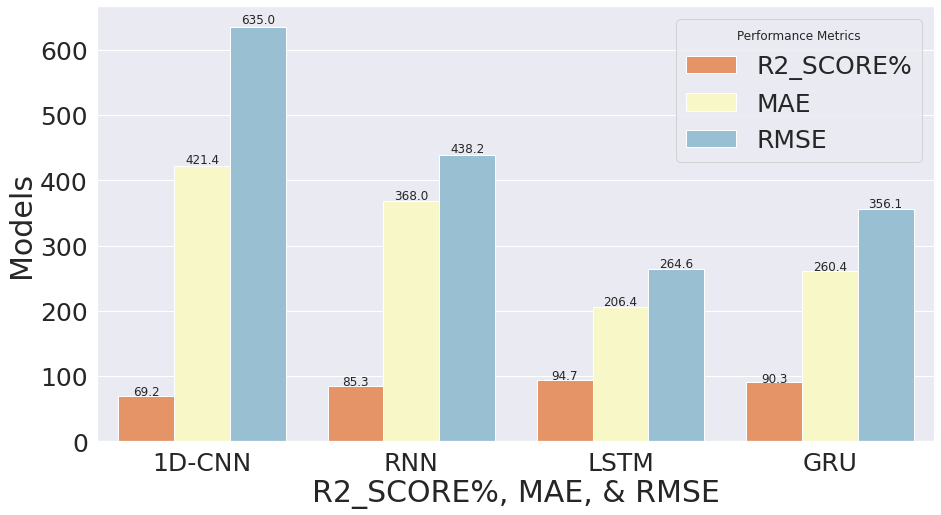

In [ ]:
columns3 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Mixed = pd.DataFrame.from_records([("1D-CNN", Rsquaredmix3*100, maemix3.numpy(), rmsemix3),
                                          ("RNN", Rsquaredmix4*100, maemix4.numpy(), rmsemix4),
                                          ("LSTM", Rsquaredmix1*100, maemix1.numpy(), rmsemix1),
                                          ("GRU", Rsquaredmix2*100, maemix2.numpy(), rmsemix2)],
                                       columns=columns3)
Mixedmelted = pd.melt(Mixed, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

d = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Mixedmelted, errwidth=0, palette="RdYlBu", alpha=1)
d.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
d.set_ylabel("Models",fontsize=30)
d.tick_params(labelsize=25)

show_values(d)

In [ ]:
Mixed.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,69.236393,421.426971,634.955688
RNN,85.346226,367.986298,438.227417
LSTM,94.658695,206.399734,264.574799
GRU,90.326693,260.382233,356.051086


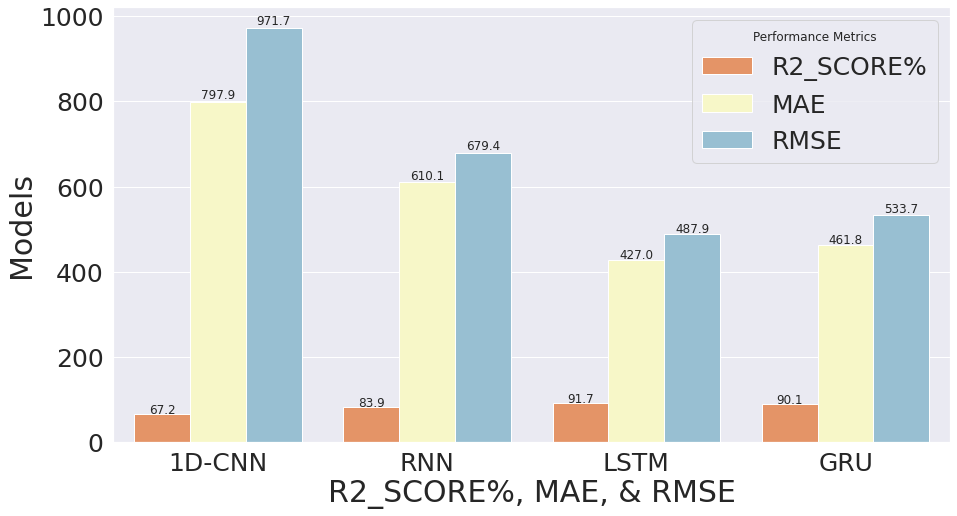

In [ ]:
columns4 = ["Models", "R2_SCORE%", "MAE", "RMSE"]
Cloudy = pd.DataFrame.from_records([("1D-CNN", Rsquaredcloudy3*100, maecloudy3.numpy(), rmsecloudy3),
                                          ("RNN", Rsquaredcloudy4*100, maecloudy4.numpy(), rmsecloudy4),
                                          ("LSTM", Rsquaredcloudy1*100, maecloudy1.numpy(), rmsecloudy1),
                                          ("GRU", Rsquaredcloudy2*100, maecloudy2.numpy(), rmsecloudy2)],
                                       columns=columns4)
Cloudymelted = pd.melt(Cloudy, id_vars=columns[0],
                           var_name="Performance Metrics", value_name="R2_SCORE%, MAE, & RMSE")

e = sns.barplot(x=columns[0], y="R2_SCORE%, MAE, & RMSE", hue="Performance Metrics",
                data=Cloudymelted, errwidth=0, palette="RdYlBu", alpha=1)

e.set_xlabel("R2_SCORE%, MAE, & RMSE",fontsize=30)
e.set_ylabel("Models",fontsize=30)
e.tick_params(labelsize=25)

show_values(e)

In [ ]:
Cloudy.set_index('Models')

,R2_SCORE%,MAE,RMSE
Models,,,
1D-CNN,67.166199,797.872681,971.707153
RNN,83.948108,610.072815,679.419312
LSTM,91.723047,426.950745,487.876648
GRU,90.096825,461.770325,533.656738
